# Business Cases for Data Science

In [1]:
import os
from pathlib import Path
from math import ceil
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.cluster import SpectralClustering
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, normalize 
from sklearn.decomposition import PCA 

<div class="alert alert-block alert-success">

## Collect initial data
    
</div>

In [3]:
df = pd.read_excel('WonderfulWinesoftheWorld.xlsx')

#####  Describe, explore and assess the data 

In [4]:
# Display info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001 entries, 0 to 10000
Data columns (total 30 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Custid       10000 non-null  float64
 1   Dayswus      10001 non-null  float64
 2   Age          10001 non-null  float64
 3   Edu          10001 non-null  float64
 4   Income       10001 non-null  float64
 5   Kidhome      10001 non-null  float64
 6   Teenhome     10001 non-null  float64
 7   Freq         10001 non-null  float64
 8   Recency      10001 non-null  float64
 9   Monetary     10001 non-null  float64
 10  LTV          10001 non-null  float64
 11  Perdeal      10001 non-null  float64
 12  Dryred       10001 non-null  float64
 13  Sweetred     10001 non-null  float64
 14  Drywh        10001 non-null  float64
 15  Sweetwh      10001 non-null  float64
 16  Dessert      10001 non-null  float64
 17  Exotic       10001 non-null  float64
 18  WebPurchase  10001 non-null  float64
 19  WebV

In [5]:
df.head(10)

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend,Rand
0,5325.0,653.0,55.0,20.0,78473.0,0.0,0.0,20.0,18.0,826.0,...,0,0,0,0,0,0,0,0,0,0.240092
1,3956.0,1041.0,75.0,18.0,105087.0,0.0,0.0,36.0,33.0,1852.0,...,0,0,0,1,0,0,0,0,0,0.435944
2,3681.0,666.0,18.0,12.0,27984.0,1.0,0.0,4.0,56.0,39.0,...,0,0,0,0,0,0,0,0,0,0.350584
3,2829.0,1049.0,42.0,16.0,61748.0,1.0,1.0,2.0,46.0,37.0,...,0,0,0,0,0,0,0,1,1,0.594082
4,8788.0,837.0,47.0,16.0,65789.0,0.0,1.0,2.0,3.0,36.0,...,0,0,0,0,0,0,0,0,0,0.782248
5,4356.0,916.0,54.0,20.0,76751.0,0.0,0.0,17.0,17.0,658.0,...,0,0,0,0,0,0,0,1,0,0.726999
6,7003.0,874.0,42.0,15.0,51644.0,1.0,1.0,2.0,19.0,33.0,...,1,0,0,0,0,1,0,1,0,0.464131
7,1815.0,1063.0,70.0,16.0,83942.0,0.0,0.0,29.0,20.0,1407.0,...,0,0,0,0,0,0,0,0,0,0.022904
8,9139.0,853.0,26.0,17.0,33186.0,1.0,1.0,2.0,86.0,21.0,...,0,0,0,0,0,0,0,0,0,0.333297
9,6511.0,881.0,53.0,17.0,88538.0,0.0,1.0,17.0,12.0,651.0,...,0,0,0,0,0,0,0,0,0,0.870078


In [6]:
df.dtypes

Custid         float64
Dayswus        float64
Age            float64
Edu            float64
Income         float64
Kidhome        float64
Teenhome       float64
Freq           float64
Recency        float64
Monetary       float64
LTV            float64
Perdeal        float64
Dryred         float64
Sweetred       float64
Drywh          float64
Sweetwh        float64
Dessert        float64
Exotic         float64
WebPurchase    float64
WebVisit       float64
SMRack           int64
LGRack           int64
Humid            int64
Spcork           int64
Bucket           int64
Access           int64
Complain         int64
Mailfriend       int64
Emailfriend      int64
Rand           float64
dtype: object

In [7]:
df.columns

Index(['Custid', 'Dayswus', 'Age', 'Edu', 'Income', 'Kidhome', 'Teenhome',
       'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred',
       'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit',
       'SMRack', 'LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Complain',
       'Mailfriend', 'Emailfriend', 'Rand'],
      dtype='object')

In [8]:
# Summary statistics for all variables
df.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
Custid,10000.0,6000.500000,2886.895680,1001.000000,3500.750000,6000.500000,8500.250000,11000.000000
Dayswus,10001.0,898.102000,202.482664,550.000000,724.000000,894.000000,1074.000000,1250.000000
Age,10001.0,47.927300,17.301856,18.000000,33.000000,48.000000,63.000000,78.000000
Edu,10001.0,16.739100,1.876281,12.000000,15.000000,17.000000,18.000000,20.000000
Income,10001.0,69904.358000,27610.852665,10000.000000,47646.000000,70009.000000,92147.000000,140628.000000
Kidhome,10001.0,0.418800,0.493363,0.000000,0.000000,0.000000,1.000000,1.000000
Teenhome,10001.0,0.469800,0.499087,0.000000,0.000000,0.000000,1.000000,1.000000
Freq,10001.0,14.628100,11.968475,1.000000,4.000000,12.000000,24.000000,56.000000
Recency,10001.0,62.406800,69.870762,0.000000,26.000000,52.000000,78.000000,549.000000
Monetary,10001.0,622.555200,647.102966,6.000000,63.000000,383.000000,1077.000000,3052.000000


In [9]:
df.isnull().sum()

Custid         1
Dayswus        0
Age            0
Edu            0
Income         0
Kidhome        0
Teenhome       0
Freq           0
Recency        0
Monetary       0
LTV            0
Perdeal        0
Dryred         0
Sweetred       0
Drywh          0
Sweetwh        0
Dessert        0
Exotic         0
WebPurchase    0
WebVisit       0
SMRack         0
LGRack         0
Humid          0
Spcork         0
Bucket         0
Access         0
Complain       0
Mailfriend     0
Emailfriend    0
Rand           1
dtype: int64

In [10]:
# Check duplicated observations
df.loc[df.duplicated(keep=False), :]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend,Rand


In [11]:
# Define metric and non-metric features
non_metric_features = ["Kidhome","Teenhome","SMRack","LGRack","Humid","Spcork","Access","Bucket","Complain","Mailfriend", "Emailfriend"]
metric_features = df.columns.drop(non_metric_features).to_list() 

In [12]:
%matplotlib inline  

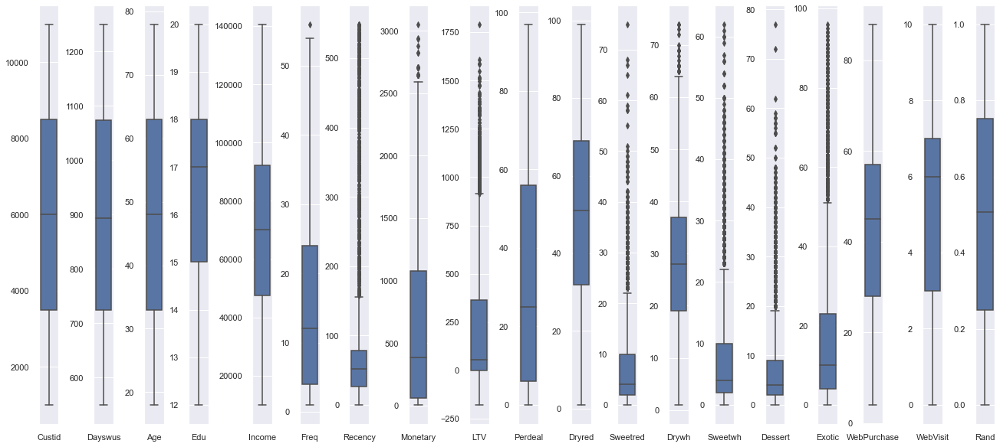

In [13]:
sns.set()

plot_features = df[metric_features].columns
fig, axes = plt.subplots(1, len(plot_features), figsize=(18,8), constrained_layout=True)
j=0
k=1

for i in zip(axes, plot_features):
    sns.boxplot(data=df[metric_features].iloc[:,j:k], ax=i[0])
    j=j+1
    k=k+1
    
#plt.suptitle("Box plot fordata:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABRgAAAJICAYAAAAKMYhkAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4yLjIsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy+WH4yJAAAgAElEQVR4nOzdeVwU9f8H8NcuGIKYB2Eq3tZ6i4ipCEFeqCggeCSm5ol5Z6dSqZG3lnnhkUelaWpqgF+PVBRFPDv06/kzEwXtq4SiIoexO78/aCeHSxZ2d3Z3Xs/Hw0d9htn9vOfY3Zn3fA6VIAgCiIiIiIiIiIiIiEpBLXcAREREREREREREZL2YYCQiIiIiIiIiIqJSY4KRiIiIiIiIiIiISo0JRiIiIiIiIiIiIio1JhiJiIiIiIiIiIio1JhgJCIiIiIiIiIiolJjgpGIiBRv6dKlaNSoUYF/rVu3Ru/evfHVV1/h77//ljvMEtFvy4EDB0r9HgkJCTh37lyJ1l29ejVee+01NG/eHK+++ioyMzNLXW9J7dq1C8nJyWJ5x44daNSoEb7++muT1/10fU//a9y4Mdzd3dGpUye89957Jd5/VHKNGjVCcHBwidYdPHgwGjVqhIcPHxql7ilTpojHOjo6uth133rrLXHd0tJqtdi4cWOJP0+dOnVCmzZtSl1ffk9vb3H/jLV/i3P37l1s377d5PUQERFR2djLHQAREZGl6Ny5M5o0aQIg7wY/IyMDZ86cwcKFC3H27FksW7ZM5ghNb9OmTfj000+xfPnyZ6579OhRfP7556hWrRqGDBkCBwcHODk5mTS+BQsWYM2aNfjxxx9NWk9JtG3bFm3btgUACIKAx48f448//sCePXuwe/duTJ8+Ha+//rrMUSpTSEgI2rZtCwcHB6O/9/79+4tMdGZkZODYsWNlruPdd9/Fnj17EBQUVKL1hwwZgidPnpS53vxCQkLg5uZW5N9NsX+flpaWhu7du6N9+/bo06ePSesiIiKismGCkYiI6B9dunRBaGioZJkgCBgzZgz279+P48ePw8vLS6bozCMtLa3E6168eBEAMHHiRPTr189UIUkYEp+ptW3bFhMmTCiw/Ny5cxg5ciQ+/fRTNGzY0Kgty6hk8n+OjcXV1RUJCQnIysqCo6Njgb8fOnQIT548gZOTU5la8xp6ng8dOrTUdRUnJCQE7dq1M8l7l0RWVhYeP34sW/1ERERUcuwiTUREVAyVSiUmK06fPi1zNJZF32KqSpUqMkdiWVq2bIkZM2ZAq9Xiyy+/lDscMqLOnTsjKysLCQkJhf593759aNiwIerUqWPmyIiIiIjkxQQjERHRM9jZ2QEAnnvuuQJ/2717NwYMGIBWrVrBw8MDAwYMwH/+8x/JOh999BEaNWqEOXPmSJafOXMGTZo0QWBgYLHdG/XjKl65cgUzZ85E+/bt4enpiaFDh+Lnn38u0TacO3cOY8eORbt27dCiRQsEBARg5cqVknoHDx4sdgMfN25csWPINWrUqMC6O3bsMGi/pKSkoFGjRli8eDFmzpyJVq1aoV27dtizZ0+hdXbq1Ak7d+4EAPTu3RudOnWS/F0QBKxfvx7dunVD8+bN0blzZ0RFRSE3N7fAex0/fhzDhg2Dp6cnWrVqhddffx179+4tbhcapEePHnBzc8Pp06dx9+5dyd8uXLggHouWLVsiODgYmzdvhiAIBbZ36NChuHLlCkaMGAEPDw+0a9cO06ZNQ1ZWFu7cuYO3334bnp6e8PLywnvvvYd79+4ViKUkx0Jv79696Nu3Lzw8PPDqq69i4cKFSExMLHB8GzVqhClTpmDlypVo06YN2rRpI46B+fjxYyxfvhzBwcHw8PBAixYt4O/vj/nz50ta9emP/6JFi7Bnzx707NkTLVu2RLdu3bBu3TrodLpCY/ztt98wdOhQtGrVCm3btsXEiRORkpIiWaeoMRi3b9+Ofv36wcPDA97e3hg7diwuX75caD2F6dKlC9RqNX766acCf8vMzMTRo0fRrVu3Il9fkvOuUaNGOHXqFADglVdeweDBgwH8Oy7iuXPnEBAQgBYtWmDAgAEQBKHQMRi1Wi3Wr1+PoKAgtGrVCn5+fnj//fcl45caU0ZGBhYuXIguXbqIY7JOnz690NaYt27dwvTp09GlSxe0aNECHh4eCA0NxebNm8V1duzYgc6dOwMADh48KDkHixqPs7DxWDt16oTBgwdj+/bt6NChAzw8PDB37lzx7yX9Lrhx4wYmTZqEjh07onnz5ujUqRNmzJiB1NTUUu8zIiIiW8IEIxERUTEEQcDOnTthZ2eHLl26SP42b948TJ48GSkpKejVqxd69uyJlJQUvPPOO1iwYIG43tSpU1G9enVs2LABly5dApCXjJg6dSrs7Owwf/78QpOX+U2dOhXR0dEICAhAly5d8Ouvv+LNN98ssjWV3oEDBxAWFoajR4+iQ4cOGDBgAOzs7LBo0SIMGzZMTDLqx60DgICAAIwfP77I9xw/fnyBdfXjV5Z0v+ht3boVe/bsQVhYGFq1aoVWrVoVWueQIUPQuHFjAMDrr7+OIUOGSP7+1VdfYcmSJfD09ERYWBhyc3OxePHiAnVu27YNw4YNw5UrVxAQEIDXX38daWlpmDRpElauXFnsviwplUoFDw8PAMAvv/wiLo+Pj8eAAQNw4sQJdOzYEYMGDYJOp8OMGTMwbdq0Au+TkpKCsLAwCIKAAQMGwNXVFVu2bMGHH36IsLAw3L59G/3790fdunURGxuLTz75RPJ6Q47FN998g0mTJuF///sfgoOD4evri40bNxYaF5A3BudXX32F3r17w8fHB+7u7sjNzcWwYcOwdOlSuLq6YuDAgejTpw+ys7Oxdu1aTJkypdD3mTx5MmrXro0BAwaIcUdERBRY99atW2LC7Y033kDjxo2xb98+DBo06JldkqdNm4aIiAikpaUhODgYr732Go4dO4awsLASJxlfeOEFeHp64vDhwwUmfjp8+DCys7PRvXv3Ql9b0vNu/Pjx4riHo0aNQkhIiOR9xowZgzp16mDAgAFo164dVCpVgboEQcDo0aMxd+5caLVa9O3bF23atMHu3bsxcOBA3Llzp0TbW1KPHj1CWFgYvvrqK9SqVQtDhgyBh4cHtm7din79+kmS7CkpKejTpw9+/PFHtGrVCkOHDkXXrl1x7do1zJgxAxs3bgQANGnSRPyM169fX/IdY6irV68iMjISXbp0Qffu3cXvmJIek3v37mHo0KGIj49H27ZtMWzYMLz00kvYvHkzhgwZYjWTgBEREZmUQEREpHBLliwRNBqNMGbMGGHJkiXCkiVLhMWLFwuzZ88WevfuLTRr1kzYtGmT5DWnT58WNBqN0Lt3byEtLU1cnpaWJvTq1UvQaDTCqVOnxOXx8fGCRqMR+vXrJ+h0OiEyMlLQaDTCqlWrShxf69athRs3bojLf/vtN6Fp06ZC586dhdzcXMm6+/fvFwRBEB49eiS88sorQuvWrYXz58+Lr/3777+Fd999V9BoNMKyZcsK1KV/fUnienpdQ/ZLcnKyoNFohEaNGgmXLl16Zn2CIAgffvihoNFohIsXL4rLtm/fLmg0GqFVq1bCtWvXxOX/+9//hJYtWwpt2rQRtFqtIAiC8OeffwrNmzcXevToIdy7d09cNysrS3j99deFxo0bC1euXCk2Bn19S5YsKXa9efPmCRqNRvj2228FQRCEzMxMoX379kL79u2F5ORkcT2tVitMmDBB0Gg0wuHDh8XlHTt2FDQajTBz5kxx2YMHDwR3d3dBo9EIEydOFHQ6nSAIgpCbmyt07dpV0Gg0QmZmpiAIhh2LP//8U2jZsqXQpUsXITU1VVz3woULQrNmzQSNRiNs375dXK7RaASNRiMcPHhQss27du0SNBqN8MUXX0iWP3r0SOjQoYPQpEkTMT798ddoNMKaNWvEdR8/fiz0799f0Gg0wokTJwrUuWLFCsl7jx07VtBoNMJPP/0kLhs0aJCg0WiEBw8eCIIgCImJiYJGoxEGDhwoPHr0SFzv559/Fho1aiSMHj1aKM7T590333wjaDQa4ejRo5J1Jk6cKHTr1k0QBEEICgoSNBqN+DdDz7v88T8dw/jx4wvE17FjR8HT01Msb9u2TTxHcnJyxOWxsbGCRqMRPvvssxJt74cffih+J+b/97QZM2YIGo1G2Lhxo2T5gQMHxDj0PvnkE0Gj0QjHjh2TrHv27FlBo9EIr7/+urhMf46MGTNGsq5GoxGCgoIKxK3/bK5fv16yb57+HOoZckw2bNggaDQa4YcffpC8x6effipoNBrh0KFDBWIhIiJSGrZgJCIi+sfBgwexbNkyLFu2DMuXL8fXX3+NixcvwsnJCQ8fPoRWqxXX1XfV++CDD1C1alVxedWqVfHuu+8CyOuOqefr64vQ0FCcPXsW06dPx3fffQcPDw+MGDGixPENGjRIMrabu7s7AgICkJycjN9++63Q1xw4cAAPHjzAkCFD0KxZM3G5vb09IiIiUL58eUmcZWXofgGAunXrii0Ty6JHjx5o0KCBWH7xxRfRrFkzPHz4EA8ePAAAxMTE4MmTJ5g4caJk7Mjy5ctj4sSJ0Ol0YjfsstK3Ss3IyAAAxMXF4d69exg5ciRq1aolrqdWq4vcN4B0Ao/nn38eDRs2BAAMGzZMbL1mZ2cnHt/bt28DMOxY7NmzB9nZ2Rg9ejReeOEFcd2mTZsWaEGnV758efj5+UmWNW3aFDNnziww6YizszOaNm0KrVYrHgs9Nzc3vPnmm2LZyckJb7/9NgAgNja2QJ3Dhw+XLHvttdcAoNiuv/ou4e+++y6cnZ3F5a1bt8Y777yDjh07Fvna/Pz9/aFSqSTdpLOzs3HkyJEiWy8a87wrrgu2nn57IyIiJK2je/bsibfeegutW7cuUV07d+4UvxPz/9PLzc3Fjz/+iJdffhlvvPGG5PWdO3dG69atsX//fvFzEBQUhFmzZqFDhw6SdVu2bIny5cubbCKn/PvNkGOi765/9uxZye/A5MmTkZCQIJ6DRERESsZZpImIiP4xZ84cyeyzmZmZ+OOPP7BkyRJ88cUXSEpKEsdRvHz5MtRqNTw9PQu8j35Z/m6XU6dOxbFjx7BlyxY4OTlh/vz54viOJaHvkvy0li1bIiYmBpcvXy40Fn0Mr7zySoG/Va1aFfXr18elS5fw6NEjVKxYscSxFKU0++XpZFtZ1KtXr8CyypUrA8g7llWqVMH58+cB5I27dvXqVcm6+i62hozJVxz97LdOTk4AINZ94cIFLF26tMD6dnZ2BeouV66c2F1WT/9++febg4MDgH8n3zHkWPz3v/8FkHc+5de6dWts3bq1wPLq1asXOH/r16+P+vXrIycnB2fPnsX169dx8+ZNXLhwQRxX8OkEDQB4eHjA3l56SaqPI//+qFGjRoHhBPTJoeK6SF++fBl2dnZo0aJFgb+Fh4cX+brCVK9eHS1btkRcXBxmzJgBtVqNI0eOIDMzs8gEozHPu/znQ2EuX76MmjVr4sUXX5QsV6lUmDx5conqAYBvv/32mbNIX79+HZmZmdBqtYWe1zk5OdBqtbhy5Qo8PT3FMTvT09Nx6dIl3Lx5E9evX8dvv/0mrmts5cqVQ7Vq1STLDDkm3bp1w/Lly7Flyxb89NNP8PHxga+vL/z8/ODq6mr0eImIiKwRE4xERERFcHJyQvPmzbFs2TJ06dIFO3bswKhRo9CgQQNkZGTAwcGh0LETK1asCEdHR2RlZUmWP//882jfvj2io6NRo0YN1KhRw6B48icLAIitzfStg/LTL3+61dbTqlWrhkuXLiErK8soCcbS7Bd9YqysihvHUvhnApVHjx4BAL7//vsi183fwq60bt26BQCoXbu2pO6iJlgprO7y5csXue6zxu005Fjcv38fACStF/XyJ2aKi02n02HVqlVYv369uC0uLi7w8PCAm5sbrl27VmAym8LO6woVKsDR0VHcZ3rFnSv53/dpDx8+hIODA8qVK1fkOobw9/fHggUL8Ouvv8LT0xP79u1DvXr1imyJa8zzrrhzQu/hw4eFHktT0E+k88cff0haNuan374HDx5gzpw52LVrF/7++2+oVCq4ubmhffv2uHjxokliLGyfGXJMXnzxRfzwww9YsWIFDh48iNjYWMTGxqJcuXIIDQ3FRx99ZLTvMSIiImvFBCMREdEzPPfcc/Dw8MDevXtx5coVNGjQABUqVEBWVlahLf9ycnKQnZ0t6XYHACdPnkRMTAwqV66Ma9euYeXKlZgwYUKJ48jOzi6wTH+TnL8uvQoVKgBAgZmM9fTJAX1Lv7IqzX4xJ33rvwMHDoiJP1PIzc3Fb7/9BrVaDXd3d0ndX3/9Nby8vExWt54hx0KfgH78+LGkOzVQdPK6MOvWrcOXX36Jtm3bYtSoUWjSpInYwmvkyJG4du1agdfk5OQUWPbkyROjnitOTk7IyclBbm5ugdaSWVlZcHR0NOj9unXrhgULFmD//v1o0aIFDh8+jEGDBhVbP2D68+7p+vQtaPPLzMwU4zEG/XdMcHAw5s+f/8z133//fXGyo+DgYGg0GvH8y98lvjiFJZTzP7wojqHHpHbt2pg9eza0Wi3Onz+Po0ePYseOHdiyZQsqVqyI999/v8R1ExER2SKOwUhERFQC+kScPlGjb6l05syZAuv+/PPPEAQBL730krgsMzNTbOWyadMmNGzYEKtWrTKoO66+G+vTfv31VwCFd20FIM66+vPPPxf4W0ZGBi5duoS6deuKrdwKm5HWEIbuF0OVNb5GjRoBKHxfJiUlYd68eYiLiytTHQCwb98+pKWloUOHDnBxcZHUre+a+bT09HTMmjUL0dHRZa5bz5BjoR+/8dy5cwXWPXv2bInr3LVrF+zs7LBixQr4+vqKyUVBEPDHH3+I//+0wo7F2bNnIQiCmJwtK41GA61WW2gLubFjx6JNmzYGJadq166NJk2a4MCBAzh27BgyMjKK7B4NmO+809NoNLh9+zZSU1ML/K13794lGsexpOrXr4/nnnsOFy5cKDTp9/XXXyMqKgr379/Hw4cPER8fj+bNm+PTTz9F69atxeRiSkoKcnJyJO9R1Oe9XLlyhXaJL24czvwMOSYHDx7EjBkzkJGRATs7O7i7u2P8+PH47rvvABT+/UpERKQ0TDASERE9w9mzZ3Hq1ClUqlQJbdq0AQBxrMYvvvgC9+7dE9e9d++e2IonODhYXL5w4UIkJydj3LhxaNiwISIjI5Gbm4upU6ciNze3RHGsXbtW0hLxl19+QWxsLJo1a1Zk18wuXbqgYsWK2LRpEy5cuCAuz83NxaxZs5CdnS2JU9+6Sz+On6EM3S+G0sf3999/l+r1QUFBsLOzw5dffilJvuTm5uKzzz7DunXrkJ6eXur4gLxx22bOnAk7OztMmjRJXN61a1c4OztjzZo1uH79uuQ1CxYswLfffoubN2+Wqe6nGXIsAgMDUa5cOaxcuVKy7tWrVwsdf7EoDg4O0Gq1kvcAgKioKLHLeP7z/ezZs9i9e7dYzsjIwOeffw61Wl3kBDOGCgoKAgB8+eWXkpbAv/76K06dOgUPDw+DWzH6+/sjOTkZK1euRN26dcVkflH1G3Le6btyl+U8FwQBCxculIxpuGfPHty4ccOoLWgdHBwQEBCA33//HevXr5f87eTJk5g/fz62b9+OSpUqoVy5clCr1Xj48KHkOyY7OxufffYZAOk2F/V5b9CgAVJSUiRjJ966dQs//vhjieM25Jj88ccf2Lx5MzZv3ix5D/05XbNmzRLXS0REZKvYRZqIiOgfBw4cEG8YgbzJKH7//XccPnwYWq1WnHUZyJs0ZdiwYVi/fj2CgoLEWWgPHTqE1NRUjBo1SpxY5fTp09i0aRM0Gg2GDRsGAGjTpg1CQ0Oxfft2rFq1CuPGjXtmfI8ePUJISAi6du2KjIwM7Nu3D+XLlxdvzAvj7OyM2bNnY/LkyRgwYAC6du0KFxcXnDhxAv/3f/+HNm3aYNSoUeL6+vHwVqxYgUuXLmH8+PEGjS1myH4pDX18c+fORYcOHTB+/HiDXl+vXj28//77mDt3Lnr16oVOnTqhUqVKOHLkCK5du4aOHTuKyahnOXXqlDiphSAIyMzMxNWrV3H8+HEAwKeffippWfr8889j5syZeO+99xASEoIuXbqgWrVqOHXqFP773/+iRYsWBWZILgtDjoWbmxsmTpyIzz//HMHBwejcuTOys7Oxb98+8fir1c9+Lh0UFITffvsNYWFh6NGjB8qVK4eTJ0/iwoULcHFxQVpaWoEEbqVKlfDuu+9iz549ePHFF3H48GEkJydj7NixRpldHAB8fHzQp08fbN++HcHBwXj11Vfx+PFj/Oc//0GFChUwbdo0g9+zW7duWLx4MX777TeMHj262HUNPe/053lERAS8vb0xZMgQg2Lr27cvfvrpJ/z444+4cuUK2rVrhzt37uCnn36Cm5ubQRO9lMSHH36IX3/9FfPmzcPBgwfRsmVLsT57e3vMnj0barUajo6O6Nq1K/bt24d+/frB29sbmZmZOHToEP766y9UqlQJjx49gk6ng1qtRpUqVfDcc8/h5MmTmDNnDrp27Yo2bdqgf//++OyzzzB48GD06tULT548wZ49e6DRaAptsVsYQ45J//79sXXrVixcuBCnTp1Co0aNkJaWhr1798LJycngiYKIiIhsEROMRERE/zh48CAOHjwolsuVK4eqVauiY8eOGDx4cIFZnKdMmYKmTZviu+++Q2xsLOzt7dGkSRNMmzYN/v7+APLGBIuIiAAAREZGSiaZ+OCDD3Do0CGsWLECXbp0EbvsFWXatGk4deoU/vOf/0CtVqNjx46YNGkSGjZsWOzr/P39sWnTJqxYsQJHjx7FkydPUKdOHXzwwQcYMmSIJKaAgADEx8fj8OHD2LRpE0JCQtCgQYOS7UAD9ktpDRw4EL/88gvOnDmDa9euiQlbQwwbNgwNGjTAunXr8NNPP0Gn06F27dqYMmUK3njjjQJj9BXl1KlT4szIQF5LrurVqyM4OBhDhgwptEVbjx49UL16daxatQpHjx5FVlYW3NzcMHbsWIwYMUIcz85YDDkW4eHhcHFxwTfffIPt27ejcuXKePPNN1G1alXMmjWrRC38Bg4cCEEQsHnzZmzbtg0VK1ZE/fr18cUXX8DBwQHjxo1DfHw8PDw8xNe0adMGvXr1wuLFi3HkyBE0bNgQ8+fPL1NL18LMmjULzZs3x5YtW7BlyxY4ODjA19cXkydPLtW4iA0bNkTDhg1x7dq1EnU5NuS8e+utt3Dt2jUcO3YMSUlJBicY9d3U165di+joaHz33XdwdnZGYGAg3nnnHVSqVMng7S1O1apVsXXrVqxatQr79+/Hhg0bULVqVXTq1KlAonj27NmoXr06Dhw4gI0bN8LV1RUtWrRAeHg4du3ahW+++QYnT56El5cXnnvuOUybNg1LlizBpk2bULFiRbRp0waDBg2CVqvFpk2b8P3336NGjRoYPXo0vLy8xJa7JVHSY1KpUiVs3LgRK1aswLFjx3DixAk4OzvD19cX48ePx8svv2zU/UlERGSNVEJxU+4RERGR7JYuXYply5Zh+fLl6NKli9zhkA26f/8+tFptoTMPL1myBMuXL8e2bduKHOuzNFJSUtC5c2d07twZUVFRRntfIiIiIjI/jsFIREREpHAnT56Et7c3li1bJll+79497Ny5E5UqVTJad2UiIiIisj3sIk1ERESkcK+++irc3NywfPly/Pe//4VGo8GDBw9w4MAB3L9/H3PnzhVnGiciIiIiyo8JRiIiIiKFq1ChAr7//nusWbMGhw8fxvHjx+Hk5ITmzZtjxIgRRp11mIiIiIhsD8dgJCIiIiIiIiIiolLjGIxERERERERERERUakwwEhERERERERERUakxwUhERERERERERESlxgQjERERERERERERlRoTjERERERERERERFRqTDASERERERERERFRqTHBSERERERERERERKXGBCMRERERERERERGVGhOMREREREREREREVGpMMBIREREREREREVGpMcFIREREREREREREpcYEIxEREREREREREZWavVwV37//GDqdYPJ61GoVqlSpYPJ6yoL7ovS476TMtT8A69kn+XEfPRv30bPxu+df3Bd5lPy5UcI5oJTjq4RjWRwlbz/PceNSwjYCyj6XLWnblX7Mn6bUfWEp571sCUadTjDbgbd03Belx30nxf3xbNxHz8Z99GzcR//ivsij5P2ghG1XwjYCytnOoih5+5Wy7UrYTiVsY3GUuP1K3OaiKHVfWMp2s4s0ERERERERERERlRoTjERERERERERERFRqTDASEREREZFFysjIQK9evZCSkgIASExMRGBgIPz9/bFo0SJxvUuXLiE0NBTdunXDRx99hNzcXLlCJiIiUiQmGImIiIiIyOKcPXsWYWFhSEpKAgBkZ2cjIiICUVFR2L17N86fP4/4+HgAwPvvv49p06Zh3759EAQBW7dulTFyIiIi5WGCkYiIiIiILM7WrVsxffp0VKtWDQBw7tw51K1bF7Vr14a9vT0CAwOxd+9e3Lp1C9nZ2WjVqhUAIDQ0FHv37pUzdCIiIsWRbRZpIiIiIiKiosyaNUtSvnv3LlxdXcVytWrVcOfOnQLLXV1dcefOHbPFSUREREwwEhERERGRFdDpdFCpVGJZEASoVKoilxvKxcXZKHESEREpEROMRERERERk8apXr47U1FSxnJqaimrVqhVY/tdff4ndqg2RlpYBnU4wSqzFUatVTGYSEZHN4RiMRERERERk8dzd3XH9+nXcuHEDWq0Wu3btgq+vL9zc3ODg4ICff/4ZABAdHQ1fX1+ZoyUiIlIWtmAkIiIiIiKL5+DggLlz52LChAnIycmBn58funfvDgBYuHAhPv74Y2RkZKBZs2YYMmSIzNESEREpCxOMRERERERkseLi4sT/9/LyQkxMTIF1GjdujB9++MGcYREREdFT2EWaiIhsQkZGBnr16oWUlBQAQGJiIgIDA+Hv749FixaJ6126dAmhoaHo1q0bPj4VQdMAACAASURBVProI+Tm5soVMhERESlYdHQ0evbsiZ49e2LevHkAir5+ISKydEwwFoE3qmRMPJ+ejfuoeNw/xTt79izCwsKQlJQEAMjOzkZERASioqKwe/dunD9/HvHx8QCA999/H9OmTcO+ffsgCAK2bt0qY+RERERF4++/7crKysKsWbOwYcMGREdH48yZM4iLiyvy+sWa8TwmngPKwARjIXijSsbE8+nZuI+Kx/3zbFu3bsX06dPFWUPPnTuHunXronbt2rC3t0dgYCD27t2LW7duITs7G61atQIAhIaGYu/evXKGTkREVCj+/ts2rVYLnU6HrKws5ObmIjc3F87OzoVev1gznsfEc0A5mGAsBG9UyZh4Pj0b91HxuH+ebdasWWjTpo1Yvnv3LlxdXcVytWrVcOfOnQLLXV1dcefOHbPGSkREVBL8/bdtzs7OmDRpEnr06AE/Pz+4ubkVef1iCBcXZ7i6VjTLPxcX52fGw/OYeA4oByd5KcSsWbMkZd6oUlnwfHo27qPicf8YTqfTQaVSiWVBEKBSqYpcbqiSXFATERGVBX//bdvly5exfft2HDp0CBUrVsR7772HpKSkMl+npKVlQKcTjB1uodRq1TOviXgeE88B5bCaBOPNm0mYN+8zTJkyDbVr1zVr3bxRtR3p6fexcuVSjBkzEZUqVZYlBlOeT7ZyLlnSPgoMDBT/PzY21qDXmgq/k56tevXqSE1NFcupqamoVq1ageV//fWX+DTVEIZevF+4cA5ffDEP7747FU2bNi/x60py4W5t5Pw9tzSW8JskB6VstxK2U+mfZ3MfY0u6PlIKUx7jhIQEeHl5wcXFBUBea621a9fCzs5OXEd//WJKtnQeA4afy/fu3cP8+fPx4YcfokqVKgbXZ43k/n2ytO+yX3/9FTNmzEBkZCTc3d0Nfj39y2oSjKtXL0dWVhZWrVqGmTMXmLVuS7tRLS1bvFE1VGzsTly9egUxMTswePBwWWIw5flkaU8sS8tS91Fq6iOD1jfVPrKV7yTAdPvI3d0d169fx40bN1CrVi3s2rULffr0gZubGxwcHPDzzz/D09MT0dHR8PX1NXr9+a1YsRSCICAqajGWLfvK5PVZMjl/zy2NHL9JcXFxWLZsGbKysuDt7Y2PP/4YiYmJmDNnDnJyctCjRw9MnjzZpDFYwm+xOZh6OzMyMjBgwACsXLkStWrVEpdv3LgR+/btw4YNG4xeZ35K/zyb+1y21OsjQ1nTPYkpj3Hjxo2xYMECZGZmwtHREXFxcXB3d0dsbGyB6xdTsqXzGDD8XN6wYQMuXryI9eu/NWj7rek8zk/u32FL+y6bO3cedDodZs+eY9B1ujWfA6ZiFWMw3ryZhNu3bwEAbt++heTkG2at/+kbVa1Wi127dsHX11dyowrAbDeqVDrp6feRkBAPQRCQkHAEDx6kyxIHz6dns5R9NHz4wGLLcrGU/WPJHBwcMHfuXEyYMAEBAQFo0KABunfvDgBYuHAh5syZg+7duyMzMxNDhgwxaSwXLpxDZuZjAEBm5mNcvHjepPVZMrl/zy2JHL9JycnJmD59OqKiohATE4OLFy8iPj7erDOWWspvsamZejvzD5iv9/vvv2P16tVGrasoSv88y3Eu8/ffvEx9jH18fNCzZ0+EhoYiKCgIubm5mDBhQpHXL6ag9PNYKb9JT7OEbbakc4DX6cZlFS0YV69eLimb+ynp0zeqOTk58PPzk9yofvzxx8jIyECzZs2MeqN67NgRJCQUvMjXfwkU1pzZx8cP3t68oChMbOxO8WmGTqeT7YmNqc+nhQvn4Pr1awWW5+bmQqvNLfH72NnZw96+4FdE/foN8d57Uw2OyxByfeashZz7p7DvJUv6ToqLixP/38vLCzExMQXWady4MX744QezxbRixVJJWcmtGOX+Pbckcvwm7d+/HwEBAahevToAYNGiRbhx44Y40DoAcaB1Pz8/k8RgKb/Fpmbq7dQPmP/BBx+Iy548eYJp06Zh4sSJiI6ONlpdRVH651mOc9mS7kks6bffVMxxjMPDwxEeHi5ZVtT1iyko6TwujFJ+k55mCdtsSeeArV+nmzunZBUJRv3T0aLKpmKJN6oA8ODBAwCFnwxUtOPHj4kJNq02F8ePHzPrl6m5zqd79/5CVlYWoM738RZ0gFDy5uI6QYu/tfnW1+Xi3r2/yhRfcSz1M2cpLHX/8DupePqnokWVlUSu33NLJMdv0o0bN1CuXDm89dZb+PPPP/Haa6/h5ZdfNsqMpSV14oR0u0+cOIZ33plkUH3WwNTHN/+A+QDw+eefo0+fPpLu0oYy5FgW9nl2da1Y6rqtjTk/w5b4+6+E33657x3MQennsRKOcX5ybrMlngNKvU431Xe4VSQYa9Z0k1zE1KzpJmM05uPt7Vto5njevM8AAB9++Im5Q7JqXl7eOHLkMLTaXNjZ2cPLy1vukEyiUqXKSH2YC6e6nY3+3pk3Dtr0hSQ9W2HfS/xOKp6TUwXJxYqTUwUZo5GXUn/PCyPHb5JWq8WZM2ewYcMGODk5YcyYMShfvrxZZyxt31663e3be5d4fFtrGuvIy8sb8fGHoNNpoVbbmfz4Hjt2DH/++SemTp2KkydPlvp9DDmWhX2ebfFYFkUp15WAcn/7lXCMlbCNxVHi9itxm4tj69fp5s4pWcUYjOHh4yTl0aPHyxQJWbPAwBCo1Xk3TWq1GkFBoTJHRERKMGbMBEl57Fjba61VUvw9/5ccv0kvvPACvLy8ULVqVZQvXx5dunRBYmJioQOtm4pSfosDA0MgCDoAeUlbU2/nrl27cPXqVQQHB+Pjjz/G+fPn8fbbb5u0TqV/npVyLiuZEo6xEraxOErcfiVuc3F4nW5cVpFgrFOnntjKoWZNN9SuXVfmiMgaVa5cBT4+flCpVPDx8WVLPCIyi2bNWopPQ52cKqBp0+ayxBEdHY2ePXuiZ8+emDdvHgAgMTERgYGB8Pf3x6JFi0weQ5069WBnl9d5ws7OXtG/55UrV0GVKi4AABcXF7P8JnXs2BEJCQl4+PAhtFotjh49iu7duxc60LqpKOm3WN8S1MAGoaUyZ84c7NmzB9HR0Zg5cyaaN2+OL7/80qR1Kv36XEnnslIp4RgrYRuLo8TtV+I2F8dSrtNthVUkGIG8p6SOjo6KezpKxhUYGIKXX26k+Cc1RGReY8ZMgEqlku2paFZWFmbNmoUNGzYgOjoaZ86cQVxcnFlnDwbyZp19etwfuWadtYRkKwDcvfs/AMD//venWepzd3fHyJEjMXDgQAQEBKBmzZoICwsz64ylAFC+vBMEQYCzs3V3kS1ObOzOpxKMKsTE7JA5ItNQ+vU5ryttX+vWbQAAnp5tZY7EdJR+Hitx+5W4zcWR+zrdlljFGIxA3lPS5cvXyh0GWbnKlatgypRpcodBRArTrFlLrF37nWz1a7Va6HQ6ZGVlwcnJCbm5uXB2djbr7MGAZcw6q0+27t27F88//zzCwsIQFxeHyMhIbNiwATVq1MDo0aMRHx9v0n2xZs0qSfnrr7/C0KGjTFafXt++fdG3b1/JMnPOWAoAe/bk1RUb+yNCQvqbrV5zyhtEXwsg7/NnqkH0nx4wX69du3Zo166d0esqjNKvz3ldafs2b94AQRCwadM3NjtLutLPYyVuvxK3uThyX6fbEqtpwUhERESl4+zsjEmTJqFHjx7w8/ODm5sb7t69W+bZg4G8WWddXSuW6F9Rs86W5J+xJoR4Otmam5tbINlqb28vJltNKTFR2lr0yJFDJq3PUuzaFS0p790bK1MkpuXl5Q21Ou8yW61WK34QfSJrdPNmkvi7dfv2Ldla3RORaaWn38fcuZF48CBd7lCsntW0YCQiIqLSuXz5MrZv345Dhw6hYsWKeO+995CUlFTm2YMB65t19ulkq6OjI1555RWjJFuNEZura8Uyv4el27Fji6S8detmdO8eKFM0phMYGIJDhw4AAHQ6HbuhEVkhS2h1T0SmFxu7E1evXkFMzA6T9DZQEiYYiYiIbFxCQgK8vLzg4pI3qUhoaCjWrl0LOzs7cR1Tzx4M5I3XNmNGhFiWY9w2UyVbDUm0FsXcyVYynYcPHxQoK30gfSJrU1ireyKyLenp95GQEA9BEJCQcARBQaH8vS4DJhiJiIhsXOPGjbFgwQJkZmbC0dERcXFxcHd3R2xsLG7cuIFatWph165d6NOnj0nj0M86e/v2LdlmnbWUZGuHDn6SbtK+vh1NWh+ZF1s+kTXatOnbEncDvnkzb7158z4r8fvXrl0XAwcOKVVsciis1T0R2ZbY2J3iA2KdTsdWjGXEBCMREZGN8/HxwcWLFxEaGopy5cqhRYsWmDBhAry9vTFhwgTk5OTAz8/P5LMHA3mtGOfN+0y2WWctJdk6cuRoSYLRHBO8WILQ0Ncl3aT79w+TMRrTYcsnskbJyTdw5ervsCv/7NY7Om3eQ5nfk/8q0Xtrs61vbDNLaHVPRKaVNylbLgBAq8012aRsSsEEIxERkQKEh4cjPDxcsszcswcD8s86a0nJViXq1StYkmC0xfEXAbZ8UoqbN5Mwb95nmDJlmiwtsk3BrnxlONXtbPT3zbxx0OjvaWqW0OqeiEzLy8sbR44chlabCzs7e07KVkacRZqIiIgUJTw8HHv37kVsbCxmz54NBwcHMdm6b98+RERElGrCG0Ns2/a9pLxz51aT1mdJOnb0BwB07Wq7Sdzw8HGSMls+2abVq5cjKysLq1YtkzsUMpHw8HFwdHTkZ5jIRgUGhkCtzrvmU6vVnJStjJhgJCIiIjKzPXukLUdjY3+UKRLzu3LlAgDgwoX/yhyJ6ehbPgFgyycbdfNmkthK9fbtWyUeu5Csi77VPT/DRLapcuUq8PHxg0qlgo+PLyd4KSMmGImIiIjILJSUlGHLJ9tW2EQ+RERkfQIDQ/Dyy43YetEImGAkIiIiIrNQUlKGLZ9sGyfyIbINN28mYdy4ETb9wIuKd+tWMq5evYJbt1LkDsXqMcFIREREZGY9egRJyoGBvWWKxLyUlJQ5eTIRw4cPxOnTJ+QOhUwg/8Q9nMiHyDpxLFVasWIpBEFAVNRiuUOxekwwEhEREZlZv34DJOWQkP4yRWJeSkrKrFmzEgCwenWUzJGQKXAiHyLrp6RhO6hwFy6cQ2bmYwBAZuZjXLx4XuaIrBsTjERERERkFkpJypw8mQitNhcAoNXmshWjDXr++UrFlsk2xMXtx/DhAxEff1DuUMgElDRsBxVuxYqlkjJbMZYNE4xEREREZhYXt19SVsrNq1JmV9a3XtRjK0bbExu7E2p13q2UWq1GTMwOmSMiU9i48WsAwDffrJM3EDIJJQ3bQYXTt14sqkyGYYKRiIiIyMz0N616Srp5VcLsyvrWi0WVyfodP34MOp0OAKDT6XD8+DGZIyJjy3sQJPxTEhTzIEhJlDRsBxXOyalCsWUyDBOMRERERGYnPKNsu5Qwu7KdnX2xZbJ+Xl7esLOzAwDY2dnBy8tb5ojI2JT8IEgplDJsBxVtzJgJkvLYsZNkisQ2MMFIREREZHaqZ5TJmo0c+ZakHB4+VqZIyFQCA0Og1WoBAFqtFkFBoTJHRMan3AdBSqGUYTuoaG5utfOVa8kUiW2wmsep6en3sXLlUowZMxGVKlWWOxwiIiKiUhs0aCg2blwvlt98c7iM0ZCx1ahRU1KuXr2GTJGQqTx8+KBA2drvUR48SIc2Ox2ZN4zfFVibnY4HD6zm1vMfKkiTinwQZIvCw8dh3rzP2HpRoWJjd+Lfz7oKMTE7MHgwr8lKy2paMMbG7sTVq1c4gDIRERFZvU6dukrKfn6dZYqETIEzk9o+HmPbN2jQUEmZD4JskxKG7aCi5Y2f++9YqxxPt2ys4jFSevp9JCTEQxAEJCQcQVBQqNU/ISQiIiIi28SZSW2fLR7jSpUqI/VhLpzqGv+BR+aNg1Z3/9apU1dJS3M+CCKyPV5e3jh8+CAEQYBKpeJ4umVkFS0YY2N3QqfLyyrrdDq2YiQiIiKrNnbsCEl53LhRMkVCpsCZSW0fj7EyqFQqyX+JyLYEBoZAEPJyTYIgcDzdMrKKBOPx48eg1eYCALTaXDZbpVJLT7+PuXMj8eBButyhEBGRgmVnZ0nKWVmPZYqETIEzk9o+HmPbd/JkoiTxcPr0CZkjIiJju3UrOV85RaZIbINVJBjzN1Nls1UqLY7lSUREJC8lPOx7/vlKxZbJ+nH2Wdu3Zs1KSXn16iiZIiEiU1mxYqmkHBW1WKZIbINVJBgDA0MkZTZbpdJIT7+Po0f1Y3nG2/SNDRERkaVSwsO+2NidUKvzLrPVarVNb6uShYePg6OjI1sv2ih9D7qiykRk/TIzHxdbJsNYRYIxIeGIpHz8+FGZIiFrFhu7U7wwyM3N5cU+ERHJpnx5R0nZ0bGCTJGYV/6J+2z1Yd/x48eg0+kA5I0fbqvD+yihNWpxHj16iOzsbDx69EjuUMgE7Ozsiy0TkfVzcqpQbJkMYxUJxh07tkjKW7dulikSsmaJiQmScVQSExNkjoiISHkuXDiHESPewMWL5+UORVZRUWsl5eXLv5IpEvNSysR9Xl7eUKvtAABqtZ3NDu+jhNaoxVmxYikEQWCXOhs1cuRbknJ4+FiZIiEiUxkzZoKkPHbsJJkisQ1WkWAkMgYXF5diy0REZHq8IVc2pUzclzcrZV4LRludlVIprVGLcuHCObErXWbmY8U/NLFF7dp1EFst2tnZ45VX2sscEREZW8WKz+crV5QpEtvABCMpRlpaWrFlIiIyLd6Q/2v48IHFlm2Vl5e35IbdVlv2AYBKpfrnvzIHYiJKaY1aFE4MYFpxcXEIDQ1Fjx49MHPmTABAYmIiAgMD4e/vj0WLFpklDn0rRrZeJLJNq1cvl5RXrVomUyS2wSoSjKGhr0vK/fuHyRQJWbMOHXwA6K/yVf+UiYjIXHhDToGBIVCr836L1Wq1TbbsA/KSb/8mGFU2mXxTSmvUonBiANNJTk7G9OnTERUVhZiYGFy8eBHx8fGIiIhAVFQUdu/ejfPnzyM+Pt7ksbRr1wHr1m1i60UiG3X79q1iy2QYq0gw1q9fX1KuU6d+EWsSFS0wMAT29nnjIdnb29vsTQ0RkaXiDTlVrlwFPj5+UKlU8PHxRaVKleUOySTykm9aAIBWq7XJ5JuSWqMWhhMDmM7+/fsREBCA6tWro1y5cli0aBEcHR1Rt25d1K5dG/b29ggMDMTevXvlDpVsgNInq1K6mjXdii2TYawiwcgWD2QMlStXwauvvgaVSoVXX/Wz2ZsaIiJLxRtyAoDWrdsAADw928ociekoIfmmlNaoReHEAKZz48YNaLVavPXWWwgODsamTZtw9+5duLq6iutUq1YNd+7ckTFKshVKn6xK6cLDx0nKo0ePlykS22AvdwAlwRYPZCytW7fB4cMHbfqmhojIUo0ZMwGffz5XLPOGXJk2b94AQRCwadM3mDlzgdzhmERgYAgSEuKh1dpu8k3fGvXw4YM23Rq1KM2atYSTUwVkZj6Gk1MFNG3aXO6QbIZWq8WZM2ewYcMGODk5YcyYMShfvrw47ACQN3mSqhQDnLq4OBszVLJy+SerCgoKVdx3mdI9evQwX/mRTJHYBqtowcgWD2QsT9/UEBGReelvyAEo/oZ83bpNxZZt1c2bSeL4Rrdv30Jy8g2ZIzINpXQFDwwMwcsvN7LJBGpJjBkzASqVig9LjOyFF16Al5cXqlativLly6NLly5ITExEamqquE5qaiqqVatm8HunpWUgNfWRyf+lpWUYc5eQiSh9sipib1ljs4oEI7sgkDEo5aaGiMiS8YZc2ZQ0W6MSkm+VK1fBlCnTbDaB+izNmrXE2rXfKfphiSl07NgRCQkJePjwIbRaLY4ePYru3bvj+vXrYvfpXbt2wdfXV+5QycopfbIqYm9ZY7OKBCNbPJAxKOmmhojIUvGGPM/w4QOLLdsqJc3WqPTkmxLcvJmEceNG8KG1kbm7u2PkyJEYOHAgAgICULNmTYSFhWHu3LmYMGECAgIC0KBBA3Tv3l3uUMnK5R8f1xbHy6XisbescVnFGIxAXouHL76YxxYPVGpKuqkhIiKyRDVrukl+fzlbI1mz1auXIysrC6tWLbPZ8UTl0rdvX/Tt21eyzMvLCzExMTJFRLbo3LlzkvKFC+dlioTkwvHBjcsqWjACbPFAZccp6ImIiOTF2RrJVnDoHSLrl5Z2V1K+e/d/MkVCcmFvWeOymgQjUVnxpoaISH4nTyZi+PCBOH36hNyhkAzq1KknPuCrWdMNtWvXlTkiotLh0DtERLaB44Mbj9UkGDnGCZUVb2qISC7p6fcxd24kHjxIlzsU2a1ZsxIAsHp1lMyRkFzCwgZDpVJh4MA35Q6FqNQ49A4RkW2oWPF5lC9fHhUrVpQ7FKtnNQnGp8c4ISqt8PBxcHR0ZOtFIjKr2NiduHr1CmJidsgdiqxOnkyUzNao5FaM69ZtKrZsy3755QwA4OefT8kcCVHpcegdIutXrVoNSblGDX6OlYi5JuOxigQjxzghY6lTpx6WL1/L1otEZDbp6feRkBAPQRCQkHBE0a0Y9a0X9diKUXmU9Hm4cOEcRox4AxcvctIAW8Shd4is33PPOUjKDg4ORaxJtoq5JuOyigQjxzghIiJrFRu7EzqdAADQ6XSKbsWob71YVFlJhg8fWGzZVinp87BixVIIgoCoqMVyh0ImwKF3iKxfSkqSpJyU9Ic8gZBsmGsyLqtIMHKMEyIislbHjx+TdAs+fvyYzBHJx87Ovtgy2T6lfB4uXDiHzMzHAIDMzMdsxWijOPQOEZF1Y67JuEqUYIyOjkbPnj3Rs2dPzJs3DwCQmJiIwMBA+Pv7Y9GiRSYNkmOcEBGRtfLy8hYTaXZ29vDy8pY5IvmMHPmWpBwePlamSEguSvk8rFixVFJmK0bbxKF3iIisG3NNxvXMBGNWVhZmzZqFDRs2IDo6GmfOnEFcXBwiIiIQFRWF3bt34/z584iPjzdZkBzjhIiISmv16tXo1q0bAgMDsWLFCgDmfUgWGBjyVIstLYKCQk1anyVr166DpPzKK+1lioTkEhgYArVaBQBQq9U2+3nQt14sqky24ebNJIwbN4JjdhFZqVq16knK9eo1kCcQkg1zTcb1zASjVquFTqdDVlYWcnNzkZubC2dnZ9StWxe1a9eGvb09AgMDsXfvXnPES0REVGKJiYmIjY3F9u3b8eOPP+Ls2bOIiYkx60OyypWrPFUSUKlSZZPVZek++ugDSXnatCkyRUJyqVy5Cnx8/KBSqeDj42uznwcnpwrFlsk2cOZRKott27YhODhY/Ofp6YnIyEizPgRVusjI2ZLytGkzZYqE5PLo0cN85Ucmr1PuHsKm9MzBj5ydnTFp0iT06NEDjo6OeOWVV3D37l24urqK61SrVg137twxWZCFDbw5c+YCk9VHRES24eLFi/Dx8YGzszMA4NVXX8W2bdvEh2QAxIdkfn5+JokhLm6/pBwffxB+fp1NUpel+/PPFEk5JeWmTJHIb926TZKJXdat2yRjNObl5lYbgiCgTh3b7VY6ZswEfP75XLE8duwkGaMhUyhs5lF2lSZD9OvXD/369QMAXL16FePGjcOoUaMQFhaGDRs2oEaNGhg9ejTi4+NNdo2iJMeOHUFCQsEHyiqVCoIgoFy55zBv3meSv/n4+MHb29dcIZIMChvSZNmyr0xWn76H8N69e/H8888jLCwMcXFxiIyMtInP/TNbMF6+fBnbt2/HoUOHcPToUajVaiQlJUGlUonrCIIgKZeEi4szXF0rluhfYQNvlvS1Li7OBsVFRES2o1mzZkhISEB6ejpycnIQFxeHX375xawPyTZu/FpS/uabdSari8gabN68AQCwceM3MkdiOvm/U1JTTfcdQ/LgzKNkTDNmzMDkyZORnJzMnoJmVr68IxwdndCgQUO5QyEZmHtIE1vvIfzMFowJCQnw8vKCi4sLACA0NBRr166FnZ2duE5qaiqqVatmUMVpaRnQ6YQSrVuzppskyVizphtSU0vWdFWtVjHJSESkUF5eXggNDcXgwYNRuXJleHl5ISEhwSgPyUou/2+dAFfXigbVR7bn6daL+rISWjGePJkomUX69OkTNjkWZ2EPFpTactlWceZRMpbExERkZ2ejR48e2LVrV5kfgvLet3De3r6FtkbUt1r88MNPzB0SWQAnpwqSpKKphzSxhB7CpvTMBGPjxo2xYMECZGZmwtHREXFxcXB3d0dsbCxu3LiBWrVqYdeuXejTp4/JggwPH4cZMyLEMgfeJCKiksjIyIC/vz+GDRsGAFizZg3atm2L1NRUcR1TPyQDVJAmGVWKfUhWo0YtSTfpWrXqyBgNyWHNmpWS8urVUTaZYCzswQLZlsIaQJDtSU+/j5Url2LMmIkmGzP2+++/F69TdDpdmR+CGnaNUja2dp1iDoMHD8a9e/dgb5+XiomMjMTjx48xZ84c5OTkoEePHpg8ebLMUSqHuYc0ebqHcMWKFfHee+8ZrYewIcqVy2swaOxGD89MMPr4+ODixYsIDQ1FuXLl0KJFC0yYMAHe3t6YMGECcnJy4Ofnh+7duxs1sKedPHlCUj5z5iTHOCEiomdKSUnBhx9+iO3btyMrKws//PADZs2ahXfeecdsD8kGDRqKjRvXi+U33xxusros3axZ8yUt9yIj5xazNtkifevFosq2o+CDBbItbAChDLGxO3H16hXExOzA4MHG//1+8uQJTp8+jblz834Pq1evXuaHoGS5BEFAUlISDh06JCYYs7Oz0b17d5sYf88aubnVzleuZdL6LKGHMAD8/bf2n7oMm9TmWQ8VnplgBIDw8HCEh4dLlnl5eSEmJsagYEprzx5pPbGxPyIkpL9Z6iYiIuvVuHFj+Pv7IygoCFqtW3KPFAAAIABJREFUFkOHDoWnpyfmzp1rtodkL730sqTcoMFLJqvL0k2bFiEpR0Z+zBkbFcbOzl6SVLSzK9GlqNXhgwXb9/zzlYotWyttdjoybxx85nq63GwAgNq+fInfF3ihLKGZXXr6fSQkxEMQBCQkHEFQUKjRWzFeuXIF9erVg5OTEwDA3d0d169fN9tDUDKvP/74AwAwfPhwpKeno3///tBoNGadfJCkYmN3ihP9qFQqkz1M0LOEHsKmZJtXdURERP8YN24cxo0bJ1lmzodkhU0EMHPmArPUbWlSUpIk5aSkP+QJhGQzcuRbkskwwsPHyhiN6fDBgu2Ljd0JOzs7aLVa2NnZmfym1BwM6SF28+YNAECd2iVNGr5gdT3QYmN3ii2CdDqdSY5xcnIyqlevLpYdHBzM+hCUzOvhw4fw8vLCJ598gr///htDhgzByJEjOe6mjI4fPwZByPucC4KA48ePmfS73BJ6CJsSE4ykKJGR05CU9DteekmDiIgZcodDRArAiQCoMOvWbZJ0F1fCBC8A0K5dB6xZs0JMytjm+It8sKAEx48fg1ab18VMq9Wa/KbUHAYOHFLidZUwMUbeMf53UipTHOOAgAAEBARIlpnzISiZl4eHBzw8PMRy3759sWTJEnh6eorLOO6meXl5eePw4YPifvfy8jZ5nXL3EDYltdwBlESPHkGScmBgb5kiIWuXlPQ7AOD33/9P5kiISCnyD/zPiQBI6TSaJgCAxo2byByJ6fDBgu3z8vKGWp13K6VWq81yU0rm5eXlLQ7jYGdnz2NMZXbmzBkcP35cLAuCADc3N467KSM/v06SFoyvvdZZ5oism1UkGOvUkc4yyVknqTQiI6dJyrNnz5AnECJSlPBwafdsOSYC2LZtG4KDg8V/np6eiIyMRGJiIgIDA+Hv749FixaZPI5atepJyvXqNTB5nZbq6daLhZVtVXr6ffz++xUAwP/93//hwYN0mSMyDT5YsH2BgSHQ6XQA8rrPBgWFyhwRGVtgYAjU6ryWZGq1mseYyuzRo0eYP38+cnJykJGRgZ07d+Kdd94Rx93UarXYtWsXfH195Q5VMeLj4/DvRGwqHD787DFoqWhWkWBcs2alpLx6dZRMkZA107de1GMrRiIyhzp16onJhZo13WQZg6pfv36Ijo5GdHQ0Fi5cCBcXF4waNQoRERGIiorC7t27cf78ecTHx5s0jsjI2ZIyJ3hRnsLGNLNFlvBggUzr1q3kfOUUmSIhU6lcuQqqVs0bY/KFF14w+gQvpDwdO3aEn58fevfujT59+qBPnz7w8PAQx90MCAhAgwYNrHb8PWt0/PgxAPru5cI/ZSotq0gwPj3bYGFlIiIiSxYePg6Ojo4WkWSYMWMGJk+ejOTkZHHWQnt7e3HWQlMaN26UpDxhwmiT1keWp7AxzWyRrc4wTP9asWKppBwVtVimSMiU7tz5EwDw55+3ZY6EbMXbb7+NPXv2YN++fXjzzTcB/Dv+3r59+xAREWHwGIxUel5e3lCp8tJiKhWHuygrq0gw6se+KKpMRERkyerUqYfly9fKPoNmYmIisrOz0aNHD9y9e7fMsxYaKivrsaT8+PEjk9ZHlkcpY5rpZxgGIM4wbGwZGRno1asXUlLyWs5t2bIFvXr1QmBgIKZOnYonT54Yvc78Nmz4GsOHD8Tmzd+avC5Lk5n5uNgyWb81a1ZJyl9//ZVMkRCRqQQGhkAQ8oa7EAQOd1FWVpFgHDnyLUk5PHysTJGQNatX7yVJ+aWXNDJFQkQkj++//x7Dhg0DkNc99ekn5KWZtRAAXFyc4epasUT/ClPS19rSjIVKppQxzQqbYdiYzp49i7CwMCQlJQEArl+/jrVr1+L7779HTEwMdDodNm0y/czkhw79BADYv9+0rZ8tkZNThWLLZP0SE6XDhhw5ckimSIjIVB4+fFBsmQxjFQnGdu06SMqvvNJepkjImk2bFikpR0TMkCcQIiIZPHnyBKdPn0anTp0AANWrVzfKrIVpaRlITX1Uon+FKelr09IySrfhFmrduk3Flm1V5cpV4OPjB5VKBR8fX5sd0yyvy1VeIlWlUhm9pebWrVsxffp08TP73HPPYfr06XB2doZKpYJGo8Ht26bt0rlhw9eSstJaMY4ZM0FSHjt2kkyREBFRaa1evVxSXrVqmUyR2AarSDDevJkkKScn35AnELJ6+laMbL1IROZ08mQihg8fiNOnT8gWw5UrV1CvXj04OTkBANzd3c0+a6Gjo7SFT4UKhbdqJFunhiAIsLe33SFv8rpc5Q0aLwiC0Vtqzpo1C23atBHLbm5u8PbOS2Leu3cP3333HTp37mzUOvPTt17UU1orxmbNWoqtFp2cKqBp0+YyR0RERIa6fftWsWUyjFVc2RWWVZ45c4FM0ZA1y9+KkYjIHNasWQkAWL06SrZW+MnJyahevbpYdnBwEGctzMnJgZ+fn8lnLdTptJKykidtGz58YIGyUloxPt2tNixsiMzRmEZhMwybo7XmnTt3MHLkSPTp0wft2rUz+PVlHYqgqKEQbNWYMRPwxRfz2HrRRnXo4CfpJu3r21HGaIjIFGrWdJMkFWvWdJMxGutnFQlGZpWJiMhanTyZKJk19/TpE7IkGQMCAhAQECBZpp+10FxycrIl5ezsLLPVTZZh27bvJeWdO7ciJKS/TNGYTmEzDC9bZtoJIq5du4aRI0di8ODBGD58eKneIy0tAzqdUOoYihoKIT+1WmUT46q6udXGyy83gptbLblDIRMYOXK0JME4dOgoGaMhIlMIDx+HGTMixPLo0eNljMb6WUUX6fxZZGaVqbTi4vZj+PCBiI8/KHcoRKQQ+taLeqtXR8kUCZH89uyRJrRjY3+UKRLTMvcMwxkZGRgxYgQmTZpU6uSioTp29JeUu3Y1bQtoSxQbuxNXr14xySzhRERkeo8ePcxXLtmDMiqcVSQYw8PHScrMKlNpbdz4NQDgm2/WyRsIESlG/m7ASu4WTGQO0dHR6NmzJ3r27Il58+YBABITExEYGAh/f38sWrTI5DGYe4bhH374AX/99RfWr1+P4OBgBAcHY/HixSatc/DgoZKyrXZ3L0p6+n0kJMRDEAQkJBzBgwfpcodERhYXt19SZgMFIttTWI8DKj2rSDCePCkdFP/MmZMyRaI8y5YtEy/S58+fD6Doi/RLly4hNDQU3bp1w0cffYTc3Lyb6Nu3b+ONN95A9+7dMWbMGDx+nPcU/+HDhwgPD0eP/2fv/sOiLPO+8b9hQBQxUYKUH+qytlmW3po9OeIDYekCNpqkbZCW6+2i2JLaj11varF1tbAsdk0xWTNbvK3VXYkfD2I8oRiCPbIeX0mt7jwERGWFWAGRH8Iw3z9YRk/kN3PNOXNd79dxeBx9pou5PgzXzFzXeZ3n5xMaiueee07oZqqEtpOE9mU/Jp4kEJFV6HRO3cZa4uIyWIgHDx4iKRNSq4aGBmzatAnJyclITU1FYWEhcnJyEBsbi8TERGRmZuLMmTPIzc3t+ckGwFodhnNycuDr64ulS5fizJkzSE1NNf9bvVr5uoDtsxi1OnuxfTl5a2srZzGqUPvEhHacoECkPtZecaB2djHAqJXlNLYmPz8feXl5SElJweeff46zZ88iIyOjy5P01157DXFxcTh8+DBMJhP2798PAPj973+PyMhIZGVl4cEHH0RiYtvywD/+8Y+YNm0aDh06hEWLFmHTpk2K/j48SSAiGZYvXynEUVGrJGUi344d4uduYuJHVs/hwIED5hle8+fPx8MPP4wNGzZYfYZbx4YuWmnwEho6T4gNhqcs+vxGoxGtra1oaGhAS0sLWlpa4ObmhrFjx8LPzw9OTk4wGAzIylK243FxcbEQX7xY3MWW9m3JkqXYvXuf5mYvAkBBwXGhvm5BwXHJGZHldaxH2v/6pERkm6y94kDt7GKAkeTw9PTEunXrMGjQIDg7O+OnP/0pSkpKOj1Jv3z5MhobG/Ef//EfAIDw8HBkZWWhubkZJ0+exM9//nPhcQA4evQoDAYDAODJJ5/EsWPH0NzcrOBvxJMEIrK+Rx+dIcSyukjbgjs7Jz9n9RwWLVpknuG1ZcsWeHh44Fe/+pXVZ7hp1aJFzwqxpRu8uLm5YfXq1QgNDUVQUBB8fHxQUVEBT09P8zZeXl64evWqRffb0cGDfxXi/fs/VXR/ZH16fQB0Oh0AQKfTQa8PkJwRWZ5DDzER2TtrrTjQCu2u06Ie3Xvvveb/LikpwaFDh7B48eJOT9I7nrx7enri6tWruHbtGtzc3ODk5CQ8DkD4GScnJ7i5ueFf//oX7rnnnl7n2JcOhA4ODjCZTELs6Tms1z9PRNQfndVwCgp6XFI2tkbujZ4333wTa9euRVlZmfnmGQDzzbOgoCDF9n3nYGukZmYxTps2HYWFJzB9+oyeN+6j7777Dn//+99x5MgRDBs2DK+++ipKSkrg4HBrYMBkMglxb1ii4zHPOdTFYFiAI0f+L4C2mbPz5oVLzogsbfHipdi792Nz/MIL1mmgRETWU1BQIMT/7/8V4IEHHpSUjf2ziwHG0NB5wjJpSy+noe798MMPWLFiBX7zm99Ap9OhpKTE/P/aT9JbW1s7PXnv7CS+q5N6k8kER8e+Taqtqqoz17/pyXPPiScJzz+/DJWVvesS5ejoYJGLCyLSns7KM3CAUb78/Hw0NjYiNDQUGRkZVp/hJsuSJUvwr3/9y3zjb8OGDbhx4wbefvttNDU1ITQ0FGvXrlU0h3PnvgEAFBWdtvhz5+XlQa/Xw8PDA0DbyomPPvrIPNMMACorK+Hl5dWn5+3L+UZXeM6hLrW1NXfEw4e7S8qGlDBr1mzh2oHf3UTqk58vrlg5duwIli79laRs7J9dLJEeMmRItzEp5x//+AeWLl2KV155BQsWLMCoUaOEZiztJ+kdH//xxx/h5eWFkSNH4vr16zAajcL2QNsF3I8//ggAaGlpwY0bN+DurtyJ2axZs3FraYMDTxKIyEpYnsEWffbZZ/jlL38JAF3eJOsLDw83eHoO6/W/zvT2Z/s7+GQymVBSUiI0Arnvvvusujz87NkicwH1+vobOHfujEWff8KECcjPz0d9fT1MJhNycnIwefJkFBcXo7S0FEajERkZGQgMDLTofjsKD/+FED/zTISi+yPrS0raLsQ7d26TlAkp6d577wMA/OxnEyRnQkRk++xigJF1bOQoLy/Hiy++iC1btmDu3LkA0OVJuo+PD1xcXPCPf/wDAJCamorAwEA4Oztj2rRpyMzMBAB8/vnn5pP6oKAgfP55W8OezMxMTJs2Dc7Ozor+TosXLwXAJQ5EZE2s4dQ1Oa/FzZs3cfLkScyaNQsAurx51hdVVXWorLze63+d6e3PVlXV9ev3vnDhAgBg2bJlmDdvHvbu3YuioiKrNkDZseMDIU5M/JNFn3/mzJmYO3cuwsPDMW/ePLS0tCAmJgbx8fGIiYlBWFgY/P39ERKibNfjJ5+cL8QhIQZF90fWd+XK5W5jsn/V1ddQUtL2uVlcfAE1NdWSMyIism12sUSa5Pjoo4/Q1NSE+Ph482PPPvus+SS9qakJQUFB5pP0LVu24I033kBdXR0mTpyI559v6yi4fv16rFu3Djt27MDo0aPx/vvvAwBWr16NdevWYe7cuRg2bBi2bNmi+O80a9bsf89kJCKyDtZwumX37n1C7cHdu/9bSh7ff/89xo0bB1dXVwDizTNfX19kZGTg6aeflpKbkmpra6HX6/G73/0Ozc3NeP7557F8+fIBLw/vy4zK9tmLt8eWrk0YFRWFqKgo4TG9Xo+0tLQufkIZ4eG/wMGDf+XsRZXy9vYRBhW9vX0kZkNKSE9PMZdGaG1tRVraQSxZot3vcFKP6upr+PDDDxAd/ZLmSzvMmBEkLJMODAyWmI394wAjdemNN97AG2+80en/6+wkfcKECfjb3/52x+M+Pj5ITk6+43F3d3d8+OGHA0+UiMiGsYbTLbbS2KSsrAyjRo0yxy4uLl3ePFPKnYOtyr8OU6ZMwZQpU8zxwoULsXXrVjz88MPmx/qzPLwv9QldXYcKg4yurkNVW5vwySfn3zGTkSwjNTUVSUlJAIDAwED89re/RX5+vlVriUZFvYg334w1xytW/FrR/ZH1FRQch9HYAgAwGltQUHCcA4ykCunpKfjhh+85aI62G5C3DzD+r/+ll5iN/bOLJdKsY0NERPaquvqaecDGwcGBS6xsQFhYGBISEoTH2me4HT58GLGxsX0eZLMHhYWFQrdEk8kEHx+fAS8P74vo6BghXrVqtWL7kq26+hri4zfwPW9hDQ0N2LRpE5KTk5GamorCwkLk5ORYtZYoAJw//4MQX7hwXtH9kfXp9QHQ6drm4+h0TtDrAyRnRDRw1dXXkJeXC5PJhLy8Y5r/jlK6dIvW2MUAY/sSpnZDhrh2sSUREZFtSU9PgaNjWwdbR0cd0tIOSs6IbEFnszmVdv36dbzzzjtoampCXV0dUlJS8PLLL1u1AcrEiZPg6joUQNvsxQceeFCxfcl2+wwRshyj0YjW1lY0NDSgpaUFLS0tcHNzs2otUQDYu3ePEH/yyW5F90fWZzAsgKNj280mR0dHzJsXLjkjooHrbOm/lnVWuoX6zy6WSHf2Ba7lJWZERGQ/uMSKbEVwcDBOnz6Np556Cq2trYiMjMSUKVOsvjx8/Pj7UFR0ChMm3K/ofmTqOENk3rxwzde5shQ3NzesXr0aoaGhGDJkCB555BFUVFQMuJYo0Ld6okDHsgAmi9cTJbnc3Udg5swgHD36JWbODOR7mFSB56Wizkq3UP/ZxQBjZ1/gRERE9kCvD8CxY0dhNLZwiRVJt2bNGqxZs0Z4zNoNUIqKTgEATp0qtNo+rY3NIZTz3Xff4e9//zuOHDmCYcOG4dVXX0VJSYlQ1qA/tUSBvtUTBRwgXpM4qLaeqJYFBc3CiRPH8dhjnNxC6sDzUlFQ0OM4dOjWOdDjj7Mh7EDYxRLpti/w7mKi3vn663wsWxaJkydPyE6FiDSCS6xu6djIREaDF5IrOXmPEH/66V/kJKKwzmaIkGXk5eVBr9fDw8MDgwYNQnh4OL7++mur1hIFgMWLlwrxCy9wAFmNcnNz0NjYiKNHv5SdCpFF8LxU9MUXmUKcmZkhKRN1sIsBRn6Bk6Xs2tXWtTopKVFyJkSkFe1LrBwcHDS/xEpG3UGyLUeOfCHE2dnK1smTpa05RFvtVZ1Op/kZIpY0YcIE5Ofno76+HiaTCTk5OZg8ebJVa4kCwPjx9wqxv/94RfdH1sdmGKRGPC8Vtd8M7CqmvrGLAcZZs8RpqrLqL6ampmLu3LmYO3cuNm/eDADIz8+HwWDAnDlz7uhISbbl66/zhdkEsmcx8njqGV+jnvE1sg8GwwLce+99mr9LTLdwNqe6GQwLYDQaAbQ1JeF733JmzpyJuXPnIjw8HPPmzUNLSwtiYmLMtUTDwsLg7++veC3RpKTtQrxz5zZF93c7fvdbB5thKI/Hshy2cl5qC3//9k7xXcXUN3YxwJiRkSrEWVnpVs+hoaEBmzZtQnJyMlJTU1FYWIicnBzExsYiMTERmZmZOHPmDHJzc62eG/VO++zFdjJnMfJ46hlfo57xNbIf7u4jsG5dnObvEhNpxeXLZR3iS5IyUaeoqChkZWUhPT0db731FlxcXMy1RA8fPozY2Nh+1WDsiytXLncbK4Xf/dbDUgfK4rEsjy2cl9rK33/58pVCHBW1StH9qZ1dDDAePPhXId6//1Or52A0GtHa2oqGhga0tLSgpaUFbm5uGDt2LPz8/ODk5ASDwYCsLHUu9VEDW5r+zOOpZ3yNesbXiMh+aXW5eHDwHCGePVvZWWay7NjxgRAnJv5JUiakFG9vn25jpfC733raSh20zWZiMwzL47Gsbbby97948aIQX7p0sYstqTfsYoDRFri5uWH16tUIDQ1FUFAQfHx8UFFRAU9PT/M2Xl5euHr1qsQsqTu2NP2Zx1PP+Br1jK8REdmbJUuWCnFExPNyElFYff2NbmOyf1FRLwrxihW/tsp++d1vPWyGoSwey9pmK3//2ztIA0B6+ueK7k/tuMC8l7777jv8/e9/x5EjRzBs2DC8+uqrKCkpEZZfmEymfi3H8PBw69P2zs5tRcM9PYf1eV9aNmdOmPABEhb2pLRclDqePDzczMeHUpyddVY59pR8jQbClt53tvIa8TOpZxcvlmDz5j9g3bo4+PmNlZ2ONLt37xNm6rHuoDbNmBGE/PxcBAYGy05FMa6uQ4VBRVfXoRKzISXcddfwbmOl8LvfetzdR2DUKB+UlZXA29ubZU4sjMeyttnK378zPBb6zy4GGMPDfyEsk37mmQir55CXlwe9Xg8PD49/5xSOjz76yNwhEAAqKyvh5eXV5+euqqozFxDujeZm47/3d71P+3F0dLDIG85e5eZ+KcRffpmNBQuekZKLUsdTVVWd+fhQSnOzEZWV1xU/npR8jfryfuuoL+87rbxG/f1MArTzuZSUtB0NDQ3YuXMbNm58V3Y60nS2LJiDjNrj4uIMBwcH4bNKbaKjY/Dee/HmeNWq1RKzISWkp6fAwcERJlMrHBwckZZ2EEuWLFN8v/zut66yshIAQGlpidQ8lFRdfQ0ffvgBoqNfsuogqr0fy/Z0HNsiW/n7d6a3xwKPgTvZxRLpixdLu42tYcKECcjPz0d9fT1MJhNycnIwefJkFBcXo7S0FEajERkZGQgMDLR6btQ7trRcicdTz/ga9YyvkX24eLHEXPz/ypXLKCuz/ncYka2orr6GvLxcmEwm5OUdQ01NteyUFDFs2F0dYs6GUJuCguMwmVoBACZTq9UagPC733oOHPhMiFNS9kvKRFnp6Sn44Yfvrd4lm8eyttnK3z80dJ4QGwxPKbo/tbOLGYyFhSeE+MSJfERFWafOSbuZM2fi3LlzCA8Ph7OzMx566CHExMQgICAAMTExaGpqQlBQEEJC1FmsXA1sabkSj6ee8TXqGV8j+5CUtF2ItT6Lkdpodbl4enqKeWZBa2ur1WZ9WRvf9+qn1wfg2LGjMBpbrNoAhN/91tNZbTZZq5+U0vGmz7x54VabxchjWdts5e9fUlLcbUx9YxcDjLYiKioKUVFRwmN6vR5paWld/ATZEltbrsTjqWd8jXrG18j2tc9e7Com0pKCguMwGlsAAEZjCwoKjqtygJHve/UzGBYgLy8XRqP1G4Dwu58sRfZNHx7L2mYLf/9vv/1GiL/55rTV9q1GdrFEmsgSJk6cZJ616Oo6FA888KDkjIhIC7y9fbqNSZs6q0epBXp9AHS6tvvb1pz1ZW1836ufu/sIzJwZBAcHB8ycGcgGIGSXOrvpQ0TUX3Yxg3HatOnCMunp02dIzIbsWXR0DN5/f7P02YtEpB1RUS/izTdjzfGKFdYt8WFLtLosmG6ROevLmvi+1waDYQEuX76k2uNY60JD5wnLpNVYm03WUn8isrx9+/7S61rv7X1NNm/+Q6+29/Mbi8jI53vczi4GGIuLLwjxhQsXutiSqHsTJ07CRx/9t+w0iEhDxowZZ64B6+o6FH5+Y2WnJA27SFP7rK+jR79U9ayv8+d/EOILF86r8r2fmLgVhYUnMH36DKvXR7cF7u4jsG5dnOw0SCGLFj0rDDCqrf4i0DZI/tVXRwEADg7gYDlpzv33PyQsk37oockSsxmYsrJSfP/DeegG93xu1Wps69Z9vuzHHrc1Nva+IZ9dDDBWVVUIcUXFPyVlQkRE1DfV1ddw82YTAODmzSbU1FSrdlCFqDeampphMplgNBplp6KYvXv3CPEnn+xGUNDjcpJRUPsKIxkNGIlo4NzdR2DQIBe0tLRg0CAXnp+Q5jz88DRhgHHq1GkSsxk43WB3uI617PlGfemXvd6WNRhJU77+Oh/LlkXi5MkTPW9MRGQB6ekpMLXVT4fJBKSlHZSbEJFk+fm5AIBjx45IzkRJph5i+5eYuFWIk5K2ScqESBnr1r0ixK+//pqkTJRz8WIJ6utvAADq62/0enklkVp0dkOQ+o8DjKQpu3Z9CABISkqUnAkRaQULqFNnOi4N18pS8eTkPUL86ad/kZOI4hx6iO3f7fXRgbZZjERqUlFRLsTl5errBp+UtF2Id+7kjQLSGvXfELQmuxhg9PDwEmIvr1GSMiF79vXX+cJFPmcxEpE1aKVrLlFvHDnyhRBnZ2dJykRZixcvFeIXXlgmJxEiom5cuXK525hI/dR/Q9Ca7GKAkcgS2mcvtuMsRiKyBoNhgXBzgwXUCei84Q2px9ChQ4XY1XVoF1sSEcnj7e3TbUykdpMmTRHiqVMflpSJOtjFACObvJAltF/gdxUTESnB3X2EELOAOpH6aeGm5rRp04V4+vQZkjKR5+zZIvznfz6Hc+fOyE6FFODlNVqIR49W3+BbVNSLQrxiBZs1kbYUFZ0S4lOnCiVlog52McBIZAntSxS7iomIlJCRkSrEWVnpkjIhki84eI4Qz54dIikTZWnhpuaqVS8JsRa7SO/Y8QFMJhMSE/8kOxVSQHz8e0K8adO7kjJRzpgx48yzFr29feDnN1ZyRkRkzzjASJqxfPlKIY6KWiUpEyLSkoMH/yrE+/d/KikTIvmWLFkqxBERz8tJRGFauanZPotRq7MXb+++y1mMlrVkyRLMnTsX8+fPx/z583H69Gnk5+fDYDBgzpw5SEhIkJ2iakRFvYghQ4Zw9iIRDZhdDDCyyQtZwqOPzhAaLTzyyPQefoKIiIgsbfRoXwCAr+8YyZkoRys3NVetegm7d+/T7OzF23EWo+WYTCaUlJQgNTXV/O++++5DbGwsEhMTkZmZiTNnziA3N1fRPA4c+EyIU1L2K7o/WcaMGYft2z/i7EXSpPDwXwjxM89ESMpEHexigPHdd/8oxPHx70vKhOxd+wm/Wk/0iYhs2e5+Z6LvAAAgAElEQVTd+7qNtUTLr0V5+SUAwKVLFyVnopzKykohrqqq7GJLslftsxe7iqn/Lly4AABYtmwZ5s2bh71796KoqAhjx46Fn58fnJycYDAYkJWlbBf6Q4fShDg9/XNF90dE1jdp0mQhnjhxkqRM1MEuBhhXrvylEEdHL5OUCdm7Rx+dgd2793H2IpGGpKamYu7cuZg7dy42b94MAFZdZsU7o7ewczIlJ+8R4k8//YucRBTG0gjq17EzODuFW05tbS30ej22b9+OPXv24LPPPsOVK1fg6elp3sbLywtXr17t83N7eLjB03NYr/51prc/6+Hh1u/fn4isJylpuxDv3LlNUibqYBcDjDdvNglxU1OjpEyIiMieNDQ0YNOmTUhOTkZqaioKCwuRk5Nj1WVWTz45X4hDQgyK7Yvsh1YHW48c+UKIs7OVnYFEpJRHHw0Q4oCA/y0pE/WZMmUK3nnnHQwbNgwjR47EwoULsXXrVjg4OJi3MZlMQtxbVVV1qKy83qt/nentz1ZV1fUqn5ycHISHhyM0NBQbN24EYN2boABQXX0N8fEbUFNTrfi+iGzNlSuXu42pb+xigJGIiKg/jEYjWltb0dDQgJaWFrS0tMDNzc2qy6y+/jpfiE+ePKHYvoiIyDqOHMkW4uzsw5IyUZ/CwkIUFBSYY5PJBB8fH6H0QGVlJby8vDr7cYsJDZ0nxAbDUxZ9/rKyMqxfvx6JiYlIS0vDuXPnkJuba/Vak+npKfjhh++RlnZQ0f0Q2aL2LupdxdQ3HGAkTTl7tgj/+Z/PsdMfkUa4ublh9erVCA0NRVBQEHx8fFBRUWGRZVa9tWvXh0KclJSo2L6IyDawNIIWmHqIqb+uX7+Od955B01NTairq0NKSgpefvllFBcXo7S0FEajERkZGQgMDFQ0j0WLnhXiBQuesejzZ2dnIywsDKNGjYKzszMSEhIwZMgQq94Era6+hry8XJhMJuTlHeMsRtKcqKgXhZjd1AfGSXYCvTFokIuwTNrFZbDEbMie7djxAUwmExIT/4Rt2/4sOx0iUth3332Hv//97zhy5AiGDRuGV199FSUlJQNeZtWX2kpGY8sdcVe1nYjULjh4jrBMevbsEInZKOcnP/mJEI8Z85MutiT75QBxULHvy3Wpc8HBwTh9+jSeeuoptLa2IjIyElOmTEF8fDxiYmLQ1NSEoKAghIQo//nh4eGFqqoKeHmNsvhzl5aWwtnZGStXrkR5eTkee+wx3HvvvVa9CZqenoLW1rbjuLW1FWlpB7FkCfsdkHbs3Cne+P/zn3dgw4Z4SdnYP7sYYBwz5ic4f/47c/yTn/hLzMbyUlMP9mlG3cWLpQCAzZv/0Kvt/fzGIjLy+X7lpiZnzxaZO/zV19/AuXNn8MADD0rOioiUlJeXB71eDw8PDwBAeHg4PvroI+h0OvM2/VlmVVVVZz4h74lO5yQMMup0Tl3WdurI0dFBVYXid+/eJ9Qa1FLnZGqzZMlSYYAxIkKd5yc7dnwgxLyxqT6LFy/F3r0fm+MXXuCgjCWtWbMGa9asER7T6/VIS0vr4ieUUVVVAQCoqPinxZ/baDSisLAQycnJcHV1RXR0NAYPHmzVm6AnThw3n6MYjS04ceI4Xn55dZ/2R2TPyssvCfGlSxclZaIOdjHAePvgIgB89905SZkoo7z8Mr7/4Tx0g917tX2rse3C+HzZjz1ua2zkNPd2PNkn0p4JEybg3XffRX19PYYMGYKcnBxMnjwZ6enpKC0tha+vLzIyMvD0008rlsPy5SuFjnRRUasU25et66yxiVYHGTnYqm7tNzS7isn+jR9/rxD7+4+XlAkp5Y9/3CLE27a9j1//+mWLPf/dd98NvV6PkSNHAgCeeOIJZGVlWfUm6PTpATh27CiMxhbodE6YPj2g1zdBAfXdCCWigbGLAUYt0A12h+vYxy3+vPWlX1r8Oe0VT/aJtGfmzJk4d+4cwsPD4ezsjIceeggxMTEICAiw2jKrggKxycvXX+fjkUemK7Y/sg9aHWxNTNwqxElJ2xAVpb56R66uQ4XzDFfXoRKzISUkJW0X4p07t2HjxnclZUNKKCo6JcSnThVa9PmDg4Px29/+FrW1tRg6dCi++uorhISEICkpyWo3QQ2GBcjLy4XRCDg6OmLevHDF9kVE6scBRtIMnuwTaVNUVBSioqKEx6y5zErpCxQie1JYKHZRP3EiX5UDjNHRMXjvvVs1nFat4pJDtbly5XK3MVFPJk+ejOXLlyMyMhLNzc0ICAhAREQE/P39rXYT1N19BGbODMLRo19i5sxADB/euxV1RGoxerSvsEza13eMxGzsn10MMI4fP0FYJj1hwgMSsyF7xZN9IiIiIrIEb28fYVDR29tHYjZkrxYuXIiFCxcKj1m71qTBsACXL1/i7EXSpJs3b3YbU984yk6AyFomTpwER8e2miY6nY4NXohIU3JychAeHo7Q0FBs3LgRAJCfnw+DwYA5c+YgISFBcoZE6tFZ3WdSl6ioF4V4xQr1zcTVukmTpgrx1KnTJGWiLHf3EVi3Lo6zF0mT2hs5tVOioZOW2MUAo9qbvJD1tLYaAbR1bSMisgZbuEApKyvD+vXrkZiYiLS0NJw7dw65ubmIjY1FYmIiMjMzcebMGeTm5iqaR8cag1qoOUiiadPE+qPTp8+QlImyWPdZ/c6f/0GIL1w4LykTUsqaNa8KsSUbvBARqZFdDDASWcKuXTuFeM8edpAmIuXZwgVKdnY2wsLCMGrUKDg7OyMhIQFDhgzB2LFj4efnBycnJxgMBmRlZSmaR2eNTbRKq4Otq1a9JMRqrL8I3FnnmXWf1Wfv3j1C/Mknu+UkQkREZCM4wEiakZ8vzsw5duyIpEyISEveemuDEL/zzkar51BaWgqj0YiVK1di/vz52LdvHyoqKuDp6WnexsvLC1evXrV6bqQ948aNBwCMH/8zyZkoJzo6RohZ91mNTD3EZO/i4mKFeMOGNyRloqzq6muIj9+Amppq2akQWZ2Tk7MQOzsPkpSJOrDJCxERkYJsocyH0WhEYWEhkpOT4erqiujoaAwePBgODg7mbUwmkxD3loeH24By8/QcNqCft1edzebUyizGsrISAEBx8QW5iSiouLhYiC9eLGbtZ9VxgDio2PfPT7Jtly6VCHFJiTo/s9LTU/DDD98jLe0glixZJjsdIqtqaWkW4uZmNnkZCLsYYGxsbOw2JiIioq7dfffd0Ov1GDlyJADgiSeeQFZWFnQ6nXmbyspKeHl59fm5q6rq0Nra/5k7lZXXe7Wdo6PDgAczSb6vv86H0dgCADAaW3Dy5Ak88sj0Hn7K/hw8+Fch3r//U4SEGCRlQ0pYvHgp9u792By/8AIHZsj+VFdfQ15eLkwmE/LyjmHevHA2eyGifrOLJdJauXtEypoxI0iIAwODJWVCRGRdwcHByMvLQ21tLYxGI7766iuEhISguLjYvHw6IyMDgYGBslMlldu160MhTkpKlJQJ0cDcc889QuzpeU8XWxLZrvT0FPNNwtbWVqSlHZScERHZM7sYYCSyhOXLVwjx0qW/kpQJEWnJ+PEThFhGmY/Jkydj+fLliIyMRFhYGLy9vREREYH4+HjExMQgLCwM/v7+CAkJUTQPrTY2oVvaZy92FRPZix07PhDixMQ/ScqElOLrO06Ix43zl5OIggoKjguzygsKjkvOiMi6pk0TV1FMnz5DUibqwAFG0oyzZ4uE+Ny5M5IyISItiY2NE+Lf/EZOkfiFCxciIyMDhw8fRlxcHBwdHaHX65GWlobDhw8jNja2XzUY+4JdpEmnc+o2Vovw8F8I8TPPREjKhJRSX3+j25js34YNbwlxXJz1m7QpTa8PMH8O63RO0OsDJGdEZF03b97sNqa+sYuzOl/fccIyaTXePSLldXanedu2P0vKhoi0IicnW4hzc79EUNDjkrIhW7F79z5hgFUrszmXL1+JnTu3meOoqFUSs1HO+fM/dBuT/XN1HSoMKrq6DpWYjbKOHz+GvLxc4bGLF0sBAJs3/+GO7WfODEJAAEtu2AODYQG++uooAMDBwQHz5oXLTYjIyoqKTgnxqVOFkjJRB7uYwaiFu0ekPN5pJiIZ9u7dI8SffLJbTiJENuDRR2cIs2XU2OAF4AWLFkRHxwjxqlWrJWUix/DhwzF8+HDZaSgqOXmPEH/66V/kJKIgd/cR8PJqqx/q5eXFBi9ENCB2MYPxtdfWCPG6dS8jPv59SdmQvdLSnWYisiUdOyz3v+MyqUdny8W1MotxzpwwHDqUhrCwJ2WnQtRvdXV1QnzjRl0XW9q/gIDAO2Yktn+G/fOf5ar97Dpy5Ashzs7OQkTE85KyUUZ19TVUVFQAACorK1BTU81BRiLqN7uYwVhVVSHEFRX/lJQJ2TOt32kmIlk61jVUts4hka3Lzf0SAPDll9k9bEm2bu3aF7FsWSReeSWm541Vhh3RSQ3S01NgMrV3kTaxizRpzqRJU4V46tRpkjJRB7sYYCSyhIkTJ5lnLbq6DsUDDzwoOSMi0oLFi5cK8QsvLJOTiA1gF2k6e7bIvJqgvv6GahuuWeOCpa6uDk8++SQuXboEAMjPz4fBYMCcOXOQkJBg8f11pqbmGgDg2rUqq+zPlmi5IzobdqkHu0iT1jU3N3cbU99wgJE0JTo6Bg4ODpy9SERWM2vWbCHWcoMXXpRSZw3XqO9Onz6NiIgIlJSUAAAaGxsRGxuLxMREZGZm4syZM8jNze3+SQZo7doXhVhrsxi10hFdy4KD5wjx7NkhkjJRDrtIk9Z9++03QvzNN6clZaIOdjHA6OHhJcReXqMkZUL2buLESfjoo//m7EUispoDBz4T4pSU/ZIyIZJPKw3XlG7ysn//fqxfvx5eXl7/3l8Rxo4dCz8/Pzg5OcFgMCArK8ui++yoffZiO63NYly+fKUQq7UjupYtWbJUiNVWfxFo6yJtMrUCAEwmE7tIE9GA2MWttkGDBnUbExER2apDh9KEOD39cyxY8IykbMhW7N69T5jBqZXl4my4ZhmbNm0S4oqKCnh6eppjLy8vXL16tc/P6+HhNqC8PD2HDejnici63N1HwMHBEUArHBwc2OCFiAbELmYwlpdfEuJLly5KyoSIiIiI+osN15TR2to2ONDOZDIJcW9VVdWhsvJ6r/51prc/W1Vl/x2X2eRF/eLiYoV4w4Y3JGWinLNni4QajGqti0vUlfvvf0iIH3posqRM1MEuBhiJiIiI1ESr9Si10nDN2l0pR40ahcrKSnNcWVlpXj6tlOHDRwjxiBEeiu7P1mi5yYtWXLpUIsQlJRfkJKIg1sUlrauu7lju41oXW1JvcICRiIhIQaGh84TYYHhKUibysYs0AUB4eFuJgEWLnpWciXImTRJnQCg9I2Ly5MkoLi5GaWkpjEYjMjIyEBgYqOg+ExK2C/F7733QxZbqxCYvpAZaqYtrizZv3ox169YBAPLz82EwGDBnzhwkJCRIzkxbuFrWsuzim3D0aF/hD+/rO0ZiNkRERL23aNGzQh1GrdRfPH78GPLyuu9iu3nzH4R45swgBAQoOyhC8uXkfAEAyM7OUm1X9b179wjxJ5/sVvR3dXFxQXx8PGJiYtDU1ISgoCCEhCjf8Xb48BGoqbmmudmLQFuTl507t5ljNnkhe8S6uHIUFBQgJSUFjz32GBobGxEbG4vk5GSMHj0aK1asQG5uLoKCgmSnSdRndjHAyFFlIiKyVxcvlghxWVkp/PzGyknGBgwZ4goAGDNGu6+Bll28WIIrVy4DAK5cuazi94Oph9gycnJyzP+t1+uRlpbWzdaW13EWo5bcd9/9Qvyzn02QlAkpxdd3nLBMetw4f3nJKCQ6OgbvvRdvjlkXV3nV1dVISEjAypUr8d1336GoqAhjx46Fn58fAMBgMCArK4sDjGSX7GKAkYiIyF4lJYkX4Dt3bsPGje9KysZ6AgICO52N2D5r8be//Z21UyIboJ33gwPEQcW+N1wh25aengIHBwdzQ520tINYsmSZ7LTIgjZseEuojxsXt1FiNsqYOHESdDonGI0t0OmcVFsX15bExcVh7dq1KC8vBwBUVFTA09PT/P+9vLxw9erVPj2nh4ebRXPUEq6WtSwOMBIRESmofbZWVzFp0+7d+4QLV63Uo9TK+2Hx4qXYu/djc/zCCxx4UpuCguMwmdoGkU0mEwoKjnOAUYUcHBxhMrXC0VEnOxVFVFdfMx/HgAk1NdUYPtxdak5qduDAAYwePRp6vR4HDx4EALS2tsLB4dZNqPabFn1RVVWH1lZlZsp35OjooKoBTTZ5sSw2eSEiIlKQt7dPtzFZX05ODsLDwxEaGoqNG9tmpLDAunVo5f0wdKhYx4x1zdRHrw/oNiZ1MJlaAQCtrUbJmSijfSZum7aZuKSczMxMHD9+HPPnz8fWrVuRk5ODAwcOoLKy0rxNZWUlvLy8JGapLQ0NYmOjGzeuS8pEHTjASEREpKCoqBeFeMWKX0vKhACgrKwM69evR2JiItLS0nDu3Dnk5uYiNjYWiYmJyMzMxJkzZ5Cb232DmoG6ffZiZ7FaaeX9sGvXh0KclJQoKRNSSlNTsxAbjeocgNKy11//jRDHxa2TlIlyCgqOw2hsAQAYjS0oKDguOSN1+/jjj5GRkYHU1FS89NJLmDVrFnbt2oXi4mKUlpbCaDQiIyMDgYFseEf2yS4GGIcPHyHEWuxUR0RE9mnMmHFCrM6GFvYjOzsbYWFhGDVqFJydnZGQkIAhQ4aYC6w7OTmZC6yT5Y0ZM848a9Hb20e174f2C/auYrJ/+fniTYhjx45IyoSUooVGo3p9AHS6tqppOp0TZ+JK4OLigvj4eMTExCAsLAz+/v4ICQmRnRZRv9hFDcaamo7r4qskZUL27uLFEmze/AesWxen2osaIrItBw58JsQpKfuxYMEzkrKh0tJSODs7Y+XKlSgvL8djjz2Ge++91yYKrHt6Dhvwc9iDWbPmYO/ejzF7tnovoNqbJtweExHZGoNhwW2D4ybMmxcuNR8tCQ8PR3h42+ut1+uRlpYmOSOigePZDmnKli1vo6GhAVu2vI0//enDnn+AiGiADh0STxjT0z/nAKNERqMRhYWFSE5OhqurK6KjozF48GCbKLBeWdm7uj/2XmD94MH9ANoG34OCHpecjTKWL1+JnTu3meOoqFUSsyEi6py7+wjc6nLvwAYvRDQgdrFEmsgSLl4sQV1d28Xb9eu1KCsrlZwRERFZ29133w29Xo+RI0di8ODBeOKJJ5Cfn88C61Zy9mwR6uvbCqrX19/AuXNnJGekjGPHxOWzeXnK1vQk6wsOniPEap6Rq1WjR/sKsa/vGEmZKOfs2SKhBqNaP5OJyDrsYoCRNRjJErZsebvbmIiI1C84OBh5eXmora2F0WjEV199hZCQEKsXWN+9e1+3sVrt2PGBECcm/klSJsr69ttvhPibb05LyoSUMnjw4G5jsn+bNr0jxBs2xEvKRDla+UwmIuuwiwHGhITtQvzeex90sSVR19pnL7a7fr1WUiZEpCWhofOE2GB4SlImBACTJ0/G8uXLERkZibCwMHh7eyMiIoIF1q2kffZiVzGRveis/AWRveFnMmldx8lrHh6eXWxJvWEXA4wvvvgrIY6JWSEpEyIior5ZtOhZIWb9RfkWLlyIjIwMHD58GHFxcXB0dDQXWD98+DBiY2P7XIOxr5Yti+w2VitX16HdxkREtiI5eY8Qf/rpX+QkoiB+JpPW3bladkQXW1Jv2EWTl4YG8U7KjRu9K4JOREQk2x//uEWIt217H7/+9cuSsiGSKzo6Bu+9d2uZ4apVqyVmo5z7739IWCb90EOTJWZDRP1x5MgXQpydnYWIiOclZaMMtX4m79v3l17X2794sW27zZv/0Kvt/fzGIjJSXceBlpWUnBfi8+f/R1Im6mAXA4xElhAe/gscPPhXc/zMMxESsyEirSgqOiXEp04VSsqESL6JEyfB1XUo6utvwNV1KB544EHZKSkiLGyuMMD485/PlZgNKSE0dJ6wTJrlL8geTZw4SYjV8plcVlaK7384D93gnrtitxp1AIDzZT/2uK2xsXrAuRGpWa8GGHNycrBt2zY0NDQgICAAb7zxBvLz8/H222+jqakJoaGhWLt2rdK5Eg3IzJmBwgCjXv+/JWZDREQkx+bNm3Ht2jXEx8dLOZ8LCnochw6l4fHHZyu+L1k6a5ywbdufJWVDSqipqek2JrIHZ88WCfG5c2dUM8ioG+wO17GPW/Q560u/tOjzyXLgwGc4dCgNBsNTLN1DFtVjDcaysjKsX78eiYmJSEtLw7lz55Cbm4vY2FgkJiYiMzMTZ86cQW5urmJJDhki1oIYOnSYYvsi9frb3z7rNiYiIlK7goICpKSkAAAaGxutej7X7osvMgEAmZkZiu9LFjZOUL/8fPG9cuzYEUmZkFKCg+cI8ezZ6mv+xS7S2tQ++5rNqYBx48YL8fjxP5OUiTr0OMCYnZ2NsLAwjBo1Cs7OzkhISMCQIUMwduxY+Pn5wcnJCQaDAVlZWYol2dpqFGKjsUWxfZF65ed/JcTHjx+TlAkRacmkSVOFeOrUaZIyIVuye/e+bmMlVFdXIyEhAStXrgQAFBUVWfV8DgC+/jrffB5nNLbg5MkTiu5PFjZOILJ/S5YsFWK11V8EeDNEiw4cECfZpKTsl5SJbWhqahTixsbGLrak3uhxgLG0tBRGoxErV67E/PnzsW/fPlRUVMDT81b7bi8vL1y9elWxJO/8ozcoti8iIiJLWrPmVSFmgxeSJS4uDmvXrsVdd90FAFY/nwOAXbs+FOKkpERF9yfLo48GCHFAAMuyEJHt4c0Q7bm9dizAWYzl5ZeE+NKli5IyUYceazAajUYUFhYiOTkZrq6uiI6OxuDBg+Hg4GDexmQyCXFveHi49T3b23h6cpk0ERHZvpycbCHOzf0SQUGWrQlE9mfZssg7YiVnMR44cACjR4+GXq/HwYMHAQCtra0DPp8D+nZO13EVitHYospzuiNHxPd9dvZhVc5+0rIZM4KEZdKBgcESsyElrFv3ihC//vpr2LTpXUnZKEOtXaSJSI4eBxjvvvtu6PV6jBw5EgDwxBNPICsrCzqdzrxNZWUlvLy8+rTjqqo6tLaa+pjuLZWV13u1naOjw4AHM4mIiPpr7949QvzJJ7s5wEhWl5mZicrKSsyfPx81NTWor6/H5cuXB3w+B/TtnE6ncxIGGXU6J5We03V8Pfp/zku2qa7uercx2b+KinIhLi+/LCkT5UycOMn8uazTOammwQsRydHjEung4GDk5eWhtrYWRqMRX331FUJCQlBcXGxePp2RkYHAwEDFknRxGSzEgwcPUWxfpF5ubsO6jYmIlMGBBpLv448/RkZGBlJTU/HSSy9h1qxZ2LVrl1XP5wBg+fKVQhwVtUrR/cnTcSZo32eGkm0rKjolxKdOFUrKhKj/qquvwWRqBdA2i72mplpyRqS00NB5QmwwPCUpE9swerSvEPv6jlF0fzk5OQgPD0doaCg2btwIAMjPz4fBYMCcOXOQkJCg6P6V1uMA4+TJk7F8+XJERkYiLCwM3t7eiIiIQHx8PGJiYhAWFgZ/f3+EhCjXVevmzZvdxkS9cePGjW5jIiJlcKCBbJOLi4tVz+cA4NFHZ0Cna1tAo9M54ZFHpiu6P1kWL14qxC+8sExOIkRE3UhPT4GDQ9uQgIODA9LSDkrOiJS2aNGzQrxgwTOSMrENHRsbKTlGUFZWhvXr1yMxMRFpaWk4d+4ccnNzERsbi8TERGRmZuLMmTPIzc3t+clsVI9LpAFg4cKFWLhwofCYXq9HWlpaFz9hWe13Vdp17CpN1Bsdj6OOMRGREhYvXoq9ez82xxxoINnCw8MRHh4OwLrnc+0efTQA+fm5qm58cuHCBSEuLr7A0ghEdsbLa7SwTHr0aB+J2SijoOC4uWyF0diCgoLjWLKE5ylqN2nSVBQVncLUqdNkpyJdTc01Ib52rUqxfWVnZyMsLAyjRo0CACQkJKC0tBRjx46Fn58fAMBgMCArKwtBQUGK5aGkXg0wEhERUf/MmjVbGGBU2yBDaupBnDt3ptfbX7xYCgDYvPkPvdrez28sIiPV1xxj9+59QqMXJRu82Jr8/GMAgGPHjmLp0l9JzkYZtzf/AIBjx46o9nfVqvYL9Ha8UFef+Pj3hM9ptTV4AQC9PgDHjh0112DU6wNkp0RWcPZsEQDg9On/T3Im2lJaWgpnZ2esXLkS5eXleOyxx3DvvffC09PTvI2XlxeuXr3a5+f28HCDs7Ou5w37ydlZ16umfBxgJM24555RuHr1n0JMRKS0xMStQpyUtA1RUb+WlI3llZdfxvc/nIdusHuvtm81tp38nC/7scdtjY2sBaU2bV3V2+uQmthVnezW7NlzhAHGWbPmSMyGlKfO8iYGwwLk5uYAaKvBOG9euOSMSGlff50vzFo9efKEasuV2Bqj0YjCwkIkJyfD1dUV0dHRGDx4MBwcbn2+mEwmIe6tqqo6NDcrt9K3udmIysrrPTbcs4sBRgcHR2E5q6OjciOzpF7R0S/hzTdjzfGqVaslZkNEWlFYeEKIT5zIV9UAIwDoBrvDdazlB4nqS7+0+HPaittnxbTHWpjFyK7q6qLVWbgAsGPHB0KcmPgnbNv2Z0nZkPLU2aDN3X3Ev2swtsLBwQHDh/fuZiHZr127PhTipKREDjBayd133w29Xo+RI0cCAJ544glkZWVBp7s1vlVZWQkvLy9ZKQ5Yj01ebAFrMJIljBkzDs7OzgAAZ2dn+PmNlZwRERGR1mijq/qMGWLtpMDAYEmZkFI6NgboGJP9e/313whxXNw6SZko5+zZImE2W19KnpB9av97dxWTcoKDg5GXl4fa2loYjUZ89dVXCAkJQXFxMUpLS2E0GpGRkYHAwEDZqXl3rycAACAASURBVPabXQwwEllCdfU1NDc3AwCam5tRU8Old0RERNalja7qLi4u3cZq0NksXC1xdR3abUz2r7z8khBfunRRUibK6WwmLqmbTufUbUzKmTx5MpYvX47IyEiEhYXB29sbERERiI+PR0xMDMLCwuDv74+QkBDZqfYbBxhJM/785x1CvGvXji62JCK1OHDgAObPn2/+9/DDD2PDhg3Iz8+HwWDAnDlzkJCQoGgO06aJy06mT5+h6P6IbNnixUuFWK1d1Y8c+UKIs7OzJGVCSomOjhFilt4he8SZuNqzfPlKIY6KWiUpE21auHAhMjIycPjwYcTFxcHR0RF6vR5paWk4fPgwYmNj+1WD0VZwgJE049tvxSn/Z89+IykTIrKWRYsWITU1FampqdiyZQs8PDzwq1/9CrGxsUhMTERmZibOnDmD3Nzcnp+sn1atekmI1VZ/kagvZs2ajVuzFh1Yf5HsVmbm/xHiw4f/TxdbEtkuzsTVnkcfnWGetajTObH+4h3sd3DPFnCAkYiINOHNN9/E2rVrUVZWhrFjx8LPzw9OTk4wGAzIylJudtGGDXFC/NZbbyq2L7IfHRtiaKlBRmioAQBgMMyXnAlR/337rXij+ptvTkvKhJQyerSvEPv6jrH4PpYsWYK5c+eaV1qcPn3aqqssOBNXmx59NAAAEBDwvyVnIp+z8yAhHjRoUBdbUm/YxQCjlk/CbUFdXR2efPJJXLrUVofkv/7rvzBnzhzzF2F2djYA4Ntvv0V4eDh+/vOf4/XXX0dLS1vB2CtXruC5555DSEgIoqOjceNG29T72tpaREVFITQ0FM899xwqKyvl/IJEpHr5+flobGxEaGgoKioq4Onpaf5/Xl5euHr1qmL7Lik5L8Tnz/+PYvsisgenT/8DAPCPf5xU5PlzcnIQHh6O0NBQbNy4EQCsesEOAMHBc4R49mz7radEpFWbNr0jxBs2xFv0+U0mE0pKSswrLVJTU3HfffdZdZXFxImTcPus8gceeFCxfZHtyM8/BgA4duyo3ERsQHPzTSG+ebNJUibqYBcDjC+++CshjolZISkT7Tl9+jQiIiJQUlJifuzMmTPYu3ev+Ytw9uzZAIDXXnsNcXFxOHz4MEwmE/bv3w8A+P3vf4/IyEhkZWXhwQcfRGJiIgDgj3/8I6ZNm4ZDhw5h0aJF2LRpk6K/y113DRfi4cOHd7ElEanNZ599hl/+8pcAgNbWVqG2iclk6nOtEw8PN3h6DuvVv8709mc9PNz6/0uTTdNqg4yLF0tw5cplAMCVK5dRVlZq0ecvKyvD+vXrkZiYiLS0NJw7dw65ublWvWAHgH/+s7zbWA04AYBoYC5cuAAAWLZsGebNm4e9e/eiqKjIqqssLl4sAWD6d2Sy+Gcy2Z6cnGzc/jfPzf1SZjqkMnYxwNjQIBabvXHjuqRMtGf//v1Yv349vLy8AAANDQ24cuUKYmNjYTAYsHXrVrS2tuLy5ctobGzEf/zHfwAAwsPDkZWVhebmZpw8eRI///nPhccB4OjRozAY2pZJPfnkkzh27Ji5y7MSrl8Xj5vaWh5HRFpw8+ZNnDx5ErNmzQIAjBo1SpgxXVlZaf6M662qqjpUVl7v1b/O9PZnq6rq+v+LE9mgpKTtQrxz5zaLPn92djbCwsIwatQoODs7IyEhAUOGDLHqBTvA5bNacP/9DwnxQw9NlpQJKSUxcasQJyVZ9vOqtrYWer0e27dvx549e/DZZ5/hypUrVl1lofRnMtmevXv3CPEnn+yWkwipEnuSU7c6zir88ccfMX36dKxfvx7Dhg3DihUr8Le//Q333nuv8GXo6emJq1ev4tq1a3Bzc4OTk5PwOABhmaKTkxPc3Nzwr3/9C/fcc48iv4vJ1NptTETq9P3332PcuHFwdXUFAEyePBnFxcUoLS2Fr68vMjIy8PTTTyu2/3HjxgvLpMeP/5li+5Lh+vVaGBurUV9q+TvgxsZq1NTwVEVN2mcvdhUPVGlpKZydnbFy5UqUl5fjscceu+McpT8X7JaYTdzVjGZ7puVZiyNGjOw2JvtXWHhCiE+cyLdoo7YpU6ZgypQp5njhwoXYunUrHn74YfNj/V1l0VudfSar8bOKbmfqIdYWZ+dBwjLpQYNcJGZj/3jWTn3i5+eH7dtv3elasmQJPv/8c/z0pz/tdMlhZ1+KXX1JmkwmODr2bVLtQE/4+QVKpH5lZWUYNWqUOXZxcUF8fDxiYmLQ1NSEoKAghIQoVx8tLm6DsPw1NvZNxfZFZOu8vX2EC1pvbx+LPr/RaERhYSGSk5Ph6uqK6OhoDB48eMBlEaqq6tDaOrCLsK5mNHfk6OjA8gh2ID9fXGZ/7NgRLF36qy62JrpTYWEhmpubodfrAbR9Nvn4+FhklUVvP686+0zu7WcVwM8r++QAcVBR212TjUZjtzH1jV0MMA4ZMlRYJj10KAeFZPn+++9RUlJiXvJsMpng5OR0x5LDH3/8EV5eXhg5ciSuX78Oo9EInU4nfEl6eXnhxx9/xKhRo9DS0oIbN27A3d29T/kM9ISfJ/tE6hcWFoawsDDhMb1ej7S0NKvs//XXfyPEcXHrLF4oXqZhw+6CbrA7XMc+bvHnri/9EsOH9+17gWxbVNSLePPNWHO8YoXlZgMBwN133w29Xo+RI9tmkz3xxBPIysqCTqczb9OfC/a+uv/+h4Rl0lw+S0QdXb9+HVu3bsVnn32G5uZmpKSk4Pe//z3WrFljtVUWSn8mk+1ZvHgp9u792By/8MIyidnI19racYCxRVIm6sAajNQnJpMJb731FmpqatDc3Iy//vWvmD17Nnx8fODi4oJ//KOtM2RqaioCAwPh7OyMadOmITMzEwDw+eefIzAwEAAQFBSEzz//HACQmZmJadOmwdnZWc4vRkSkkPLyS0J86dJFSZmQLdFqg4wxY8bB1XUoAGDo0KHw8xtr0ecPDg5GXl4eamtrYTQa8dVXXyEkJMRcFsFoNCIjI8N8LqKUjnWfO8Y0MLbQKZzUb9q06UI8ffoMiz5/cHAwgoKC8NRTT+Hpp5/G008/jSlTpphXWYSFhcHf31/RVRa3fya7ulr+M5lsz6xZs3F75/CgIMvfICbtsosZjGQ7JkyYgKioKERERKClpQVz5szBk08+CQDYsmUL3njjDdTV1WHixIl4/vnnAQDr16/HunXrsGPHDowePRrvv/8+AGD16tVYt24d5s6di2HDhmHLli3Sfi8iIrVbsmQJ/vWvf5lr4m7YsAE3btzA22+/jaamJoSGhmLt2rWSsyQtqK9vu3F848aNHrbsu8mTJ2P58uWIjIxEc3MzAgICEBERAX9/f6uVRQCAS5dKhLik5IKi+9OS9k7hBw4cgIeHB1544QXk5uZi/fr1SE5OxujRo7FixQrk5uYiKChIsTxmzAgSlkkHBgYrti8t27x5M65du4b4+Hjk5+db9Ttr1aqXsGzZrTqMlqy/2G7NmjVYs2aN8Jg1V1lUV19DU1MTAODmzSbU1FRz5YAGtM9i1PrsRbI8DjBSr+Tk5Jj/+7nnnsNzzz13xzYTJkzA3/72tzse9/HxQXJy8h2Pu7u748MPP7RsokREdAeTyYSSkhIcOXLEPMDY2NiIkJAQq16Q0y231+Vsj7Uwi/HAgc+EOCVlPxYseMai+1i4cCEWLlwoPGbNC3ZS1u2dwgEgISEBpaWl5k7hAMydwvl5Zt8KCgqQkpKCxx57DI2NjYiNjeV3loWlp6eY/9tkAtLSDmLJEg46qd348fdiyJAh8PcfLzsV6RwddcIyaZ2OQ2QDwVePiIhIQaNH+wrLpH19x1g9hwsX2mZPLVu2DNXV1XjmmWfws5/9zGIX5H3pIt3a0ggAcHQa3KvnBe7ucz5kuw4dEgf50tM/t/gAI6mbUp3C+4pNXpRVXV2NhIQErFy5Et999x2KioqsPoi8YsVSIV658pf48MOPO9/YThUUHDfXnDMaW1BQcJwDjBqQlLQdDQ0N2LlzGzZufFd2OlKxBqNlcYCRiIhIQR3vhLbPILSm2tpa6PV6/O53v0NzczOef/55LF++3CIX5P7+41BXV9vr7dsHO/397+nF1vfA398fnp5s7kb2xdd3nLBMetw4f3nJqIxSncIBDLihHz+rLCcuLg5r165FeXk5AKCiosLqg8jNzTeF+ObNJkX3J4NeH4Bjx47CaGyBTucEvT5AdkoWUVNT3aebn71lbKxGTY19D6FcvFhi7hx+5cpllJWVsvYmWYx9vzuIiIhsnC3UYpsyZQqmTJlijhcuXIitW7fi4YcfNj/W3wvyOXMMeOKJJ3u9/ebNfwAAvPxybA9b3lJZeR2Ojg4DvvgnspaRI0cK7/32rtY0cEp2Cq+qqkNrq6nfuVVW9q6ZDz/PunfgwAGMHj0aer0eBw8eBAC0trZyEFkBBsMCHD3aVgrLZGrFvHnhkjMipSUlbRdizmIkS+IAYx/k5ORg27ZtaGhoQEBAAN544w2rFxsm9eDx1DO+Rj3ja0S9UVhYiObmZuj1egBtF2Y+Pj6orKw0b9PfC3KivggNnScskzYYnpKYjXKKik4J8alThZIyUZ/g4GD89re/RW1tLYYOHWruFJ6UlITS0lL4+voiIyMDTz/9tKJ5eHh4oaqqwhx7eY1SdH+3U/t3f2ZmJiorKzF//nzU1NSgvr4ely9f5iCyAtzdR8BkagXQNohrzQYvSh7Hw4e7o7K2Ba5jLdshub70S7tvgtM+e7Gr2JrU/lmmRY6yE7AX7R3rEhMTkZaWhnPnziE3NxexsbFITExEZmYmzpw5g9zc3J6fjKRwdNQJ8e0nKdbG46lnfI16xteIeuv69et455130NTUhLq6OqSkpODll19GcXExSktLYTQakZGRgcDAQNmpakbHhi5aaPACAIsWPSvErL9IfXV7p/CwsDB4e3sjIiIC8fHxiImJQVhYGPz9/RXvFH774CIAVFT8U9H9tdPCd//HH3+MjIwMpKam4qWXXsKsWbOwa9cuq39nOTsPEuJBg1wU3Z8Mu3btFOI9e/5slf1q4Ti2Vd7ePt3G1sJjQJ04g7GXlOxYd/16rSI1IgB11ImwlDsLuBq72FJ57IDYM75GPeNrZB9soRZbcHAwTp8+jaeeegqtra2IjIzElClTzBfkTU1NCAoKUvyCnAgAxo0bj5KS8xg//meyUyE7peVO4Vr97ndxcbH6d9bOnXuwbFmkOVZbgxdAXrMirR7HtiAq6kW8+eatMjUrVvxaSh48BtSJI0+9pGTHOp1O2YmkOp2j6uqF2DuljicPDzc4Oys7M9PZWWeV40nJ12ggbOm9ZCuvUfsxZ0uvjS3ZsOEt4QIlLm6jlDzWrFmDNWvWCI9p5YLcFt1+TLTHWpnFWFJyHgBw/vz/SM5EOZMmTRWWSU+dOk1iNqQmtvLd35FS5wDh4eEID2+rC8jvLPVQ8tpa6esha10LKWXMmHHw9vbBlSuX4e3tI63Bi61+lgG8phkIuxhgdHTUCbPPOnbktAYlO9a5urpBN9jd4jUigLY6EW5ud7FAvo1R6niqqqpDc7OyMzObm41WOZ6UfI2sUXsHUL7+jq28Ru3HXF9em3Za+Fx65ZUYIX7ttdV4990/ScqGSK4DBz4T4pSU/apcJl1Z2XH5bEUXW5K9mjEjSJj9FRgYbJX92sp3f0e2dH5kKWvXvijEr7wSg/fe+0BSNuqi5LW10tdD1roWUtLkyQ/jypXLePjhR6TlYKufZYD6aq1ak13UYLxzaWuL1XO4vWPd4MGD8cQTTyA/P58F8qlfeDz1jK9Rz/ga2Ydr16qEuKqqsostidTv9gYvAJCe/rmkTJRVXn5JiC9duigpE1KKi4tLt7FS+N1vPTU114S44/e5GsyYIS49tdZAOY9juQ4dSgcApKenSsuBx4A62cUAoy0IDg5GXl4eamtrYTQazR3rWCCf+oPHU8/4GvWMrxEREZEcR458IcTZ2VlW2S+/+8mSli9fIcTWqL8I8DiWKScnG0D7DD8TcnMt3weiN3gMqJNdLJG2Bbd3rGtubkZAQAAiIiLg7+/PAvnUZzyeesbXqGd8jYiIiLSF3/1kSW2DTbfk5n6JoCDLl+3qiMexPHv37hHiTz7ZbZW/eUc8BtTJLgYYbaEGI6DtjnVkeTyeesbXqGd8jWzfiBEewrIqDw/PbrYmrdi9e5/Q6EUrDV5CQ+cJy6QNhqckZqOc0aN9hWXSvr5jJGZDasPvfusYPnyEsEx6xAgPidkoQ+ZgE49jWTrWJxxYvcKB4DGgPnaxRHrXrmQh/vOf/yIpE7JvHQvE9r1oMBFRX3UsCM8GL6RlixY9K8RqbPACAJ6eYs0o1pBSn+DgOUI8ezZn2ahNQsJ2IVZngxfbGWwia+E1MSnHLgYYb7/D31lM1Bs6na7bmIhICatW/acQv/iideobkW3T8rnNuHHjAQDjx/9McibKKSo6JcSnThVKyoSUUlx8oduYyD5wsElrFi9eKsQvvLBMTiKkSnYxwEhkCXfffXe3MRGREhobG4S4oeGGpEyIbENJyXkAwPnz/yM5E6L+az+O2/F4JnvEwSbtmTVrNm4NJDtIqb9I6sUBRtKMysqKbmMiIiJS1oEDnwlxSsp+SZkQEXVv3bpXhPj111+TlIly2gabbuFgkzZ4eY0CAIwe7S05E1IbDjCSZphMpm5jIiIiUtbtDV4AID39c0mZKGvSpKlCPHXqNEmZEFF/VVSUC3F5+WVJmSgnOXmPEH/6KXsdaEH7sa3GY5rk4gAjaYaDg2O3MRGREgYPHiLEQ4YMlZQJEVnL5cuXhPjSpUtdbEn2qr2WaDs11xQl9Tpy5Ashzs7OkpQJWcu7774txAkJmyVlQmrEERbSjAkT7u8QPyApEyLSksTEj4R4+/Y/S8qEbMnu3fu6jcm+VVWJZVgqKv4pKRNSyv33P9BtTERki7799hsh/uab05IyITXiACNpxoUL5zvEP0jKhIi05JVXYoT4tddWS8qESL7Q0HlCbDA8JSkT9UpNTcXcuXMxd+5cbN6s7MyUZcsizf+0RivL/bXMy2u0EI8e7SMpEyIi++AkOwEia2lsbOw2JiJSwrVrVUJcVVUpKROyJR0HZJYti9TELMZFi54VBmYWLHhGYjbq09DQgE2bNiErKwt33XUXIiIikJ+fjxkzZshOjcjuxMe/J3xWb9r0rsRslBEcPEdYJj17dojEbIhoIGpqqmFsrEZ96ZcWfV5jYzVqano3dMgZjERERERkNfff/xAA4KGHJkvORDkeHl5C3N6xU2lGoxGtra1oaGhAS0sLWlpa4OLiosi+OhskJyL7smTJUiGOiHheTiJkNe3fwe3U/F1M1scZjKQZ3t4+uHLlVqcsX19fidkQERFp07ffngEAfPNNkeRMlOPldY9Qh/Gee+6xyn7d3NywevVqhIaGYsiQIXjkkUcwderUnn+Q+iw0dJ4wG5fL/dVn5cpfCnF09DLs2LFbUjbK6KyLNAcZ1e211/5LuCG0du1vJWZDljR8uDsqa1vgOvZxiz5vfemXGD7cvVfbcoCRNOP2wUWAHR2JyDpG/P/s3X1YVPed//8XDHiTaDAhw0oEyZqkTXav1NratBQvSNJdFiVEgzZrrblzjZharCYb45cQUs2NYOxSXUOTbNQ2Zm2rrRgyF5JfLm1JEa2NvTauaexq4qAYqhMqqEEGHPj9YRk9iDDAnDlz83xcF1d8z5w5583kAGfe5/N5f66NN0yTjo+3W5hN4Oza9Z5qaqove/zo0TpJUknJc5c9N2lShtLS0k3PDdbZufNdSZ1/izpVXb1DGRn+vRAOBlY10T948KB+/etf6ze/+Y1Gjhypf//3f9e6des0d+5cn14fHz9iUMe320cO6vVAMGlrcxtitzv82iv1tIo0Bcbwd9ttt+ujj/6X0YvwO6ZIAwBgoh/96D8N8UsvrbYok+AQFxenuLg4q9OARd5886eG+Gc/C6/RQFarqalRamqq4uPjNWTIEOXm5mrv3r0+v76x8axcrjM+ffXE19c2Np7117dsGRZ5ARCq2tvbDf8F/IURjAAAmChSF/NIS0tnNGIv1q/fZDg3IuGcuKCzjxiDceutt+qll15SS0uLhg8frp07d+r222/v+4UAgIhx+PBBSdLBg3+yOBOEGwqMAAAgYCKzqIaLomQsKkZZlYipuqafdQnUNLRJkybpT3/6k3JzcxUbG6vbb79d8+bNM+VYkVskR6QYMmSoYZr00KHDLMzGHKwiHXlefHG5IV658nktWVJoUTbwN19Xke44f6HlQ3RM37/XPK1Nkq736fgUGAEAAAIsUke2zp79sN58c4M3fuihORZmY54jRw4b4sOHD19hS/+bN2+eaUVFXMQiL+HvlVc2GH5Xh9sCL9KFVaQvLTDSfzH8dY1e7MIoxvCRnJzi87ZdPdHHJvtSOLze531TYAQAAAERqUU1XHT33f/8tz6MnZKiwnKBF0lqbT1niM+d+9yiTMwVyT+/ra2tvcZAKPjxj1cZ4rVr/0Pf//7jFmUDYDBmzfL9BkHXYotPPfWMX3NgkRcAAAAETELCaElSYuINFmcCDFxPq+8ivDz2mHGE9fe+928WZWKe/fv/aIj/+Mf3LcoEQDigwAgAgIm6j/CJ5BE/gCSdPNkgSWpoOG5xJgBwZW5391Gq566wJRA6br75VkN8663/YFEmCEcUGBExujdmHjYs/Bo1Awg+PU0LBiLVSy+tMMSlpSUWZWKuYcOGG+Lhw6+2KBMAAC4qKCgyxCzwAn+iwIiIcfldSHrlAEAkeuCBB5Sdna2pU6dq6tSp+uCDD1RbW6ucnBxlZmaqtLTU9BwidWTrpSsrS9L//u8HFmViLm5qhr+77so0xKy+i1D0pS99xRB/5SsTLcoEgRQTEytJio0dYnEmCDchUWCM1ItwAADCSTD8Pe/s7JTT6dRbb73l/friF7+ogoIClZWVqbKyUgcOHFB1dXXAc0P4aG4+ZYhPnWq0KBOY5dixo73GCH2X3ygYfoUtQ9eiRf9uiFngJTKcP98uSWpvb7M4E4SbkFhFmlUnASCwNm16Q8eO1fm07dGjF7brWo3MF8nJKf1a6QzhIRj+nn/yySd/O/YcNTU16f7779cXvvAFpaSkKDk5WZKUk5OjqqoqZWRkmJZHMLwXAAbu8OGDhvjgwT9ZlAnM8pOfrDf8ri4rW2dhNuZ4+uklhrioaKmWLy+2KBsEQlFRgSFevrxQRUXPW5QNwk1IFBgBAIF17Fid/nzosGzDRvW5bYfHJkk6fOwzn/btaW0aVG7AYJw+fVqpqal65pln1N7ergcffFBz586V3W73bpOQkKATJ05YmGX4uu222w3TpG+/fbyF2QBAZGtoqDfE9fWMxA139fVOQ+x0fmJNIghLFBgBAD2yDRulq1K+5ff9ttTt8Ps+g9n69ZsMIyAYpWatCRMmaMKECd54xowZWrNmjb761a96H+vs7FRUVFS/9hsfP2LQudntIwe9j2D35JP/z/DzsHjxUxZmY564uGsN06SvvTbewmwADAQjzQGgfygwAgBgIj6gBJf3339f7e3tSk1NlXShmDhmzBi5XC7vNi6XSwkJCf3ab2PjWXV0dA4qN5frjE/bRUdH+aWgaZWhQ4fJ7W4Ny35mXc6eNf6/PHPmtEWZwCw333yrYZr0rbf+g4XZAABgvZBY5AUAAMAfzpw5o5UrV8rtduvs2bMqLy/X448/riNHjqiurk4ej0cOh0Pp6elWpxq23O5WSVJr6zmLMzGPx3PeEHc11Ef4OH+++//j81fYEgheiYlJhjgpaaxFmSBQkpJuNMQ33jjOmkQQlhjBCAAAAiIYpovfdddd+uCDDzRt2jR1dHRo1qxZmjBhgoqLi5Wfny+3262MjAxlZWWZmkcwvBdWePHF5YZ45crntWRJoUXZAAPndB42xIcP/59FmQAD98ILKw1/i8JpgRdPa5NPbXk6zl+46RUdM6yPLbv6iF8/2NQstXz5i4b/5yzwAn+iwAgAAAIiWKaLL1q0SIsWLTI8lpqaqoqKioDnEmlYeRcAgke43vRJTk7xedujR+skSWOTfSkcXt+vfQerqKhodXZ2KDraZnUqCDMUGAEAAAIsWIqtMIfNFmOYJh0TE2thNgAGIhJGmofrTZ9Zsx70eduSkuckSU899YxZ6RisXr1a77zzjqKiojRjxgw98sgjqq2t1YoVK+R2uzV58mQtXrzY1Bw6OzskSR0dHlOPg8hDD0YAAEzU/QNJOH5AAWAUExPTawwAiDx79+7Vnj17VFFRoV//+tfauHGjDh48qIKCApWVlamyslIHDhxQdXW1aTk8/fQSQ1xUtNS0YyHyUGAEAMBEPY1UAyLVzTffaojDdeXdroVsuoTzgjYAAN/ccccdeuONNxQTE6PGxkZ5PB6dPn1aKSkpSk5OVkxMjHJyclRVVWVaDg0N9Ya4vv6oacdC5OF2KgAAAAKioKDIUGQPh15fAMLTnDnfNcT/9m+ztW7dmxZlY46bb77VME06XG/6BJPY2FitWbNG69evV1ZWlk6ePCm73e59PiEhQSdOnOjXPuPjRwwqJ7t95KBeD3ShwAgAAAIiEvpZoW8JCYk6ebJBiYljrE4FAHrRaYz+1rcunHDTxxoLFy7Uo48+qvnz58vpdCoqKsr7XGdnpyH2RWPjWXV0dPa94RW4XGd83jY6OmrQBU2EL6ZIAwCAgGC6+EWR3JuzsdElSTp5sn8jNELJ0KHDDPGwYcMtygRmufpq44ifkSPjLMoEGLgtW35hiMvLN1uUSWT4+OOP9dFHH0mShg8frszMTP3+97+Xy+XybuNyuZSQkGBaDomJSYY4KWmsacdC5KHACAAIazt37lRubq4mT56s559/XpJUW1urnJwcZWZmqrS01OIMgcjx+9/XeldX9njO6w9/2GNxRuboXlAc8pWq7wAAIABJREFUPvwqizKBWbqPwB0zhhG5CD3bt1cY4rff3mZRJpGhvr5ehYWFamtrU1tbm3bs2KGZM2fqyJEjqqurk8fjkcPhUHp6umk5vPDCSkO8fHmxacdC5KHACAAIW8eOHdOzzz6rsrIyVVRU6E9/+pOqq6sDulpfJI9Uw5VF6mjO119/xRC/9lqZRZmYq7n5lCE+darRokxglkv71knSwYN/sigTmMc4TTUqio/OGJyMjAzdeeedmjZtmqZPn64JEyYoOztbxcXFys/P15QpUzRu3DhlZWVZnSowIPRgBACErXfffVdTpkzR6NGjJUmlpaWqq6vzrtYnybtaX0ZGhik59FRIosiISNU1evFKMQAEi/Xr/9vwNzzcFniBNfLz85Wfn294LDU1VRUVFVd4BRA6uA0DAAhbXdNN5s+fr6lTp2rTpk1+Wa0PwMDYbDG9xgAQiUpKSrR06VJJgW3jMnnyvYY4J2eaqceD9Z54wljcfPLJH1iUCcIRBUYAQNjyeDzavXu3XnzxRf3yl7/U/v37dezYsUGv1hcfP0J2+0ifvnri62vDbZU+potj7tz5hnjevO9ZlIm54uKuNcTXXhtvUSYwy80332qIb731HyzKBGYJVCuL3bt3q7y8XJLU2toa0DYu3/72TEN83333m3YsBIfuLTu6Fl4D/IECIwAgbF1//fVKTU3Vddddp2HDhumf/umfVFtbO+jV+hobz8rlOuPTV098fW1j49lBff/BJlL7DuKir3/9m95RizZbjL72tW9YnJE5Tp9uNsTNzU0WZQKzxMbG9hoDvmhqalJpaanmz79w82X//v3eNi4xMTHeNi5m2bnzXUNcXb3DtGMBCH8UGAEAYeuuu+5STU2NTp8+LY/Ho9/97nfKysoK6Gp9QE+sGs25evVqTZkyRdnZ2dqwYYOkwK+qfs01cZKkUaOu7WPL0NXZ2WGIOzo8FmVirjlzZnm/Is1HH/2vIf7f//3AokwQyoqKirR48WJdc801khTwNi5vvvlTQ/yzn6037VgAwl9INL5Zv36T4cKFKVUAAF+MHz9ec+fO1axZs9Te3q60tDR95zvf0bhx45Sfny+3262MjAxTV+vjbxiCxd69e7Vnzx5VVFTo/PnzmjJlilJTU1VQUKCNGzcqMTFReXl5qq6uNm3RI+ni9CymZQGIZFu2bFFiYqJSU1O1detWSVJHR4df2rj4rvOy+ErtXRAerr023jBNOj7e3svWQP+ERIGRFTgBAAM1Y8YMzZgxw/BYIFfr428YriTQ58Edd9yhN954QzExMTpx4oQ8Ho9Onz4d0FXVi4oKDPHy5YUqKnrelGPBXPxuAwansrJSLpdLU6dOVXNzs1paWnT8+HHZbDbvNgNt49LR0b1weCVRMhYZo67Y3qUn0dFRYdcvOtz96Ef/afj9/dJLqy3MBuEmJAqMAADAP0pKSnTq1CkVFxertrZWK1askNvt1uTJk7V48WKr0wtLu3a9p5qay5v0d/Xli4sbZXh80qQMpaWZM20/NjZWa9as0fr165WVlRXw6Xj19U5D7HR+YtqxrBQVFW2YJh0dbetla4Si22673TBN+vbbx1uYDcxg9gyErjYVkrR161bt3btXy5YtU2Zmpurq6pSUlCSHw6Hp06f79biXmj37Yb355sU8HnpojmnHQvDoGsXI6EX4GwVGAAAiRNdKlXfeead3pcpATo2FUXPzhYVAuhcYzbZw4UI9+uijmj9/vpxOZ4Cn410uHKfjRUoPxkjGIi8ww9ChQ1VcXBywNi533/3PhgJjRsa3TDsWggetSmAWCowAAESAS1eqPHjwoGGlSsn8qbGRLC0tvccRiSUlz0mSnnrqmYDk8fHHH6utrU233Xabhg8frszMTFVVVQV4Ot7lfJ2Ox1Q8BJP9+/9oiP/4x/ctygRmCWQbgNzcXOXm5koKbBsXh+MtQ1xV9baysnICcmwA4YdVpAEAiABmrVQZHz9CdvtIn7564utrKSwNXn19vQoLC9XW1qa2tjbt2LFDM2fODOiq6klJNxriG28cZ9qxAAC927r1l4Z48+afW5QJAqWnwjngL4xgBAAgzJm1UqXE6LVQkpGRof3792vatGmy2WzKzMxUdna2rrvuuoBNx1u+/EXDhxkWeAldZvenAwAAoYUCIwAAYc6slSoRevLz85Wfn294LJDT8YBw8aUvfcUwTforX5loYTYAAFiPAiMAAGEuGFaqlBjxBGnLll8Y4vLyzbrvvvstygaDFck/wy7XSUN88uTJK2wJBK/c3H81TJO+//7vWJgNgFBHD0YAACLQpStVTpkyRePGjTN1aqxE3x9I27cbR0q+/fY2izIBBqehod4Q19cftSgTmKV7AT0cC+r33DPVELPAC4DBYAQjAAARxKqVKgEAQHBZvrzIEL/44g9VUPBDa5JBQDCbBGZiBCMAACaKhBEQAACEm0gYde90HjbEhw//n0WZAAgHFBgBADBRJHxAAXw1efK9hjgnZ5pFmQCDk5iYZIiTksZalAkAAMGBAiMAAAAC4tvfnmmIWeAFoeqvf/3MEH/2mcuiTADAd9z4hpkoMAIAgIBgujgkKT4+QZKUkDDa4kyAgXO7Ww1xa+s5izIBBu7GG282xDff/AWLMgEQDigwAgCAgOCuOSSpsfGkJOnkyb9YnAkAAAD8hQIjAAAAAuLHP15liNeu/Q+LMgGA3kXCqHsWeQHgTxQYAQAwUSR8QAF8tX//Hw3xH//4vkWZAIMzdOgwQzxs2HCLMglPq1ev1pQpU5Sdna0NGzZIkmpra5WTk6PMzEyVlpZanCEAoDsKjAAAmIhpwQAQfjo6OnqNMXB79+7Vnj17VFFRoV//+tfauHGjDh48qIKCApWVlamyslIHDhxQdXW11akCIYcb3zATBUYAAAAA6If29jZD3NbmtiiT8HPHHXfojTfeUExMjBobG+XxeHT69GmlpKQoOTlZMTExysnJUVVVlal5RMINQhZ5AeBPFBgBAEBAcNccX/rSVwzxV74y0aJMAASz2NhYrVmzRtnZ2UpNTdXJkydlt9u9zyckJOjEiRMWZhgeioqWG+KCgh9akwiAsBASBUY+kAAAEPouHw3yXYsygVUWLfp3Q/z97z9uUSYAgt3ChQu1e/duNTQ0yOl0KioqyvtcZ2enIfZVfPwI2e0jffrqia+vjY8fMeDvO5CKigoM8fLlhRZlgkCJhJG5sE6M1Qn4oqcfAoqMAACEuk6rE4AFYmOHqL29TUOGDLU6FQBB6OOPP1ZbW5tuu+02DR8+XJmZmaqqqpLNZvNu43K5lJCQ0O99NzaeVUfHwP/2uFxnfNouOjoqJIqM9fVOQ+x0fmJNIgDCQkiMYAQAIFQxCh8w6updR886AD2pr69XYWGh2tra1NbWph07dmjmzJk6cuSI6urq5PF45HA4lJ6ebnWqAIBLUGAEAMBETEUBLnr66SWGuKhoqUWZAAhWGRkZuvPOOzVt2jRNnz5dEyZMUHZ2toqLi5Wfn68pU6Zo3LhxysrKMjUPbhACQP/4PEW6pKREp06dUnFxsWpra7VixQq53W5NnjxZixcvNjNHAAAQlvrfPwuhraGh3hDX1x+1KBMAwSw/P1/5+fmGx1JTU1VRUWFRRuEpKelGwzTpG28cZ10yAEKeTyMYd+/erfLycklSa2urCgoKVFZWpsrKSh04cEDV1dWmJgkAAELf5aNB/tuiTABgcFgRPfxFwgyE5ctfNMRFRc9blAkChZG5MFOfBcampiaVlpZq/vz5kqT9+/crJSVFycnJiomJUU5OjqqqqkxPFAAAhLZI+LAGIDL85S8NhrihoeEKWwLB6/XXXzXEP/3pf1mUCYBw0GeBsaioSIsXL9Y111wjSTp58qTsdrv3+YSEBJ04ccK8DAEAABAWEhOTDHFS0liLMgEG5+TJ7gXG4xZlAgxcba1xJuJ77/3GokwAhINeezBu2bJFiYmJSk1N1datWyVJHR0dioq62DOps7PTEPsqPn5Ev19zKbt95KBeDwBAIKxfv8kwUo+pKIhkL7yw0vDzsHx5sYXZAAAAwF96LTBWVlbK5XJp6tSpam5uVktLi44fPy6bzebdxuVyKSEhod8Hbmw8q46Ozv5n7D3uGZ+2i46OGnQxEwAAAP4xbNhwtbae0/DhV1udCgAAEaWndjXc/Ia/9Fpg3LBhg/ffW7du1d69e7Vs2TJlZmaqrq5OSUlJcjgcmj59uumJAgAQ7Hbtek81NZcvfDZ6dKIkKS5ulEpKnjM8N2lShtLS0gOSHxAMWlvPSZLOnfvc4kyAgUtISDRMk05MHGNhNjBDJMxA+OY3MwzTpNPT77IwGwChzqdVpC81dOhQFRcXKz8/X1OmTNG4ceOUlZVlRm4AAISF5uZmNTc3W52G5Vi5EBs3/tQQ//znb1iTCDBIjY0uQ+xynbQoE2Dg5s7NM8QPP/yoRZkACAe9jmC8VG5urnJzcyVJqampqqioMC2pSORpbVJL3Q6ftu043ypJio4Z5tN+pesHkxoAwEdpaek9jkbsGrX41FPPBDqloPLEE/mG+Mknf6CXXlptUTawwm9+8/8Z4nffrdJ3vvOgRdmEp507d2rt2rU6d+6c0tLSVFhYaHVKYcnjOW+Iz59vtygTmCUSppLm5T1siOfPf0SvvLKh540BoA8+FxhhnsTEMfriLad83v7o0TpJ0thkXwqH1ys5OWWAmQEA4D+nTjUa4u4jgAAMzrFjx/Tss89qy5Ytio+P10MPPaTq6mplZGRYnRqAINTe3maI29rcFmUCRJaSkhKdOnVKxcXFqq2t1YoVK+R2uzV58mQtXrzY6vQGjAJjEJg6NVc5Off5vD0jYQAAANDdu+++qylTpmj06NGSpNLSUg0dOtQv++6px2xzc5OkC/1lu6O/LAAEn0joLRrsdu/erfLyct15551qbW1VQUGBNm7cqMTEROXl5YX0jcF+92BE5Dl79qzuuece1dfXS5Jqa2uVk5OjzMxMlZaWerf76KOPlJubq3/5l3/R008/rfPnL0wd+fTTT/Xd735XWVlZeuyxx/T55xeaup8+fVrz5s3T5MmT9d3vflcuFyNZAAAIZ3fdlWmI//mfzevjXVJSoqVLl0q68rVLuKmrq5PH49H8+fM1depUbdq0SXFxcT6/Pj5+hOz2kT1+XXPNcMXG2gxfp0836/Tp5ssej4216Zprhl9xX/HxI0x8FwLDZjOO04iJibUoEwBAqGhqalJpaanmz58vSdq/f79SUlKUnJysmJgY5eTkqKqqyuIsB44RjOjVBx98oMLCQjmdTknqtcL+5JNP6vnnn9eXv/xlFRQUaPPmzZo1a5aWLVumWbNmKTs7Wy+//LLKysr05JNP6sc//rEmTpyo1157Tdu2bdMLL7ygH//4x9Z+wwAA01x7bbxhmnR8vN3CbGCFBx542NCH0az+i+E8OqA3Ho9H77//vjZu3KirrrpKjz32mMrLy7191PvS2HhWHR2dPT53++1f0+23f83wWNesmscfL+jxNS7XmR4fj46OCvkiY0LCaDU01Hvj0aMTLcwGGJjY2CGGadJDhvhnxDOAnhUVFWnx4sVqaGiQJJ08eVJ2+8Xr4YSEBJ04ccKq9AaNEYzo1ebNm/Xss88qISFB0pUr7MePH1dra6u+/OUvS7qwKFBVVZXa29v1hz/8Qf/yL/9ieFySfvvb3yonJ0eSdM899+i9995TezsNsgEgXJ0712KIW1parrAlMHDhPjqgN9dff71SU1N13XXXadiwYfqnf/on7d+/3+q0wtKlxUVJqq8/alEmMEv3qaPhOJX01Vd/aohZ4CX89bR4EQJjy5YtSkxMVGpqqvexjo4ORUVFeePOzk5D7KveZiD09NU126A/r/FlBgIjGNGrF154wRBfqcLe/XG73a4TJ07o1KlTGjFihGJiYgyPd99XTEyMRowYob/+9a/6u7/7O7O/LQCABVpbzxnic+c+tygThLNwHx3Qm7vuuktPPfWUTp8+rauvvlq/+93v9K1vfcvqtAAEqTlzvmuI/+3fZmvdujctygYIb5WVlXK5XJo6daqam5vV0tKi48ePy2azebdxuVzewV390dsMhJ60t3v+dryeZxpcSV8zECgwol+uVGG/0uM9VeCvVJHv7OxUdHT/BtUOdnqN3T5yUK8HAAC+mz//EUP82GNz9JOfrPfb/i8dHbB161ZJ/hkd4I/pvIG45hg/frzmzp2rWbNmqb29XWlpaZo+fbrpx7VKuK7CCQSOsSDR2dlhUR5A+Nuw4eII4a1bt2rv3r1atmyZMjMzVVdXp6SkJDkcjpD+u02BEf0yevRow2IsXRX27o9/9tlnSkhI0HXXXaczZ87I4/HIZrMZKvIJCQn67LPPNHr0aJ0/f16ff/65Ro26fBXC3vS3Ut+drxX7cOgVBACA1dra3IbY7W716/7NGh0w2OuNC8cNzDXHjBkzNGPGjAG/PlRY3WczMTHJME06KWmsaceCNXqaShqO06QBWGfo0KEqLi5Wfn6+3G63MjIylJVl3gJ4ZguJHoyR0P8iVIwfP15HjhzxrlLocDiUnp6uMWPGaOjQodq3b58k6a233lJ6erpiY2M1ceJEVVZWSpK2bdum9PR0SVJGRoa2bdsm6cIHgokTJyo2lhX4ACBcDRs23BAPH361RZkgXG3YsEEOh0NvvfWWFi5cqLvvvluvv/56j9cuCF3B0GezsdFliF2uk6YeDwAQPnJzc1VcXCxJSk1NVUVFhd555x0VFBQMqAdjsAiJAiONSIPHpRX2KVOmaNy4cd4K+6pVq7RixQplZWWppaVFDz54YWXIZ599Vps3b9aUKVP0/vvva9GiRZKkH/zgB/qf//kfZWdna9OmTSoqKrLs+wIAmK+sbJ0hfvnl/7IoE0SS3q5dEJq6+mxec801kqzps2n2aFwgMLq3sgqJ8gAGgcFbMBNTpAcgEvu97Ny50/vvrgp7d7feeqt+9atfXfb4mDFjtHHjxsseHzVqlF555RX/JhqCIvF86i/eo77xHiEUPPFEviF+8skf6KWXVluUDawwZMhQQ2Fm6NBhph0rNzdXubm5kq587YLQY1afTSn0envztx+DtX79fxsG71ixwAvnMTgHwge3KPqpq9+LJG+/l7KyMlVWVurAgQOqrq62OEOEEs6nvvEe9Y33CKHi1KlGQ9x9iiHC3yuvbDDE/lzgBZGhsrJSu3bt0tSpU7VmzRrt3LlTW7Zs6bFHeH81Np6Vy3XGp6+e+PraxsazA/7+u/C3H/5g9UxBzmNwDoQXCoz9EAz9XhA+OJ/6xnvUN94jAEAkCZY+m0OGDDXEZo7G7Y6//YHBVFJzcR5bw+qi8qU4B8IPBcZ+CIZ+LwgfnE994z3qG+8RACDSWdFnMzo6ultsu8KW/sfffoQDzmNwDoQfejD6KJj6vcTGXriACXSfF/iPWedTfPwI7/lhlthYW0DOPTPfo8EIpp87ziOEmmuvjTdMk46Pt/eytfno+RN4eXkPG+L58x+5bNp0OFi/fpNhVAgjn8xhZZ/N1tZzhvjcuc8DclyujwKnp5Fe/Cz7B5+tEay/yyTOhcGgwOijyspKuVwuTZ06Vc3NzWppadHx48dls138ED6Yfi8dHZ0+b9/e7vnb8Xru/3Il0dFRfvmBw+CZdT41Np71nh9maW/3yOU6Y/r5ZOZ71J+ft+7683MXyu9RuJxHCC4/+tF/Gj6wWbnAS1fPnzvvvNPb82fjxo1KTExUXl6eqqurlZGRYVl+4aq9vc0Qd1+JNxTt2vWeamp67xFVUvKc99+TJmUoLc3c6bsIX1wfIRzw2RrB+rvswnF9Oxc4By5HgdFHGzZcvLu+detW7d27V8uWLVNmZqbq6uqUlJQkh8Oh6dOnW5glQgXnU994j/rGe4RQU1RUYIiXLy9UUdHzAc/j0p4/Bw8eNPT8keTt+UOBEYMxfPhVkqSxY1MszgThhL/98CerRltzHoNzIDxRYByES/u9uN1uZWRkmN7vBeGL86lvvEd94z1CMKuvdxpip/MTS/Lo6vnT0NAgyT89fwZyB5tpWeEhLS29xxGJXaMWn3rqmUCnhAAYNmy4YZr08OFXW5YLf/sxUIsXLzDETzyRrx/96D8tyYXzODCCuYUH50Doo8A4AFb2e0H44XzqG+9R33iPruyBBx7QX//6V8XEXPiTt3z5cn3++ef024tQZvX8GciUnEiclhUbO8QwTbr7SrxAqOjo6OgWm9tapCf87cdgNTefMsSX9kkOFM5jcA6EDwqMAICw1dnZKafTqd/85jfeAmNra6uysrLotxehzOz7hL69+upPDSMnwnGBF0SG7v1D3e5WizKBWYJ5pBcABKNoqxMAAMAsn3xyYQrunDlzdO+99+rNN9809NuLiYnx9tuD+ZKSbjTEN944LuA5bNiwQQ6HQ2+99ZYWLlyou+++W6+//rqOHDmiuro6eTweORwOpaezCAcAAAgvPa2ODvgLIxgBAGHr9OnTSk1N1TPPPKP29nY9+OCDmjt37qD77UnSpk1v6NixOp+2PXr0wnaXriTbl+TkFM2e/VC/8wpmy5e/aLiQtWKBl57Q8wcA0F1PhZhwG8UYF3etYZr0tdfGW5gNgFBHgREAELYmTJigCRMmeOMZM2ZozZo1+upXv+p9bCD99uLjR+gvf6nXnw8dlm3YqD637/BcmH57+NhnPu3f09qk2FhbyPbZu5Knn15iiIuKlmr58mKLsqHnjxV+8IPHDPHixQtUWvqyRdkAAzdkyFDDNOmhQ4dZmA1C1erVq/XOO+8oKipKM2bM0COPPKLa2tqA9YkuLX3ZUEi1aoEXIBB27XpPNTXVhse++MXb9Oc/f2SIuwYETJqU0eMibrgyCowAgLD1/vvvq729XampqZIuFBPHjBkjl8vl3WYg/fYaG8+qvd0j27BRuirlW37NWZJa6naovd2jxsazYVVkbGioN8T19UctygRWOXOm2RB3X2AACBXDh19lKDBedZV1q0gjNO3du1d79uxRRUWFzp8/rylTpig1NVUFBQUB6xMdCaM0AQQOBUYAQNg6c+aM1qxZo1/84hdqb29XeXm5li1bpkWLFqmurk5JSUlyOByaPn261akCAEJIMKy+i9B2xx136I033lBMTIxOnDghj8ej06dPe/tES/L2iWYhOmDw0tLSexyR2DVi8amnngl0SmGHAiMAIGzddddd+uCDDzRt2jR1dHRo1qxZmjBhAv32AACA5WJjY7VmzRqtX79eWVlZOnny5KD7RA925oPdPnJQr0dwY3V0mIkCIwAgrC1atEiLFi0yPBaJ/fas7vMkSYmJSYZp0klJY009HoLPyJFxhmnScXHXWpgNAFxZoAoxCxcu1KOPPqr58+fL6XQa+kIPpE90Y+NZdXR0Djgfl+uMz9tGR0eFVSsXAINDgREAgAFobm6Sp7VJLXU7/L5vT2uTmpv99yc6GPo8SdILL6w0fFizcoEXWGP16p8YzgEWeAEQqT7++GO1tbXptttu0/Dhw5WZmamqqirZbDbvNgPpEw0AVom2OgEAAGCuS/s8NTY2XtbnKSYmxtvnyUzLlxcZ4hdf/KGpxwMAYKB6WgDFn+rr61VYWKi2tja1tbVpx44dmjlzpo4cOaK6ujp5PB45HA6lp5u3im33UZlMlwUwGCExgpE+AQCAYBMXN0qu0+dNW0U6Lm6UX/dpRp+n/nI6Dxviw4f/z9TjAQAQrDIyMrR//35NmzZNNptNmZmZys7O1nXXXRewPtHz5z9iiB97bI5+8pP1ph0P1mPlcJgpJAqM/BAAADB4/u7zJNFMHv3DNR0AXJSfn6/8/HzDY4HsE93W5jbEbndrQI4LIDyFRIERAAAMnJl9ngLVTJ5G8gCCydVXj9Tnn1/8/TVyZJyF2QAAYD16MAIAEOaCoc+TJN14482G+Oabv2Dq8QDALJcWFyXpzJnTFmUCAEBwYAQjAABhLhj6PElSUdFywxTZgoIfmno8AAicgY/kRnCKhHUAhgwZapgmPXToMAuzARDqKDACABABrO7zJEllZWsM8WuvrdW8ed8P2PEBAMBFr7yywVBEZYGX8BcJhXNYhynSAAAgIN5/f48h3rOn1qJMYJXuH2T4YAMA1ulp4S2Ya+3atcrOzlZ2drZWrlwpSaqtrVVOTo4yMzNVWlpqcYbAwDGCEQAAAAAGJcrqBOBnrHoPf6utrVVNTY3Ky8sVFRWluXPnyuFwaNWqVdq4caMSExOVl5en6upqZWRkmJYH5zHMQoERAADADzZtekPHjtX5vP3Roxe2LSl5zqftk5NTNGvWgwPKLVjwgR3hix6MAHpnt9u1dOlSDRkyRJJ00003yel0KiUlRcnJyZKknJwcVVVVmVpgBMxCgREAgAHytDappW5Hn9t1nG+VJEXH+NY83dPaJOn6waQWlCZO/IZhmvQ3vvFNC7Pxv2PH6vTnQ4dlGzbKp+07PDZJ0uFjn/W57YVzAgAAhKpbbrnF+2+n06nt27dr9uzZstvt3scTEhJ04sQJvx1z1673VFNTbXisufnCNUVc3OXXK5MmZSgtLd1vx0dkocAIAMAAJCen+Lxt10i1scm+Fg2v79f+Q8XYsSmGAuPYseH3PdqGjdJVKd/y+359KWQDAIDgd+jQIeXl5WnJkiWy2WxyOp3e5zo7OxUV1b+WC/HxI6743DXXDFdsrM3w2OnTzZKk66+P73F7u31kv44PdKHACADAAPRnqmrXFNinnnrGrHRCwtatvzTEmzf/XFlZORZlAwBAZGNF4cDbt2+fFi5cqIKCAmVnZ2vv3r1yuVze510ulxISEvq1z8bGs+ro6LlNw+23f0233/41w2Nd16WPP17Q42tcrjNXPFZ0dFSvBU1ENlaRBgAAAADgEpGw6j2rSAdWQ0ODFixYoFWrVik7O1uSNH50TZOXAAAgAElEQVT8eB05ckR1dXXyeDxyOBxKT2eKMkITIxgBAAAQEIyWQfiI0qULu0RFMW4DQO/WrVsnt9ut4uJi72MzZ85UcXGx8vPz5Xa7lZGRoaysLAuzBAaOAiMAAAiI3Nx/NUyTvv/+71iYDQAMhnE6Ymdnh0V5wCyseg9/KywsVGFhYY/PVVRUBDgbwP+41QYAAALinnumGmL6Lwbe2rVrlZ2drezsbK1cuVKSVFtbq5ycHGVmZqq0tNTiDAEAABCKKDACAICAKCtbY4hfe22tRZlEptraWtXU1Ki8vFzbtm3Thx9+KIfDoYKCApWVlamyslIHDhxQdXW1aTnQ7wsAACA8UWAEAAAB8f77ewzxnj21FmUSmex2u5YuXaohQ4YoNjZWN910k5xOp1JSUpScnKyYmBjl5OSoqqrK6lSBEBBljOjBiBAUCQvZAAgcejACAABEgFtuucX7b6fTqe3bt2v27Nmy2+3exxMSEnTixIl+7Tc+fsSg8rLbRw7q9YA16MGI0EefSQD+RIERAAAgghw6dEh5eXlasmSJbDabnE6n97nOzk5FRUVd+cU9aGw8q46Ozr43vAKX64xP20VHRw26mAkAvmLVewDoH8byAwCAgJg48RuG+Bvf+KZFmUSuffv26eGHH9YTTzyh++67T6NHj5bL5fI+73K5lJCQYGGGAAAACEUhUWCkNwQAAKHve99baIjnzfu+RZlEpoaGBi1YsECrVq1Sdna2JGn8+PE6cuSI6urq5PF45HA4lJ6ebloOXNMBCBUsSgUA/RMSU6TpDQEAQOjbsuUXhri8fLPuu+9+i7KJPOvWrZPb7VZxcbH3sZkzZ6q4uFj5+flyu93KyMhQVlaWhVkCAOB/u3a9p5qa6sseP3q0TpJUUvLcZc9NmpShtDTzbroB4SYkCowAACD0bd9eYYjffnsbBcYAKiwsVGFhYY/PVVRU9Pg4ACB80WdSiouLszoFIGxQYAQAAEBAMCsFAIJHJP1OTktL73E0Ytd78Je/NITt9w4ESkj0YAQAAAAAAAAQnCgwAgCAgJg8+V5DnJMzzaJMAADoHYtShT8W8gH8iwIjAAAIiG9/e6Yhpv8iAKAna9euVXZ2trKzs7Vy5UpJUm1trXJycpSZmanS0lKLMwQAdEeBEQAABMTRo05DfOxYnTWJAACCVm1trWpqalReXq5t27bpww8/lMPhUEFBgcrKylRZWakDBw6ouvryFYH9idFtANA/FBgBAEBAvPbay4b41VfXWpQJrMKUQwB9sdvtWrp0qYYMGaLY2FjddNNNcjqdSklJUXJysmJiYpSTk6OqqiqrUw15/E4G4E+sIg0AAALi00+P9xoDAHDLLbd4/+10OrV9+3bNnj1bdrvd+3hCQoJOnDjR733Hx48YVG52+8hBvT7YRNIq0gDMR4ERAAAExA03jDEUFW+4YYyF2QAAgtmhQ4eUl5enJUuWyGazyel0ep/r7OxUVFRUv/fZ2HhWHR2dA87J5Trj03bR0VGDLmYCQKhhijQAAAiIefMWGOK8vO9blAmsQk8zAL7Yt2+fHn74YT3xxBO67777NHr0aLlcLu/zLpdLCQkJFmYIAOiOEYwAAPjJrl3vqabm8qbzR49eWMykpOS5y56bNClDaWnppucWDMaOvdEQJyenWJMIACBoNTQ0aMGCBSotLVVqaqokafz48Tpy5Ijq6uqUlJQkh8Oh6dOnm5rH+vWbDDdBmDoMAL2jwAgAgMni4uKsTiEobNnyC0NcXr5Z9913v0XZAACC0bp16+R2u1VcXOx9bObMmSouLlZ+fr7cbrcyMjKUlZVlYZYAgO4oMAIA4CdpaekRMxpxILZvrzDEb7+9jQIjAMCgsLBQhYWFPT5XUVHR4+MYGEZpAvAnCowAAJiMi/fI0NzcJE9rk1rqdvh9357WJjU3c9kGAIESCSssR8L3CCBwWOQFAAAAAdH9gysfZM1TUlKipUuXWp0GAACIENwKBwDARIwOuGjy5HsN06RzcqZZmI3/xcWNkuv0eV2V8i2/77ulbofi4kb5fb8IT7t371Z5ebnuvPNOq1MBAAARghGMAAAgIL797ZmGmP6LgP81NTWptLRU8+fPtzoVAAAQQSgwAgCAgNi5811DXF3t/16FCG49jeiFfxUVFWnx4sW65pprrE4FAABEEKZIAwCAgHjzzZ8a4p/9bL0yMvw/nRiIVFu2bFFiYqJSU1O1devWfr8+Pn5Ev7aPjbVJkuz2kf0+FhDsImGF5Uj4HgEEDgVGAAAQIJ19xAAGo7KyUi6XS1OnTlVzc7NaWlr04osvqqCgwKfXNzaeVUeH7z+X7e0eSZLLdaZfeUZHR/W7mAnA/+gTDcCfKDACAGAiRgdcKkrGomKUVYkAYWnDhg3ef2/dulV79+71ubgIwIjiGwD0Dz0YAQAwET3nLpo9+2FD/NBDc6xJBAAAAIBfMYIRAAAExJ49uw3x73+/mx6MESaUR/Ru2vSGjh2r83n7o0cvbFtS8pxP2ycnp2jWrAcHlFtPcnNzlZub67f9AQAA9IYCIwAACIjDhw8a4oMH/2RRJkD/HTtWpz8fOizbsFE+bd/hubAAyuFjn/W5rae1aVC5AQAAWC0kCoyhfLcbAAAA4cE2bJSuSvH/qNuWuh1+3ycA9IXP2QD8KSR6MNK/CgAwGCUlJVq6dKkkqba2Vjk5OcrMzFRpaanFmQGRhWs6AKGie7EtHItv/E4G4E8hUWAEAGCgdu/erfLycklSa2urCgoKVFZWpsrKSh04cEDV1dWmHj8SPqD46uabbzXEt976DxZlAgAAAMCfKDACAMJWU1OTSktLNX/+fEnS/v37lZKSouTkZMXExCgnJ0dVVVWm5sDogIsKCooM8ZIlhRZlAgBA7/j7DQD9ExI9GAEAGIiioiItXrxYDQ0NkqSTJ0/Kbrd7n09ISNCJEyesSi/i/PjHqwzx2rX/oe9//3GLsgEAAEC42bTpDR07Vufz9kePXti2pOQ5n7ZPTk7RrFkPDii3cEeBEQAQlrZs2aLExESlpqZq69atkqSOjg5FRUV5t+ns7DTEvoqPHzGo3Oz2kYN6fajav/+PhviPf3zfokwAAAAQjo4dq9OfDx2Wbdgon7bv8NgkSYePfdbntp7WpkHlFu4oMAIAwlJlZaVcLpemTp2q5uZmtbS06Pjx47LZbN5tXC6XEhIS+r3vxsaz6ujoHHBuLtcZn7aLjo4adDETCCasWAoAF61du1bbt2+XJGVkZGjJkiWqra3VihUr5Ha7NXnyZC1evNi04/M7GeHKNmyUrkr5lt/321K3w+/7DCf0YAQAhKUNGzbI4XDorbfe0sKFC3X33Xfr9ddf15EjR1RXVyePxyOHw6H09HSrU0WArV69WlOmTFF2drY2bNggidXFAQCBVVtbq5qaGpWXl2vbtm368MMP5XA4AroYHX0mAfgTBUYAQMQYOnSoiouLlZ+frylTpmjcuHHKysoy9ZjBsor02rVrlZ2drezsbK1cuVJS4ItqX/rSVwzxV74y0fRjdrd3717t2bNHFRUV+vWvf62NGzfq4MGDAV9dHAAQ3Mz++22327V06VINGTJEsbGxuummm+R0OgO+GB0A+AtTpAEAYS83N1e5ubmSpNTUVFVUVATs2D2NDgh0kfHSURJRUVGaO3euHA6HVq1apY0bNyoxMVF5eXmqrq5WRkaGaXksWvTvhvfDigVe7rjjDr3xxhuKiYnRiRMn5PF4dPr0ae8HOkneD3RmvheRKhh+HgAgGNxyyy3efzudTm3fvl2zZ88e9GJ09IkGYBUKjAAAhLlLR0lIumyUhBSYotrvf19riP/whz362te+YdrxriQ2NlZr1qzR+vXrlZWV5dfVxT2tTT735+k43ypJio4Z5tN+pesHlBMAoP8CdUPk0KFDysvL05IlS2Sz2eR0Or3PDWQxukD1iZboFQ3AiAIjAABhzqxREv31+uuvGOLXXiuzpMAoSQsXLtSjjz6q+fPny+l0Dnp18fj4EfriF29RbKyt743/5pNPPpEkjRv3dz5s/XcaN24cI0sAIIzs27dPCxcuVEFBgbKzs7V37165XC7v8wNdjA4ArECBEQCACOHvURJS/6ZieTznL4sDXTD7+OOP1dbWpttuu03Dhw9XZmamqqqqBr26eGPjWU2bNrNfrykpeU6S9PjjBT6/xuU6w4gRAAgDDQ0NWrBggUpLS5WamipJGj9+vHcxuqSkJDkcDk2fPt20HFhFGoA/UWAEACACmDVKoj9TsWy2GEOR0WaL8Xkqlr+KavX19VqzZo1+/vOfS5J27NihmTNnauXKlQH7QIfQ1Nzc1K8p8P3haW1SczOX5UAkWbdundxut4qLi72PzZw507sYndvtVkZGhqmL0dEXF4A/cSUDAICJgmF0QDCMkpCkuXPn69VX13rjefO+Z+rxepKRkaH9+/dr2rRpstlsyszMVHZ2tq677rqAfaCLZMHw8wAAwaCwsFCFhYU9PhfIxegAwF8oMAIAYKJgGB0QDKMkJOnrX/+mocBoVf/F/Px85efnGx4L9OriCD1xcaPkOn1eV6V8y+/7bqnbobi4UX7fL4CB44YIAPQPBUYAAMJcsIyScDjeMsRVVW8rKysnYMeH9YKh4A4AAAD/i7Y6AQAAEBm2bv2lId68+ecWZQIAAADAnygwAgAAAABwiZ5GXIeb7iPIGVEOYDAoMAIAAAAAEGEioYgKIHB86sG4du1abd++XdKF1ReXLFmi2tparVixQm63W5MnT9bixYtNTRQAAIS23Nx/NUyTvv/+71iYDQAAQHjYtOkNHTtW59O2R49e2K6k5Dmf95+cnKJZsx4cUG6IHH0WGGtra1VTU6Py8nJFRUVp7ty5cjgcWrVqlTZu3KjExETl5eWpurpaGRkZpiTJCl4AAIS+e+6ZaigwssBL5OGaDgAA/zt2rE5/PnRYtmGj+ty2w2OTJB0+9plP+/a0Ng0qN0SOPguMdrtdS5cu1ZAhQyRJN910k5xOp1JSUpScnCxJysnJUVVVlWkFRlYcBAAg9DU1nTLEzc1Niovr+0IYAAAAvbMNG6WrUr7l9/221O3w+z4RnvrswXjLLbfoy1/+siTJ6XRq+/btioqKkt1u926TkJCgEydOmJclAAAIeW+/XS6b7cK9TZstRhUVWy3OCACAnrEACgD0j089GCXp0KFDysvL05IlS2Sz2eR0Or3PdXZ2Kioqql8Hjo8f0a/tu7PbRw7q9QAAILB2794lj+e8JMnjOa/du3fpgQfmWJwVAolZKQAQPGhbAcCffCow7tu3TwsXLlRBQYGys7O1d+9euVwu7/Mul0sJCQn9OnBj41l1dHT2L9tLuFxnfNouOjpq0MVMAAAGiov3i1JT0/Tee7+Vx3NeNluMUlPTrE4JAIAeRcINkUj4HoFItmvXe6qpqb7s8d4W+pk0KUNpaekDOl6fBcaGhgYtWLBApaWlSk1NlSSNHz9eR44cUV1dnZKSkuRwODR9+vQBJYDQ9MADD+ivf/2rYmIunELLly/X559/3uPK4h999JGefvppff7555o4caKWLVummJgYffrpp3ryySfV2Niov//7v9eqVat09dVXW/ltAYDfcfF+UU7Offrd734rSYqKku69N9fahBCW1q5dq+3bt0uSMjIytGTJEtXW1vZ4jYLLBWIl0tmzHxpQbgAAYPDi4uJM2W+fBcZ169bJ7XaruLjY+9jMmTNVXFys/Px8ud1uZWRkKCsry5QEEXw6OzvldDr1m9/8xltgbG1tVVZWVo8riz/55JN6/vnn9eUvf1kFBQXavHmzZs2apWXLlmnWrFnKzs7Wyy+/rLKyMj355JMWf3cAALOMGnWthgwZqvPnz2vIkKEs8AK/q62tVU1NjcrLyxUVFaW5c+fK4XBo1apVPV6j4HKsRAoAQHhIS0vvcTTi0aNOlZQ8p8ceW6jk5BS/Ha/PAmNhYaEKCwt7fK6iosJviSB0fPLJJ5KkOXPmqKmpSffff7++8IUv9Liy+M0336zW1lbvQkG5ublas2aNvv3tb+sPf/iDXn75Ze/js2fPpsAIAGHs6FGnWlo+lyS1tHyuY8fq/HpRA9jtdi1dulRDhgyRJN10001yOp09XqNQYLyyYF+JlFGqAIAraW5ukqe1yZTVrz2tTWpu9nkpk6D12msv69y5c3r11bV6/vmX/Lbf0H9nEHCnT59WamqqnnnmGbW3t+vBBx/U3Llze1xZ/OTJk4bH7Xa7Tpw4oVOnTmnEiBHeEZBdj/cXiwUBQOh47bWXDbG/L2oQ/MzuSXrLLbd4/+10OrV9+3bNnj27x2uU/oiPH6HYWJvf8uxJbKyN6xIfMEoVAICBO3rUqU8/PS5J+vTT43694U+BsR+4W3rBhAkTNGHCBG88Y8YMrVmzRl/96le9j3WtLN7R0WFYYbzr8Z5WHu/vSuRSaC8WxPnUN96jvvEeIZR0XcxcKQb85dChQ8rLy9OSJUtks9nkdDq9z/V0DdKXxsazam/3+DlLo/Z2j1yuMyxQ2AdGqfK3P1AiYZE2K79HzmOYdQ7ExY2S6/R500bih3qLHzNv+Ef7ZS8R4NK7pdu2bdOHH34oh8OhgoIClZWVqbKyUgcOHFB19eUr9ISb999/X7t37/bGnZ2dGjNmTI8ri48ePdrw+GeffaaEhARdd911OnPmjDwej2H7SMH51Dfeo77xHoWG7hfr4fgBxVc33DCm1xjwh3379unhhx/WE088ofvuu++ya5FIu+YIN7fccou39U7XKNWoqKhBj1KVLoxUtdtH+vTVE19fO5gCMn/74U89LUQXCJzH4Bywjpk3/EOiwBgMH84uvVsaGxt72d3SmJgY793ScHfmzBmtXLlSbrdbZ8+eVXl5uR5//HHvyuIej0cOh0Pp6ekaM2aMhg4dqn379kmS3nrrLaWnpys2NlYTJ05UZWWlJGnbtm1KTx/YUuihiPOpb7xHfeM9Cg1WXbwHo3nzFhjivLzvW5QJrGL2z0NDQ4MWLFigVatWKTs7W5I0fvz4Hq9RENoOHTqkOXPmaMmSJUpOTu5xxkx/NTaelct1xqevnvj62sbGswP+vvnbHzj8/TYP5zE4B6xj5g3/oJsivWvXe6qp6b1KXVLynCGeNCmjx5Vx/Mmsnj5S//sIdvUAsqpPz1133aUPPvhA06ZNU0dHh2bNmqUJEyZccWXxVatWqbCwUGfPntU//uM/6sEHH5QkPfvss1q6dKl+8pOfKDExUf/xH/9hyfdjBXpE9c3M92gwgqk/FucRQs3YsTfqhhvG6NNPj+uGG8awwAv8bt26dXK73SouLvY+NnPmzCteoyA07du3TwsXLlRBQYGys7O1d+/eiBmlyvURwkEwfbbujnM5MCL1c0wwtAaYN2+BfvjDAm/szxv+QVdgvJLhw6+SJI0da+2HEX/39JH630ewqweQr/0Du/izp8+iRYu0aNEiw2Opqak9rix+66236le/+tVlj48ZM0YbN270Sz6hih5RfTPjPQpE307JnN6dPeE8QiiZN2+BSkqeY/QiTFFYWKjCwsIen+vpGgWhp2uUamlpqVJTUyUZR6kmJSXJ4XBo+vTpFmdqLq6PEA6C4bN1d1b26I9EkfQ5JlgWKbu0uChJzz77//w2SzjoCoxpaek9jkbsGrX41FPPBDolr0i+Wwr/43zqG+9R33iPEGrGjr1RL7+8zuo0AIQoRqnytx/hgfMYkXYORMIiZUFXYAxW3C2FP3E+9Y33qG+8RwCASBPpo1T52w9/smoVac5jROI5EAmtASgw+oi7pfAnzqe+8R71jfcoNFh18R6smppO6ZVX/lOPPbZQcXGjrE4HAcbPAzA4/O0PnEj4fdXTQjaB+D45jxHJ50A4twagwOijSL9bCv/ifOob71HfeI9Cg1UX78Hq7bfLdejQn1VRsVUPPDDH6nSAfvG0NqmlbodP23acb5UkRccM82m/0vWDSQ0Rgr/9CAecx4jUcyDcp4VTYAQAAAHR1HRKNTXV6uzsVE3Ne7r33lxGMUagUC2w93fV86NH6yRJY5N9KRxez6rqQJDhBiEAfwqWaeFmjs6mwAgAAALi7bfLvdM3Ojo6GMWIkDJr1oP92j4YFigEAADBIVimhZt584QCIwAACIjdu3fJ4zkvSfJ4zmv37l0UGMPcrl3vqaam2vBYc3OTJPU4enXSpAylpaUHJDcAAIBAiYRp4RQYAQBAQKSmpum9934rj+e8bLYYpaamWZ0SLNDc3Cyp5wIjACBwImEhm2B09uxZzZw5U6+88oqSkpJUW1urFStWyO12a/LkyVq8eLHVKYY8eiZbgwIjAAAm4uL9opyc+/Tb31642Ovo8Ojee3MtzghmS0tLv2xEIlOHASA40Gcy8D744AMVFhZ6Vw5ubW1VQUGBNm7cqMTEROXl5am6uloZGRnWJhrC6JlsHQqMAACYiIv3i0aNuladnRd6MHZ2djKCDQAQtLhBCDNs3rxZzz77rJYsWSJJ2r9/v1JSUpScnCxJysnJUVVVFQXGQaBnsnUoMAIAgIDYufNdQ1xdvUMZGd+yKBsAAIDAeuGFFwzxyZMnZbfbvXFCQoJOnDjR7/02Nzf1a1pwf3ham9TcTOkoXPzwhy/qhz8s8MbLlq3w276j/bYnAACAXrz55k8N8c9+tt6aRCLY2bNndc8996i+vl6SVFtbq5ycHGVmZqq0tNTi7AAAiCwdHR2Kioryxp2dnYbYF/HxI2SzmVvasdmiZbePVHz8CFOPA/O99trLhvjVV9f6bd+UoQEAQIB09hHDTPR9AgDf0eIEgTB69Gi5XC5v7HK5lJCQ0K99NDae1YgR18g2rE1Xpfh/ZkhL3Q6NGHGNXK4zio6OosgY4j799Hiv8WAwghEAAARI9zvy/btDj8Hp6vvU9cHl0r5PMTEx3r5PAIDI0L1gSgE18MaPH68jR46orq5OHo9HDodD6enpfb8QGKAbbhjTazwYFBgBADARF+8XzZ79sCF+6KE51iQSoV544QVNnDjRG/ur7xMAIDT1NEoTgTV06FAVFxcrPz9fU6ZM0bhx45SVlWV1Wghj8+YtMMR5ed/3276ZIg0AgIkuv3j/rtav/2+LsrHW3Xf/s958c4M3ZoEXa/mj75Okfk+Vio21SZLs9pH9PhYAAOFg586d3n+npqaqoqLCwmwQScaOvVFXXXW1Wlo+11VXXa3k5BS/7ZsCIwAAARW5fQd///taQ/yHP+zR1772DYuygT/6PkkXej91dPh+Xre3e/52vDP9Og59nwAAAAanqemU2trckqS2Nream5sUFzfKL/tmijQAAAiI119/xRC/9lqZRZlAou8TgOBm9ar3tDgBEI7efrtcnX+7L9zZKVVUbPXbvikwAgCAgPB4zvcaI7Do+wQgWH3wwQf6zne+c9mq92VlZaqsrNSBAwdUXV1tbZIAEIJ2797lvQb3eM5r9+5dfts3BUYAAAIqcldOttlieo0RGDt37lRSUpKki32f3nnnHRUUFAyoByOAyBIVZfwIGR1t8/sxgmHV+0hYAIVRmkDkSU1Nk8124fe2zWZTamqa3/ZNgREAABNdfvEemQu8SNLcufMN8bx537MoEwDAQHV2dhjijg6P34/BqveBEQlF1N50v9EZExNrUSZA4OTk3CeP58LvbY/Ho3vvzfXbvhk6AACAiR57bI4h/t73/k1lZessysZaX//6N/X666/I4zkvmy2GBV4AAD6xatX77uz2kYN6PYJL91Yt58+3W5QJEDjHjx/rFtf7bZEXCowAAJjI7W41xK2t5yzKJDjMnTtfr766ltGLAACfWbXqfXcu1xmftmPVewDB6ic/+U9DXFa2WmvX/pdf9k2BEQAABMzXv/5Nff3r37Q6DSBsrV27Vtu3b5ckZWRkaMmSJRZnBAzepaveJyUlyeFwaPr06VanBQAhp6Xl817jwaAHIwAAABAGamtrVVNTo/Lycm3btk0ffvih3n33XavTCkssjhFYVqx6z//j8EcPRkSiq666utd4MBjBCAAIa6tXr9Y777yjqKgozZgxQ4888ohqa2u1YsUKud1uTZ48WYsXLzbt+EOHDjNMkx42bLhpxwIQ2ex2u5YuXaohQ4ZIkm666SZ9+umn/dpHc3OTPK1Naqnb8f+3d+dxUZX7H8A/w+ASqEglgYJYaS6Z1r2aIAbuKYprKZpLqVc0wy63REO0MhdckFLcuGrumf1yw6uUiuJV3Fpu5lJXKxQ3xA1FZJt5fn9wmTiyzQxzzpnl8369fL18Zjnz/X7nMHPmOc95HovHp8u9i6ws2/v5ceTIIRw+nFLhY+bO/UTS7tAhCAEBgXKG5RCSk5MN/y9e9Z4sZ/XqTZKFXRytE5VzMJIjGj8+HLGxMYb222+/a7Ft2943PBERkZFOnDiBY8eOYefOnSgsLERwcDD8/f0RFRWF9evXw8vLC2FhYUhJSUFQUJAsMSxbtlpy8O6oC7wUu3QpDXPnfoIpU6bDx8dX7XCI7EqTJk0M/09LS8OePXvwxRdfGP38J56oBa1W3guctFonu5mb7rHHXAAADRvys8welbXCsr11wDlCjo7E2JND+sKiE99OzjWN3i7wZFVCIyvy/POtoNU6GxZdbNGipcW2zQ5GIiKyWy+//DLWrVsHZ2dnZGRkQKfT4d69e/D19YWPjw8AICQkBElJSbJ1ME6Y8DdJOzw8DIsXr5DltWxBQsISPHz4ECtWxGPmzPlqh0Nkl86fP4+wsDBERkaiUaNGRj/v1q1s1KpVB9qa+XDx7WLxuHIu7ketWnVw61a2TXUyBgQEljkasXjU4uTJ05QOiYhIwpSTtpcuXQQANPQxttPwSZ4UtiN3794x/F+jKbpygatIExERGaFatWpYtGgRVq9ejR49euDGjRuoV6+e4X4PDw9kZGTI9voPH0onTqqhJAkAACAASURBVH7wwLgVKO3RpUtpuHr1CgDg6tUrSE+/yANWIgv7/vvvMXHiRERFRaFXr15qh0NERAoYOnSE0Y/lyRHHlpi4zfB/IYCdO7di+PBRFtk2OxiJiMjuTZw4EX/7298wbtw4pKWlQaPRGO4TQkjaxqjqyJt69WpX6fm2KiFhiaTNUYxElnXt2jVMmDABcXFx8Pf3VzscIiIisjJHjx4xzD+q0xXi6NEj7GAkIiKqzG+//Yb8/Hw0b94cjz32GLp3746kpCRotVrDYzIzM+Hh4WHSdm/dyoZeL8yOKzPTuFGMTk4am7qMsDLFoxfLaxNR1axatQp5eXmIiflz8vbQ0FAMGTJExaiIqCLZ2dkIDQ3F8uXL4e3trehCdETkePz9A5CSkgy9Xg8nJyf4+wdYbNvyzuJMRESkosuXLyM6Ohr5+fnIz8/H/v37ERoaij/++AMXL16ETqfDrl27EBgo30qfjz3mKmm7ujrm6EUAqF+/QYVtIqqa6Oho/Pjjj9ixY4fhHzsXiczz6GIncix+8tNPP2HIkCFIS0sDAOTm5iIqKgpLly7F7t27cfr0aaSkVLyCeVUokSMRWZeQkP7Q6/UAAL1ejz59Blhs2+xgJCIiuxUUFISOHTuiX79+GDhwIF566SX06tULMTExCA8PR3BwMJ555hn06NFDthiWLPmnpK3mAi/Z2dno3bs3Ll++DABITU1FSEgIunfvjri4ONlff+zYCZJ2WNg7sr8mERGRtdqyZQs+/PBDw5UUp06dMixE5+zsbFiITi5lrSJNRPbtypX0R9qXLbZtXiJNRER2LTw8HOHh4ZLb/P39sXPnTkVef/r0KEl7xoxoTJ8+U5HXLumnn35CdHR0qVES69evh5eXF8LCwpCSkiLbatoAcOHCeUn7998vcJEXIiJyWLNmzZK0lV6Ijogcz7JliyXtpUs/Q3z8P8t5tGnYwUhERCSjy5fTJO20tN9ViaN4lERkZCQA6SgJAIZREnJ2MG7YsEbSXrt2NYKCusj2ekREROYqa3Sf3JcQ6/V6LkRHRLLKyXlQYbsq2MFIRETkAOQaJWHaD5lHF8YR/CFDRET0P56ensjMzDS0rXkhOsD+FqMjcgQuLq6STkUXF9cKHm0adjASERE5IEuMkgBM/SGjgbSTUeOwK2oTERE9qnXr1oaF6Ly9vbFr1y4MHDhQ7bCIyI6MHx+O2NgYQ/vtt9+12La5yAsREZGMvL0bSdqNGj2jTiCPsMQoCVMNG/ampD1y5ChZX4+IiMiW1KhRQ9GF6LiKNJHjqV27ziNty11NxA5GIiIiGc2YMVvSVmOBl7KUHCWh0+mwa9cuBAYGyvqanTt3k7Q5/yIRkS2SjnbXaPiTsqqSk5Ph7e0N4M+F6L755htERUWZdXWBsRx9FWk3N3dJ2939CZUiIVJOQsISSXvFiniLbZvfBkRERDKaOjVS0p4+fYpKkUgpPUoCAO7evVOipUFW1l1ZX4+IiOQgnRZDCL1KcciLo/vsX35+foVtInt09eqVCttVwTkYiYiIZHTt2mVJ+/LlSypFUiQ5Odnw/+JREkpJTNwGrdYZOl0htFotdu7ciuHDeZk0ERERKe/hQ+nquQ8eGL/ADZGtql+/gaRTsX79BhbbNkcwEhERkSKOHj0Cna4QAKDTFeLo0SOqxBEfH49evXqhV69emDdvHgAgNTUVISEh6N69O+Li4lSJi4iIrIejXz5MRPZp7NgJknZY2DsW2zY7GImIiEgR/v4B0GqLLp7Qap3h7x+geAypqak4fPgwtm3bhu3bt+PMmTPYtWsXoqKisHTpUuzevRunT59GSkqK4rEREREREcmpYcNGcHFxBQC4uLjCx8fXYttmByMREZGMvLy8JW1v74YqRaK+kJD+cHIqmqzeyckJffoMUDyGevXqYcqUKahevTqqVauGZ599FmlpafD19YWPjw+cnZ0REhKCpKQkxWMjIiJSkqPPM/nYY66Stqur5VbTJbJWd+/eQV5eHgAgPz/PonOicw5GIiIiGfXp00+yOltISD8Vo1FX3bru6NAhCAcP7keHDoFwc6ureAxNmjQx/D8tLQ179uzBsGHDUK9ePcPtHh4eyMjIsNhrHjlyCIcPlx4ReenSRQDA3LmfSG7v0CEIAQHyruhNRETk6J56ygtpaRcMbS8vLxWjIVJGYuI2w/+FgEXnRGcHIxERkYxWrlwuaSckLEXbtn4qRaO+kJD+uHLlsiqjF0s6f/48wsLCEBkZCa1Wi7S0NMN9QghoNBqTtvfEE7XKva9OncdQrZq2jOc8DgCl7qtT5zHUq8dRFEREZFllnfDy9CzqVHNzq+twJ7xKdi4CwIUL/1UpEiLllDUnOjsYiYiIbEDxF3h5bUdTt647pkyZrmoM33//PSZOnIioqCj06tULJ06cQGZmpuH+zMxMeHh4mLTNW7eyodeLMu974YW2eOGFtiZtLzOz/JUsnZw0FXZoEhFR1a1evUmysIu9Xj6clZUFAKpcVUBEyvP3D0BKygHo9To4OWktOic6OxiJiIhkpNU6SzoVixc5IXVcu3YNEyZMQFxcHPz9/QEArVu3xh9//IGLFy/C29sbu3btwsCBA1WOlIiIyLICAgJLjUgsHrU4efI0NUIiIoWFhPTHwYP7ARRdtWPJq4r4K4eIiEhGY8aMk8zBOHbs2ypGQ6tWrUJeXh5iYmIMt4WGhiImJgbh4eHIy8tDUFAQevToIXssjjAyhojIVpX8jC5u87PavjRq1FhymXTjxs+pGA2RcjQazf+mBLLsdtnBSEREJKN27dpj5crl0OkKodU6O/T8i9YgOjoa0dHRZd63c+dOhaMhIiIitXTo8IqkgzEg4BUVoyFSRmLiNsNc4xqNxqKLvDhZZCtERERUrjFjxgHg6EX6U1kjY4iIiEg5GzaskbTXrl2tTiBECipa5EUHANDpdDh69IjFtq3qCMZNm9YhPf2iUY+9dKnocY+ubFURHx9fDBs20qzYiIiILKVdu/Zo16692mEQERERkcGji7OVvVgbkT3x9w/AoUMHDVdX2c0iL+npF/Hr+QvQ1qx8xSq9TgsAuJB+06ht63LvVik2IiIiIiIiIrJXGkg7FS08IR2RFQoJ6Y8DB/YBAHS6Qvta5EVbsy5cfLtYfLs5F/dbfJtEREREVBqvSiEie7N69SYuxmXnhg17Exs2fG5ojxxpmXnoiKxZ3brukrabW+UD/oylegcjERGRvTtz5hQWLpyL9977AC1atFQ7HCKL41UpZA927NiKs2dPG/14UzvLfXx8MXToCLNisybOztVQWFhgaFerVl3FaIjMd+XKFUn76tUr5TySyH6UNQ+4pU6gsIORiIhIZsuWLYYQAkuXfob4+H+qHQ5ZAXscGcOrUsjWXbt2xeiOcsC0znJ76igv2bkIAAUF+SpFIj97+Gym8h048K2kvXdvEoYMsf2TAERqYQcjERGRjM6cOYWcnAcAgJycBzh79jRHMRIRWSl2lDumI0cO4fDhlFK3Z2UVdQyXdQlhhw5BCAgIlD02IiJb4aR2AERERPZs2bLFkvbSpZ+pFAlZk3ffHS9pR0RMUCkSIiIqT1ZWFrKystQOg4jIJnAEI9ml8s5CPqrknDk8C0lEcigevVhemxzT/fvSH6xZWXdUioSIiAICAsv8HVD8W2Hy5GlKh0QK8PZuhMuX0wztRo2eUS8YIjvADkYiIiIZubi4SjoVXVxcVYyGiKhyuty7Rl3Sqy/MBQA4Odc0ervAk1UJjYjIYkp2LgJAWtrv6gRCZCfYwUh2qayzkI+ulgTwbCQRyW/8+HDExsYY2m+//a6K0RARVczHx9foxxavotzQx9hOwydN2j4RERHZDnYwEhERyej551sZRjG6uLhygRcCANSu7Sa5TNrNzV3FaIj+NHSo8Suo8vJRIiIiKsZFXshhrF69qcI2EZFcxo8Ph0aj4ehFMvjss2WSdlzcEpUiISIyjUYj/Qnp5KRVKRKiqunZs4+kHRLST6VIiOwDRzASERHJ7PnnW2HVqo1qh0FEMihvYbniy4dLLigHcFE5a3b//j2j5580lS73LrKy7OOnl4uLKx48uG9ou7rWUjEaIiKyFvbxLUdkpKZNmwPgpTxERKSu994Ll7QnTXoX8+d/plI0JAc3Nze1QyCSRcnORQCS6R6IbMmePTsl7cTE7ejff5BK0ZDceEKwyOrVmyTrU1jyyk52MBIREREp7M6dW5L2rVuZKkVCVVXWwnLAn4vLXb9+jdOy2IjatetAW7MuXHy7WHzbORf3w82trsW3S0REVeNoJwTv3r0jaWdl3bXY9xM7GImIiIiIiIiIyG7xhGCRxMRt0GqdodMVQqt1xs6dWzF8+CiLbJuLvBARERERWVDJS4/KahPZMlfX2pJ27dqONfqH7AcXeSFHdPToEeh0hQAAna4QR48esdi22cFIREREpDB39yck7SeeqKdSJEREptHr9RW2iWxFu3Z+knabNu1UioTU4ognBP39A6DRFHUFajRO8PcPsNi2eYk0ERERkcJiYxdLDmJtfYGXrKy7XH2XyEE8fPhA0n500RdS36ZN65CeftGox5a3wEVFfHx8MXToCLNisyYJCUsk7RUr4jFz5nyVoiFSRkhIfxw4sA8AIIQeffoMsNi2ebRGREREREREZCfS0y/i1/MXoK1Z+cINep0WAHAh/aZR29bl3q1SbNbk6tUrFbaJ7NG9e1ml2lzkhYiIiMhGJSfvlbRTUvYjKMjyK9cqxc2tLjLvFXL1XSIiKyHniuj2on79BpJOxfr1G6gYDZEy5By5yzkYiYiIiBS2YcMaSXvt2tXqBEJEZKLHHnOVtB9d9IXIVowdO0HSDgt7R6VIiJQj58hdjmAkIiIiUpyopE1EajBlLlF9YS4AwMm5plHbBZ6sSmhERERVJufIXXYwEhERESlOA2mnokatQIjof7y8GqBpkztGP754cYyGPsZ0HD4JHx9fMyOzLlzkhewFF3khRzR27AR89FGUoW3JkbvsYCQiIiJS2LBhb2LDhs8N7ZEjR6kYDREBQN++AxAS0t/oxxevujt58jS5QiIiGXGRF3JEDRs2MoxirF+/gUVPfrGDkWzajh1bcfbsaaMfX3ymufiAsDI+Pr4YOnSEWbERERGVp3PnbpIORlte4IWIiMgWcZEXclRjx07A3LmfWHzeUVU7GLOy7po0z4kpdLl3kZXF/lN7d+3aFfx6/gK0NY1bXVKv0wIALqTfrPSxRXPlEBERERERkb3p3Lm75GRft249VIyGSDkNGzbCkiWrLL5d9sCRzdPWrAsXX8uP/JCj45uIiAgAkpP3StopKfs5ipGISAGbNq1DevpFox7Lq5/s29atWyTtr77azO9ioipQtYPRza0uMu8VytY55OZm3Kg2IiIiIiVt2LBG0l67djV/1BARKSA9/aLRV0Dx6if7lpPzoMI2kb1KTt6LDRs+x8iRoy16/MkRjERERESKE5W0iYhILnJcAcWrn2yPi4urpFPRxcVVxWiIlFN8otvSJ7jZwUhERESkOA2knYoatQIhIjKJl5c3rl27bGh7ezdUMRoqC9c6MM748eGIjY0xtN9++10VoyFSRtE0PcXHoMKi0/Q4WWQrRERERGS0YcPelLRHjhylTiBERCaqW9dd0nZ3dy/nkUTWrUEDn0fa3ipFQqScsqbpsRT7OPVAREREZEM6d+4mWbmS8y8Ska04d+5nSfvnn39SKRIqD9c6ME5i4jb8eUWBBjt3bsXw4TzhR/ZOvml62MFINu3+/Xsc/k9E5YqPj8eePXsAAEFBQYiMjERqairmzJmDvLw89OzZExEREbLHcelSGubO/QRTpkyHj4+v7K9HRERERBU7evQISl4qevToEbvrYDxy5BAOH06R3FbR6ugdOgQhICBQkdhILfJN08PeEyIiskupqak4fPgwtm3bBo1GgzFjxmDXrl1YsGAB1q9fDy8vL4SFhSElJQVBQUGyxpKQsAQPHz7EihXxmDlzvqyvRbZh164dknZSUiJ69AhRKRrLMPaEn74wFwDg5FzT6O0CT1YlNCIiolL8/QNw6NBB6HSF0Gqd4e8foHZIinBzc1M7BFLRsGFvSq6iseQ0PexgJJtWu3YdWVaBA+xr+D+RI6pXrx6mTJmC6tWrAwCeffZZpKWlwdfXFz4+RXPuhISEICkpSdYOxkuX0nD16hUAwNWrV5CefpGjGAlbt34paW/Z8oVNdzCask8Xj5xo6GNsp+GT/JshsiLNm78guUz6hRdaqxgNkflCQvrj8OEU6HSAk5MT+vQZoHZIFhcQEMgRiSSRk5MjaT98mFPOI02negcjz3ZTVZlyibQp+xH3ISLb1qRJE8P/09LSsGfPHgwbNgz16tUz3O7h4YGMjAxZ40hIWCJpcxQj2aOhQ0cY/djiS7ImT54mVzhEJKO//rWNpIPxL39po2I0VB7+zq5c3bru6NAhCAcP7keHDoEcXOKAPvpoNj76KMrQ/vjjOSpGoww5T3Kr2sHIs91UVV5eDdC0yR2jH2/afsR9iMgenD9/HmFhYYiMjIRWq0VaWprhPiEENBrT5x154olaRj+2ePRiyXa9erVNfk0iIiJrUNYKpFyoyrrwd7bxQkL648qVy3Y5epEqx4EAlqVqByPPdlNV9e07ACEh/Y1+PPcjIsfy/fffY+LEiYiKikKvXr1w4sQJZGZmGu7PzMyEh4eHydu9dSsber1xK67Vr99A0slYv34DZGbeN+q5Tk4akzozyXYMGDBYcgZ50KAhKkZDRGQK+VYgJcvg72zj1a3rjilTpqsdBqmkrIEAZD6nqjw5MTERwcHB6N69OzZu3GipmGwSa2Ee1q001qRyrFHlWCPg2rVrmDBhAhYsWIBevXoBAFq3bo0//vgDFy9ehE6nw65duxAYKO+8NGPHTpC0w8LekfX1TKX0vnLmzCmMHv0Gzp49LftrWbPevftK2mrPv+gInxmOkCPgOHmWxZFzB5TM/9GR/5ZbgdQYjvA+O0KOFVEy/+PHUzFq1FCcPHlM1tepjJI5z549A6NGDcW8eTNlfR1zKVmL+vUbVNi2RwMGDJa0LXmS2+wRjBkZGYiLi8PWrVtRvXp1hIaGol27dmjcuLHFgrMVrIV5WLfSWJPKsUaVY42KrFq1Cnl5eYiJiTHcFhoaipiYGISHhyMvLw9BQUHo0aOHrHE0bNgIWq2zYYVCa7qsSI19ZdmyxRBCYOnSzxAf/0/ZXscW1KpVB9nZ91C7dh1V43CEzwxHyBFwnDzL4si5A8rmL+cKpJVxhPfZEXKsiNL5r1y5HACQkLAUbdv6yfIalVE65wsXfgEA/PLLWVm2XxVK12Ls2AmSORitbSCAHHr37iu5isaSJ7nNHsGYmpoKPz8/1K1bFy4uLnj11VeRlJRkscBsCWthHtatNNakckrWaPXqTRW2rRX3oyLR0dH48ccfsWPHDsO/IUOGwN/fHzt37sQ333yDqKgos+ZgNMWlS2nQ6QoBADpdIdLTL8r6eqZQel85c+YUcnIeAABych449CjGS5fSkJ19DwBw//49VfcLR/jMcIQcAcfJsyyOnDugbP6Jidsl7Z07t5fzSMtzhPfZEXKsiJL5Hz+eKjlGU2sUo5I5z549Q9K2tlGMjr7/K2H9+jWS9hdfrLPYts0ewXjjxo1SK3GeOnWqygEdOXIIhw+nlLq9ePLZ4jkiSurQIUjVpddZC/PIVTfAdmtnqZqUtWqcvjAX4n+rxBlD41yz1Gpy1rBqnCVqdOTIIWzaVPqDND8/DzqdrtznjRo1VNLWarWoXr1GqccNHTrC5j+TsrLuQpdzE/d//Vp6h9AX/TOWxqnoX0n6QmRlqToFsKKsefJoOT+Hy7Js2WJJ25FHMVrTfqH097Ea38VK7+tqcYT3sjyOflyp5D6elSVdYPHOnVuyvE5ZZDvGMfX4Bih9jGOh4xtH/jsGlN2Xi0cvFlNrFKOSORePXixmbaMYlf6+tqbjMaUcOPCtpL13bxKGDDF+3taKmP0JqNfrJaM+TF2Js7xJ6+vUeQzVqmnLePzjAFDmfXXqPKbqipyshXmqWjfA/mpniX2padMmZeZ3584d3LlTfufZo9zd68Dd3f2RW5/CM888Y/N/b3XqPIaynmLq/qfRaMrcjtr7kiVq5OXliXv3skrdV1hYiMJC4ydzd3bWwtn50a+aavDy8lT9700p1jx5tJyfw2UpHr1Ysu0o+8GjrGm/kOs4Bij7+1iN72I5czSWEvu6I7yX5XH040q193GlcpXrGMfU4xugrGMcyxzfOPLfMaDsvlw8erFkW43jEkf5+zWG0rUo63jMmupha8zuYPT09MR3331naJu6Emd5K3C+8EJbvPBCW5PjKW9FTiVW4GQtzFPVugH2VztL7Ev9+oXKEZpEZuZ91fYnS9TohRfaIj7e9P3DFLZeo/DwSXKEJqFmjZRU1irS1kLOz+GyuLi4SjoZXVxcHXZFbWvaL+Q6jgHM+z6W47tYzhyNpcS+7gjvZXkc/bhS7X3c2P0bUH8fl/sYp6rHN7bydwzY/r5cPEd2ybYaxyWO8vdrDKVrUdbxmKMem1qC2XMwtm/fHkePHsXt27fx8OFDfPvtt7KvxGmtWAvzsG6lsSaVY40qxxpZF2teRVrpfWX8+HBJ++2335XttaydNe0XjvCZ4Qg5Ao6TZ1kcOXdA2fzd3KRXuLi7PyHL65TFEd5nR8ixIkrmP2bMOEl77Ni3ZXmdyiiZc+PGzSTtZs1ayPI65lJ6/7em4zGldOrUXdLu1s1yC16aPYLxqaeeQkREBEaMGIGCggK89tpraNWqlcUCsyWshXlYt9JYk8qxRpVjjaxLw4aNDGdH69dvYFWrSCu9rzz/fCvDKEYXF1e0aNFStteydta0XzjCZ4bSOa5evUkyb69Si4Q5wntZHkfOHVA2/7i4JZL9OzZ2cQWPtixHeJ8dIceKKJl/u3btsXLlcuh0hdBqnVVbRVrJnKOipkv+fiMjo2V5HXMpvf9b0/GYUoYPf1MyD6Ol5l8EAI0QomrXe5jJEpeaGMMWhq2yFuZj7aSUqgdgOzV5FGtUOdaocqbW6NKlNMyd+wmmTJlu0oGLLdTH1FqcOXMKCxfOxXvvfWBSB6O118Kcvxt72S8c4bvYnBzN7WC0tTzNYW37cDFHzt/U3CMiJiAr6w7c3Z8wuYOR+7i8HP04ztT8jx9PxYoV8Rg/fqJJHYzWlLupOc+ePQMXLvyCZs1amNzBaE15l8VRj8dMzXv9+jU4cOBbdOvWw6QOxspyZgejFWAtzMfaSTn6AYUxWKPKsUaV42fPn1iLIo78d+MI+4CjvL+O8F5WxJHz5z5uWY6QI+DY+7I15e7o73lJjloLa9nvzZ6DkYiIiIiIiIiIiIgdjERERERERERERGQ2djASERERERERERGR2djBSERERERERERERGZjByMRERERERERERGZjR2MREREREREREREZDZ2MBIREREREREREakkMTERwcHB6N69OzZu3Kh2OGZxVjsAIiIiIiIiIiIiR5SRkYG4uDhs3boV1atXR2hoKNq1a4fGjRurHZpJOIKRiIiIiIiIiIhIBampqfDz80PdunXh4uKCV199FUlJSWqHZTJ2MBIREREREREREangxo0bqFevnqHt4eGBjIwMFSMyDy+RJiIiIiIiIiIiUoFer4dGozG0hRCSdmWeeKKWHGGZjB2MRERE5HCys7MRGhqK5cuXw9vbG6mpqZgzZw7y8vLQs2dPREREqB0iERERETkAT09PfPfdd4Z2ZmYmPDw8jH7+rVvZ0OuFHKFJODlpKuzM5CXSRERE5FB++uknDBkyBGlpaQCA3NxcREVFYenSpdi9ezdOnz6NlJQUdYMkIiIiIofQvn17HD16FLdv38bDhw/x7bffIjAwUO2wTMYORiIiInIoW7ZswYcffmg4M3zq1Cn4+vrCx8cHzs7OCAkJscmJtYmIiIjI9jz11FOIiIjAiBEj0K9fP/Tu3RutWrVSOyyT8RJpIiIiciizZs2StO1lYm0iIiIisk0hISEICQlRO4wqYQcjERERObSqTqwNWM/k2kREREREalCtg9HJybQDd2t/napgLczH2kkpGaet1ORRrFHlWKPK8bPnT/ZQC09PT2RmZhrapk6sDQB37jxQZHJtoKgW7u6uiryWMexhH7Cm13aEPK31s82R8+c+bpuvo/ZrO/K+bE25O/p7XpKj1sJa9nvVOhit6cBYbayF+Vg7KdajcqxR5VijyrFGf7KHWrRu3Rp//PEHLl68CG9vb+zatQsDBw40aRv2UAdzOULujpAj4Dh5lseR83eU3B0hT0fIsSKOmL8j5lweR62FteTNS6SJiIjIodWoUQMxMTEIDw9HXl4egoKC0KNHD7XDIiIiIiKyGRohhDLX8xAREREREREREZHdcVI7ACIiIiIiIiIiIrJd7GAkIiIiIiIiIiIis7GDkYiIiIiIiIiIiMzGDkYiIiIiIiIiIiIyGzsYiYiIiIiIiIiIyGzsYCQiIiIiIiIiIiKzsYORiIiIiIiIiIiIzOasxItcvnwZPXr0wLPPPguNRoOCggJ4eHhgzpw58PT0xM6dO7Fy5UrodDo4OTmhR48eCAsLg7OzM7Zu3YqYmBh4eXlBCIHCwkK88847CA4OBgAIIbBmzRps374dAODk5IQxY8agV69ekhgiIyPh5+eHAQMGKJFyudSsxb59+7B48WIIIeDt7Y05c+bAzc1NtVoYqyo1O378OMaNG4eGDRtCo9EgNzcXzz33HGbPno1atWohJSUFCxYsAAA899xzmDFjBlxdXXH16lVMmjQJt27dwtNPP40FCxbA1dUVv/32G6ZPn47s7GzUrFkTH330EZo3b+5QNQCAgwcPYvny5cjJyYFer0fXrl0xceJEODn9xOnFdQAAE1VJREFUec7iq6++wvfff4+YmBjZ62NrNVJjP7Kl+ly4cAHR0dHIycmBm5sbYmJi0KBBA1nrY2s1Knb9+nX06dMHW7duhbe3t0PW4sSJEwgPD4enpycAoEWLFpgzZ47FalGe//73vwgJCcGiRYvw6quvGm4/evQolixZgszMTOj1ejRv3hxRUVHw9PSU1LWkQYMG4Y033jCrNoDyn7ePSkpKQkJCAgoLCyGEQN++fTFmzBgMHz4c169fh4uLi+GxTz75JFatWgUA+M9//oO4uDjcuXMHer0ebdq0wZQpU1CzZk3D448cOYKEhASsXbtW8bweJUeeN27cwAcffICbN2/CyckJkZGR8Pf3VytF2XKMjIzE7du3UaNGDcyYMUORYydzyJH/lStX0Lt3bzRs2LDU86zJ8ePHER8fj/Xr10tuL68mxbZv347169ejsLAQer0er7/+OkaMGCHZxqeffgqtVovw8HBFcqmIHHl+9913mD17NgoKCtCgQQPMnTtX1d9Ycr6XZ8+exaBBg3D69GlFcqnM5cuX0aVLFwwePBgzZsww3H7u3Dn069cPc+bMwYABA1BYWIiOHTvi1VdfxbRp0wyPW7x4MTZv3ownn3wSAJCfnw9nZ2d89NFH+Otf/1rp/cWU/K5SO2dr+t5SuxbFsrOz0a9fP8yaNQvt2rVTKPuKyXGcahShgPT0dNGpUyfJbXPmzBERERHi66+/Fr179xYXL14UQghx//59MWHCBPHBBx8IIYT4+uuvxeTJkw3Pu3HjhnjppZfEvXv3hBBCxMbGitGjRxva165dE126dBFHjhwRQghx/fp1ERYWJlq1aiW+/vpr2XOtjFq1uH//vggICBDXr18XQgjx6aefik8++UT2fC2hKjU7duyYGDZsmOS54eHhYsGCBSIrK0v4+fmJ8+fPCyGESEhIMNRk7NixYteuXUIIIeLj48W8efOEEEKEhoaKAwcOCCGESE1NFSEhIfIk/QhrqkFKSoro1KmT+P3334UQQjx8+FCEhYWJuLg4IYQQubm5Yv78+eLFF1+U7K9ys6UaqbEf2VJ9hg0bJlJSUoQQQmzatEn84x//sHg9ymJLNRJCCJ1OJ0aNGiVefPFFkZ6e7rC1WLVqlVi+fLlF8zfG7NmzxcSJE8Vbb71luO3kyZMiICBA/Pjjj4bbNmzYIAYMGCCEKLuuxcypjVqftyVdv35ddOzYUdy+fVsIIUR2drbo37+/2Ldvnxg2bJg4duxYmc87d+6cCAgIEP/5z3+EEEIUFBSI6dOni/fff18IUbR/r1q1Srz88sul9ic1yJXne++9JzZs2CCEEOK3334T7du3F4WFhQpkVJpcOU6ZMkVs2rRJCFH09zx48GAFsjGdXPknJSWJadOmKZNEFZT12V1RTYQQYvPmzaJfv34iIyNDCFH0OTZw4ECxZcsWIYQQ9+7dEx988IFo1aqVWLRokYLZlE+OPLt27Wr47J4/f76IjY1VKp0yyZGjEELk5OSI0NBQ8dxzzymUSeXS09PFyy+/LDp27Cj57FywYIHw8/Mz/P7ft2+fGDdunPD39xc5OTmGxy1atKjUvvn555+L1157zaj71fiuUjtna/reUrsWxSIjI0Xbtm3L/Z5Qg6WPU42l2iXS7dq1w/nz5xEfH4/o6GjDWb1atWph1qxZ2LVrF65cuVLqeQ8ePICLiwtq1KiBBw8eYO3atZg2bRpq164NAPD09MTChQtRr149AEBiYiK6dOmCnj17KpeciZSoRUFBAT788EM89dRTAICmTZvi2rVryiVpYebWDABefvllnD9/Hmlpaahfvz4aN24MAOjUqRP27duHgoICnDx50tDTP2DAACQlJQEAXn/9dbzyyisA1K+hWjVYvnw5xo8fj6effhoADCPwXn75ZQDAyZMnodfrMWnSJFnzN4a11sha9iNrrc/nn3+OwMBA6PV6XL16FXXq1JG1DhWx1hoBwMqVK9G+fXu4u7vLln9J1lqLn3/+GYcPH0ZISAjGjRunyN9TQUEBEhMT8fe//x1nzpzBpUuXAABLly7F+PHj8eKLLxoe+8YbbyA4OBj5+fkVbtOc2ljD5+2dO3dQUFCA3NxcAICrqytiYmIMeZRn1apVGDhwIFq3bg0AcHZ2xqRJk9C1a1cAwG+//YbffvsNn3zyibwJGEmuPLt164bevXsDAHx9fZGXl4ecnBwZMymfXDnOmjULgwcPBlA02kTNz/SKyJX/zz//jP/+97/o27cvRowYgV9//VXeRCyosposW7YMkyZNgoeHBwCgTp06mDt3Lp577jkAwP79+9GoUSO89dZb6iRgpKrmuXv3bjRu3BgFBQXIyMiwyn28qjkCQExMDEaOHKl88JVwdXVF8+bNcfLkScNtR44cQfv27Q3trVu3olu3bmjVqhX+9a9/lbstvV6P69evlzsC9dH71fquUjNna/reAtStBVD09+/q6oqmTZtaIBvLkOM41ViqdDAWFBTgm2++QcuWLXHlyhW0atVKcr+bmxsaN26MM2fOAACSk5PRt29f9O7dG71798brr7+O6tWr4/fff4ezszN8fX0lz2/VqhWaNGkCABgzZgxef/11ZRIzg1K1cHd3R7du3QAAubm5SEhIMBz42BpTa1ZSTk4OkpOT8eKLL6JRo0a4fv06fvnlFwDAnj17cPPmTdy5cwe1atWCs3PRDAL16tVDRkYGgKIfdlqtFgCwaNEi1WqoZg3OnTuHFi1aSLbp6elp+BDv0KEDIiMjJZe4qcGaa2QN+5E118fZ2Rn37t1DYGAgvvjiCwwaNMji+RvDmmt0+vRpHDt2TLEfbdZci9q1a2P48OFITExEUFAQIiIiLJ7/o1JSUlC/fn08/fTT6Nq1K7788ksARZdJtm3bttTjR48ejerVqwMAbty4gb59+0r+/frrr2bVxho+b5s1a4YuXbqga9eueO211zB//nzo9XrD8Uh0dLQk12XLlgEoel+ff/55ybZq1apl6Eht0qQJZs2aZTVTuciV56uvvmrIcdWqVWjevLnhRLHS5MrRycnJMJXCnDlzMHz4cGUTM5Jc+deoUQN9+vTBtm3bMHr0aEyYMMFiP+TkVlFNbt++jWvXrpX6fH722WcNna39+vXD2LFjDcc81qqqeVarVg2//vorgoKCcPz48VJTdVmDqua4f/9+5ObmokePHmqEX6mePXvim2++AQCcOnUKTZs2RbVq1QAAt2/fRmpqqmHQUfF3drHNmzejb9++6NSpEzp16oSHDx9i9uzZRt2v5neVWjlb0/dWMbVqcfXqVaxduxaRkZEKZWocOY5TjaXIHIzAn4ECRdeut2rVCpMmTcLWrVuh0+lKPb6goAAajQYA0LlzZ8O8Qjdu3MCwYcPw7LPP4umnnzYUwpaoWYv79+9jwoQJaNasGfr372/BrORVlZqdPn3a8NzCwkL4+fnhrbfeQo0aNTB37lxMmzYNer0egwYNQrVq1SCEMDy3WMm2EALz5s3DTz/9hHXr1smVcinWUgONRoMaNWrImarZbKlGauxHtlSfOnXq4PDhwzh06BDGjx+P/fv3K/IDxRZq9PDhQ3z88cf47LPPJPMxWpot1AKAZM6dIUOGIDY2Fvfv35f1YPfrr782nL0PDg7G+++/j3fffVcSd35+vuEEZ1ZWFhYuXAgPDw94eHhgx44dZW7XnO8ka/Dxxx/j7bffxuHDh3H48GEMGjTIMJfkzJkzy5yPyJq/S8ojZ55r1qzBl19+iQ0bNlg8blPImWNSUhLOnTuHUaNGYc+ePahbt67F468qOfIvOe9gUFAQYmNj8fvvv6NZs2aWT0AG5dWkeBS5rf0dl6eqeTZt2hSpqanYvHkzIiIisHnzZiXCNom5OWZmZmLZsmVYs2aNgtGapnPnzvj000+h1+uxZ88e9OzZE7t37wYA7Ny5E35+fnBzc0OXLl0wbdo0nD171tChGhoaivDwcGRmZmLkyJF48cUXDSM5jblfLWrnbC3fW4A6tdDr9Zg6dSqmTZum+sCaR8l1nGoMxToYywu0YcOG+PHHHw2XCwJFvczp6elo0aIFjh8/Xmo7HTt2xA8//ICuXbsiNzcXV69eRf369Q2P+de//oWbN29a5RBuQL1a3LhxA6NHj4afnx+ioqLkS1AG5tbs8uXLaNmyZalJjgFAp9PB09MTX331FYCisx0+Pj54/PHHcf/+feh0Omi1WmRmZho+ZAoLCzF58mRkZGRg3bp1ip6tsZYatGzZEqdPn5ZcMvTHH39g2bJlmDdvnqXTNomt1Eit/chW6rN792707NkTGo0GgYGByM3NRVZWFh5//HFLl6QUW6hRSEgIbt26hfHjxwMo6ggcO3Ys4uPj8cwzzzhULWJiYrBixYpSI2Tk7Iy+desW/v3vf+PMmTNYt24dhBC4d+8e9u7dixdeeAE//PADmjRpgurVqxvqN3z4cBQUFFS4XXNqYw0OHjyInJwcBAcHY+DAgRg4cCC2bNmC//u//6vweS1btsTPP/+MoKAgw23Z2dl4//33sWjRIqs7gSxnnvPmzUNKSgo2btxoWKxIDXLlmJqairZt2xouY6tfvz7S09OtroNRrvy//PJL9O7d2zCdhRDCMCLZ2lVUk+7du8PHxwenT5+WjIg5ceIEDh06hPfff1/FyE1TlTzDw8Px73//23A1Sp8+fTB37ly1UilXVXL09fXF3bt3JYs89O3bFxs3bkStWrXUSKcUV1dXNGvWDN9//z2OHTuG9957z9DBtHXrVty4cQOdO3cGUDSqevPmzZITlEDRFQIzZ87E6NGj0aZNG/j4+Jh0v9LUzNlavreKqVGLvLw8/P7775g6dSoA4NKlS4iOjsYnn3wCPz8/BbIum1zHqcZSbQ7GYn//+98xe/ZspKenAyiaVzA6OhrBwcFlrhqan5+PH374AS1atEDNmjXxxhtv4KOPPkJ2djaAorldFi5cWGrlG1sgZy10Oh3GjRuHnj17YurUqVY3+sFcptasJI1Gg1GjRiEjI8OwAndwcDCqVauGNm3aGD6Utm/fjsDAQABFo0uys7OxevVq1YeCF1O6BmPGjEF8fDzS0tIMr1e8urm1srYaWdt+ZG31Wb16Nfbu3QsAOHbsGNzd3RXpXKyINdXolVdeQXJyMnbs2IEdO3bAw8MDCQkJFu1crIg11cLJyQl79+41XBazfft2tG7dWrLSq6Xt2LEDfn5+OHToEJKTk3HgwAGMGzcOmzdvRnh4OJYsWYKffvrJ8PhffvkF6enplXZ6mlMba1CzZk3Exsbi8uXLAIo6T86dO1fpKsFvvvkmvvjiC5w6dQpA0QjYmJgY1KpVy+o6FwH58lyzZg2OHz+OL774QvUfaXLluG3bNmzZsgUAcOHCBdy8eVOxzytTyJX/yZMnDZ2UJ06cgF6vt8r8y1JZTUaPHo2YmBhkZmYCKDrZFBMTU2rKJmtXlTydnZ3x8ccfG1ZV3rNnD/7yl7+ok0gFqpLj66+/jn379hmOO4Ci70Jr6Vws1rNnT8TGxqJly5aGTvy7d+/i+vXrOHjwIJKTk5GcnIwVK1YgMTHR8Ju5pL/85S/o2LEj5s+fX+ZrVHa/0tTI2Zq+t0pSuhaNGzdGSkqK4e+iZcuWmDlzpqqdi4B8x6nGUv30Wa9evaDVavHuu+8iPz8fOp0OvXr1wrhx4wyPKZ53UKPRID8/H+3bt8eAAQMAABEREViyZAkGDRoEZ2dnaLVavPfee+jQoYNaKZlNzlrs3bsXZ8+ehU6nM/wQa9myJWbNmqVKrpZiTM3K4+TkhBkzZmDMmDHIz8+Hv78/Ro8eDQD48MMPMWXKFCxbtgxeXl5YuHAhbt++jY0bN8Lb21syr2dVhhBbgpI1AIDAwEBEREQgIiICOp0OhYWF6NGjB9555x1Z86wKa6qRNe5H1lQfoGgS8WnTpmHJkiWoXbs2Fi1aJF/yRrK2GqnJ2mpRfFnxkiVL8Pjjj8s+knrbtm2l5nl84403sHLlSri7uyMuLg6ffvopbt68iZycHHh5eWHy5Mlo06YNLl++LLn0vFjbtm0RHR1tcm2sgZ+fH9555x2MGzfOcPb7lVdewYQJEzB69GhER0eX6vBdv349mjZtivnz52PWrFl4+PAhCgoK0L59e0RHR6uRRqXkyFMIgSVLlqBWrVqSeQkTEhIMi/IpSa73MioqClFRUdi2bRtq1KiB2NhYuLq6Kp5fZeTKf+rUqZgyZQp27NhhyF/O6S2q4rvvvsNLL71kaIeEhJRbE6BoWorCwkKMGjUKGo0GQggMHjzYque/ByyfZ1xcHKZPnw6dToennnrKKn5fOcp7WVKnTp0wdepUw6WgALB48WIMHjxYcglru3bt8PTTTyMxMbHM7fzjH/9AcHAwvvvuu0rvb9OmjWWTMJEaOVvT91ZJjvj+l0XO41RjaIQQwmLZEBERERERERERkUOxztNnREREREREREREZBPYwUhERERERERERERmYwcjERERERERERERmY0djERERERERERERGQ2djASERERERERERGR2djBSERERERERERERGZjByMRERERERERERGZjR2MREREREREREREZLb/ByqW/wkJHn6GAAAAAElFTkSuQmCC the Demographic Metric Features", fontsize=20)
plt.show()

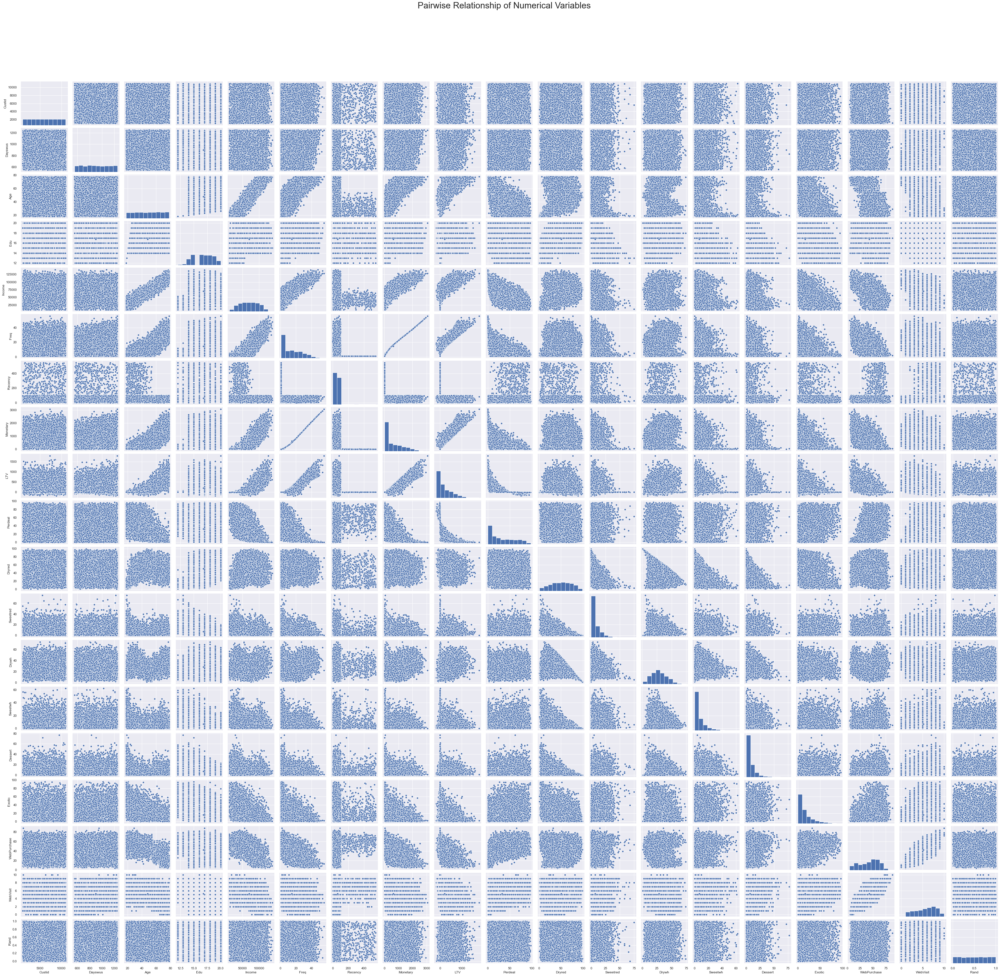

In [14]:
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.9)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=30)

#plt.savefig(os.path.join('..', 'figures', 'exp_analysis', 'pairwise_relationship_of_numerical_variables.png'), dpi=200)
plt.show()

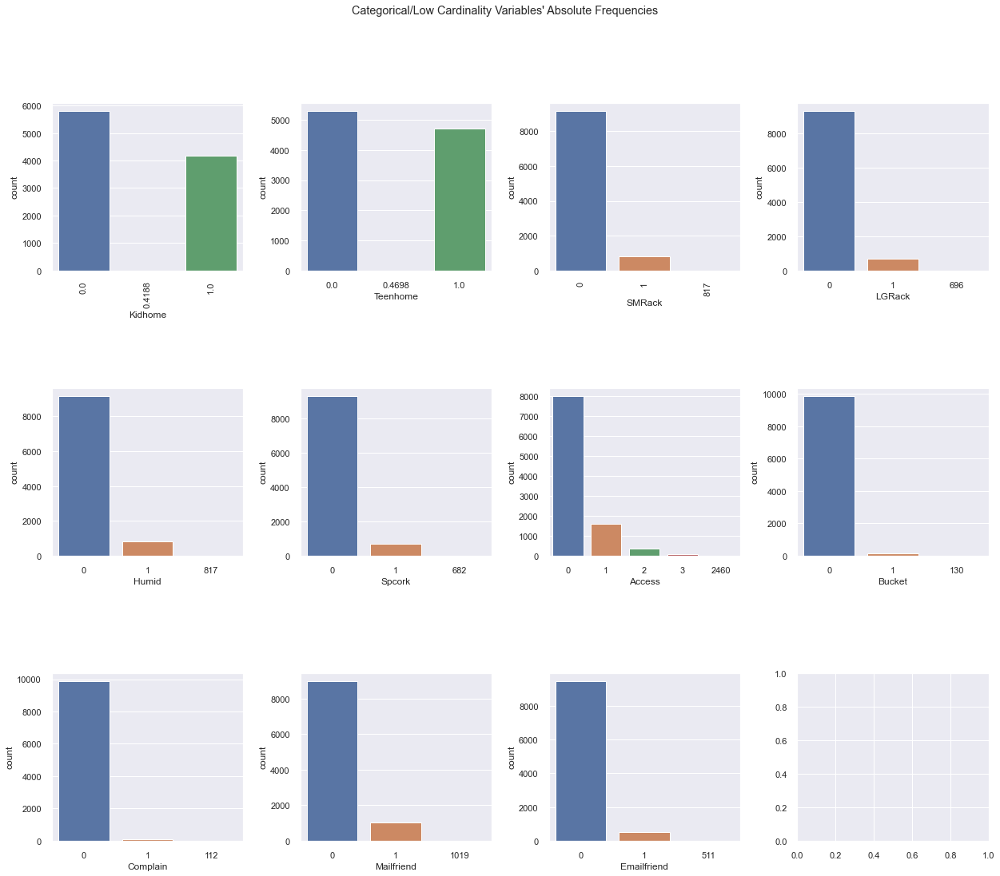

In [15]:
sns.set()

features = non_metric_features
# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(3, ceil(len(features) / 3), figsize=(21, 17))

# Plot data
# Iterate across axes objects and associate each bar plot:
for ax, feat in zip(axes.flatten(), features):
    sns.countplot(x=df[feat], ax=ax)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)
# Rotating X-axis labels
axes.flatten()[0].tick_params(axis='x', labelrotation = 90)
axes.flatten()[2].tick_params(axis='x', labelrotation = 90)
plt.subplots_adjust(wspace=0.3, hspace=0.7)

plt.show()

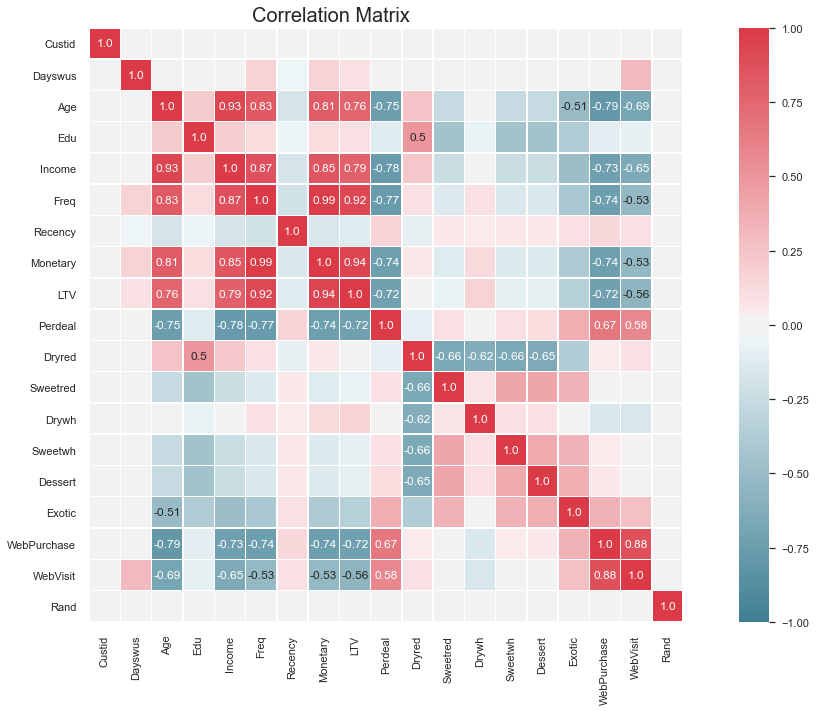

In [16]:
# Prepare figure
fig = plt.figure(figsize=(20, 10))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df[metric_features].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)


plt.show()

In [18]:
import phik

interval columns not set, guessing: ['Custid', 'Dayswus', 'Age', 'Edu', 'Income', 'Freq', 'Recency', 'Monetary', 'LTV', 'Perdeal', 'Dryred', 'Sweetred', 'Drywh', 'Sweetwh', 'Dessert', 'Exotic', 'WebPurchase', 'WebVisit', 'Rand']


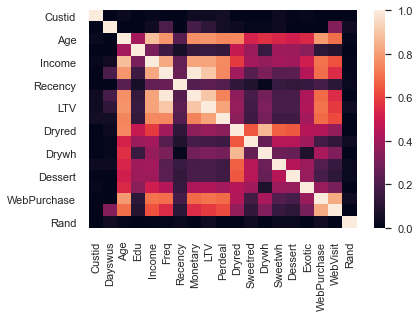

In [19]:
sns.heatmap(df[metric_features].phik_matrix())

### Data Preparation

##### Cleaning the data


In [36]:
df_clean = df.copy()

# Droping duplicated rows
df_clean.drop_duplicates(inplace=True)

In [37]:
df_clean.drop(df.tail(1).index,inplace=True)

In [39]:
df_clean[['Custid','Dayswus','Age','Edu','Income','Recency','WebVisit','LTV']] = df_clean[['Custid','Dayswus','Age','Edu','Income','Recency','WebVisit','LTV']].apply(np.int64)

In [23]:
df_clean.set_index('Custid', inplace=True)

In [24]:
# Droping irelevant columns
df_clean.drop(['Access', 'Rand'], axis=1, inplace=True)
df_clean.head()

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,...,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,,,,,,,,,,,,
5325,653,55,20,78473,0.0,0.0,20.0,18,826.0,445,...,36.0,5,0,0,0,0,0,0,0,0
3956,1041,75,18,105087,0.0,0.0,36.0,33,1852.0,539,...,20.0,4,0,0,0,1,0,0,0,0
3681,666,18,12,27984,1.0,0.0,4.0,56,39.0,-7,...,60.0,8,0,0,0,0,0,0,0,0
2829,1049,42,16,61748,1.0,1.0,2.0,46,37.0,-6,...,59.0,7,0,0,0,0,0,0,1,1
8788,837,47,16,65789,0.0,1.0,2.0,3,36.0,4,...,63.0,6,0,0,0,0,0,0,0,0


In [25]:
df_clean[['SMRack','LGRack','Humid','Spcork','Bucket','Complain','Mailfriend','Emailfriend']] = df_clean[['SMRack','LGRack','Humid','Spcork','Bucket','Complain','Mailfriend','Emailfriend']].apply(np.int32)

In [26]:
df = df_clean

In [27]:
df.head()

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,LTV,...,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend
Custid,,,,,,,,,,,,,,,,,,,,,
5325,653,55,20,78473,0.0,0.0,20.0,18,826.0,445,...,36.0,5,0,0,0,0,0,0,0,0
3956,1041,75,18,105087,0.0,0.0,36.0,33,1852.0,539,...,20.0,4,0,0,0,1,0,0,0,0
3681,666,18,12,27984,1.0,0.0,4.0,56,39.0,-7,...,60.0,8,0,0,0,0,0,0,0,0
2829,1049,42,16,61748,1.0,1.0,2.0,46,37.0,-6,...,59.0,7,0,0,0,0,0,0,1,1
8788,837,47,16,65789,0.0,1.0,2.0,3,36.0,4,...,63.0,6,0,0,0,0,0,0,0,0


###### Outlier removal

In [28]:
filters = (df['Recency']<500) &(df['LTV']<1250) & (df['Sweetred']<40 ) & (df['Drywh']<70) & (df['Sweetwh']<40) & (df['Dessert']<40) & (df['Exotic']<80 )
df_a = df[filters]
    
columns_df = df.shape[0]
columns_df_a = df_a.shape[0]
print("Percentage of data that have been eliminated: ", round(((1-(columns_df_a/columns_df))*100),2),"%")
print("Percentage of data kept after removing the outliers", round(((columns_df_a/columns_df)*100),2),"%")


Percentage of data that have been eliminated:  3.4 %
Percentage of data kept after removing the outliers 96.6 %


##### Construct data

In [29]:
df['AveragePurchase'] = df['Monetary'] / df['Freq']
df['AveragePurchase']= df['AveragePurchase'].round(2)

In [30]:
df.drop(['Monetary','Freq'],axis=1, inplace=True)

#### Modeling

In [31]:
def plotKElbow(cluster,df,metric):
    visualizer = KElbowVisualizer(cluster, k=(2,12), metric=metric, timings=False,locate_elbowbool=False)
    visualizer.fit(df)        
    visualizer.show()  

In [32]:
def kmeans_cluster(df,n_clust):
    kmclust = KMeans(n_clusters=n_clust, init='k-means++', n_init=15, random_state=1)
    df_labels = kmclust.fit_predict(df)
    return df_labels

In [33]:
def gmm_cluster(data, nclust):
    gmm=GaussianMixture(n_components=nclust, init_params='kmeans', random_state=0)
    gmm.fit(data)
    clust_labels = gmm.predict(data)
    return(clust_labels)

In [34]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        #ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [35]:
cluster = KMeans(random_state=0)

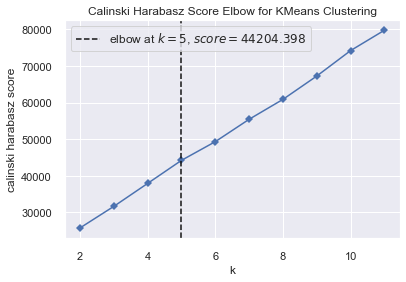

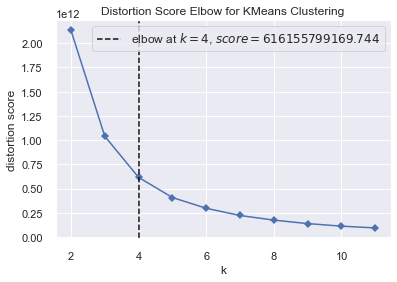

In [40]:
plotKElbow(cluster,df,'calinski_harabasz')
plotKElbow(cluster,df,'distortion')

In [41]:
df_copy= df.copy()
df['cluster_labels'] = kmeans_cluster(df_copy,4)

In [42]:
# Preparing the data
X = df.drop(columns='cluster_labels')
y = df.cluster_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = RandomForestClassifier()
dt.fit(X_train, y_train)

RandomForestClassifier()

##### Most Important Features

In [43]:
importances = dt.feature_importances_
indices = np.argsort(importances)

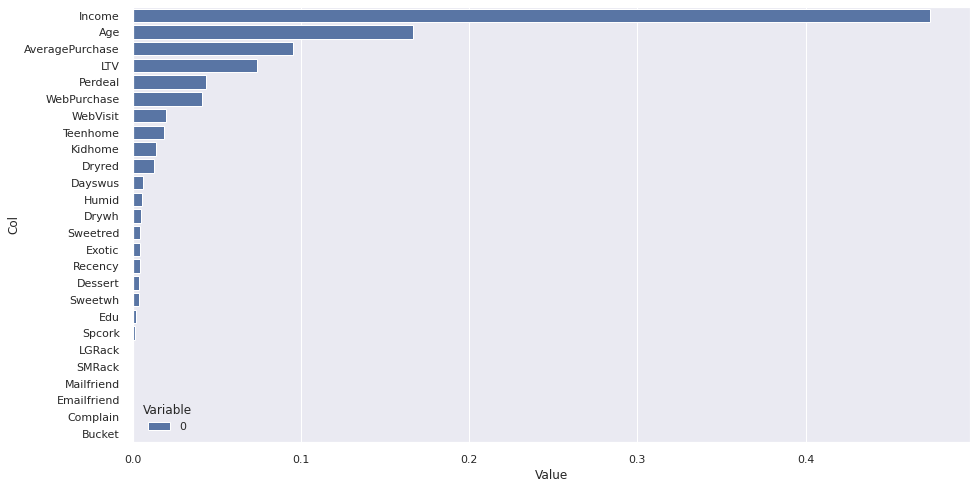

In [50]:
zippy = pd.DataFrame(zip(importances))
zippy['col'] = X_train.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

###### New dataframe

In [44]:
a = df.loc[:,['Income','Age','AveragePurchase','WebPurchase',
              'Teenhome','Sweetred','Sweetwh','Dessert']]

In [45]:
b = df.loc[:,['WebVisit','LTV','Perdeal',
               'Drywh','Exotic','Kidhome']]

In [46]:
overall=pd.merge(a,b,left_index=True,right_index=True)
overall.reset_index(inplace=True)

In [47]:
standard_overall=pd.DataFrame(StandardScaler().fit(overall).transform(overall),index=overall.index, columns=overall.columns)

###### K-means

In [48]:
standard_overall['k_means_overall_label']=kmeans_cluster(standard_overall,4)

###### Gaussian Mixture Model

In [49]:
gmm = GaussianMixture(init_params='kmeans', random_state=0)

In [50]:
standard_overall['gmm_overall_label']=gmm_cluster(standard_overall,4)

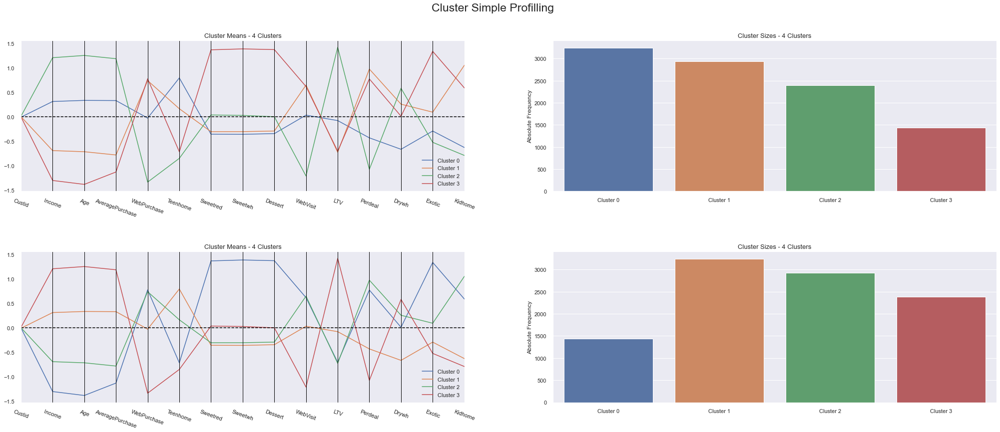

In [51]:
cluster_profiles(standard_overall, ["k_means_overall_label", "gmm_overall_label"], figsize=(35, 13), compar_titles=["K-Means - All Data", "GMM - All Data"])

In [59]:
two_dim = TSNE(random_state=42).fit_transform(standard_overall)

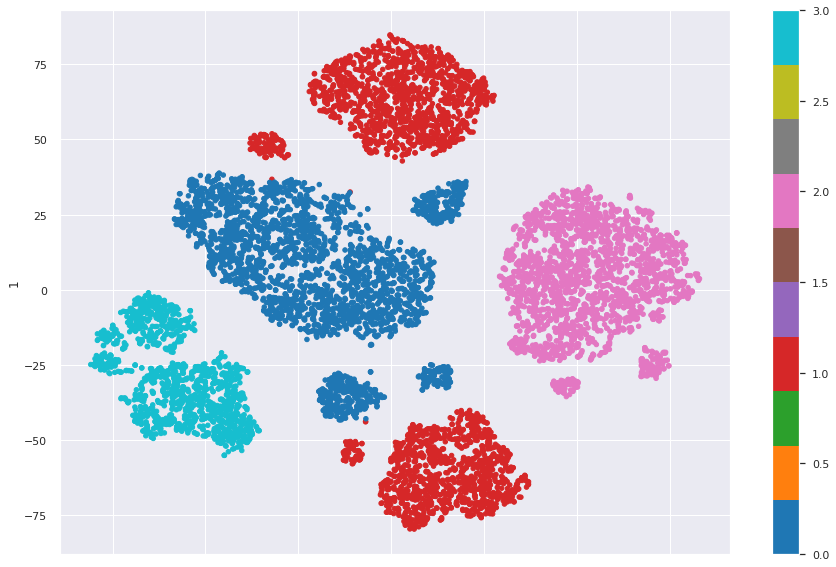

In [60]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c= standard_overall['k_means_overall_label'], colormap='tab10', figsize=(15,10))
plt.show()

#### K-means & Hierarchical Clustering

In [53]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [54]:
overall2=pd.merge(a,b,left_index=True,right_index=True)
overall2.reset_index(inplace=True)

In [55]:
standard_overall2=pd.DataFrame(StandardScaler().fit(overall2).transform(overall2),index=overall2.index, columns=overall2.columns)

In [56]:
kmeans_hc_labels2 = kmeans_cluster(overall2,30)
kmeans_hc_clusters2 = standard_overall2.copy()
kmeans_hc_clusters2["kmeans_hc_labels2"] = kmeans_hc_labels2

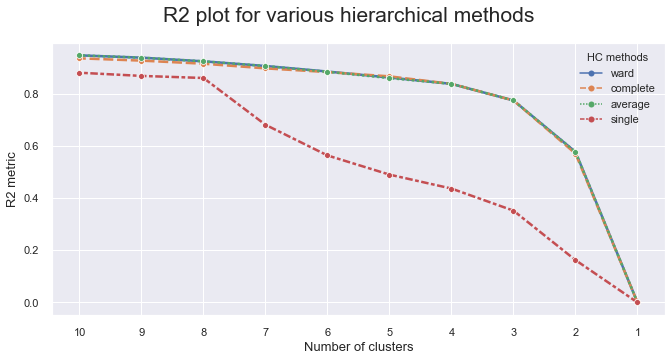

In [57]:
kmeans_hc_clusters2 = kmeans_hc_clusters2.groupby("kmeans_hc_labels2").mean()
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack([get_r2_hc(df=kmeans_hc_clusters2, link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [58]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclabel=hclust.fit_predict(kmeans_hc_clusters2)

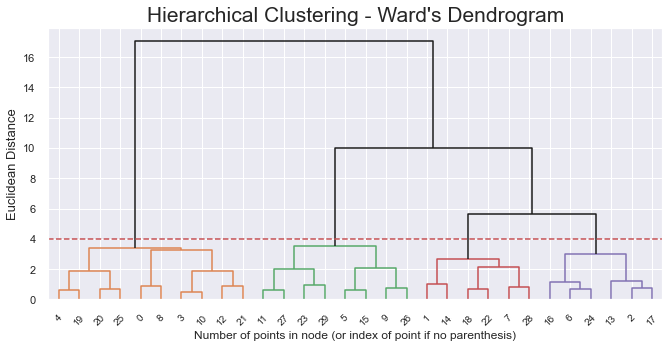

In [61]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 4
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

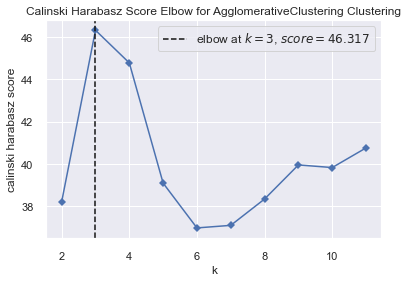

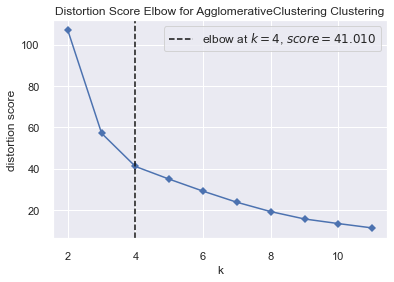

In [60]:
Hclustering = AgglomerativeClustering(linkage=linkage)
plotKElbow(Hclustering,kmeans_hc_clusters2,'calinski_harabasz')
plotKElbow(Hclustering,kmeans_hc_clusters2,'distortion')

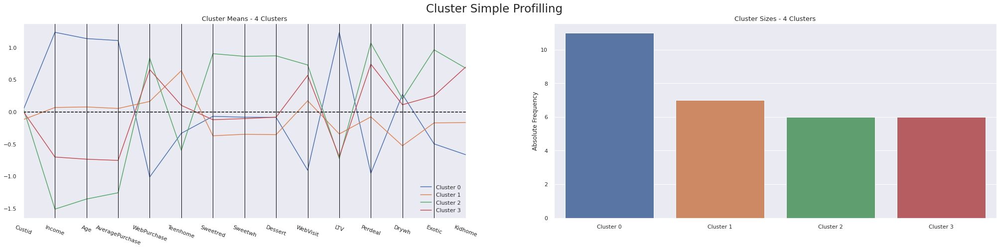

In [74]:
hc = AgglomerativeClustering(n_clusters=4, linkage=linkage)
labels = hc.fit_predict(kmeans_hc_clusters2)

# Getting the HC labels for each observation in the main dataframe
kmeans_hc_clusters2['kmeans_hc_lables2']=labels
cluster_profiles(kmeans_hc_clusters2,["kmeans_hc_lables2"], figsize=(35, 7),compar_titles=["K-Means + HC - Value"])

In [104]:
number_clusters = 4
kmclust = KMeans(n_clusters = number_clusters, 
                 init='k-means++', 
                 n_init = 15, 
                 random_state=73)

km_labels = kmclust.fit_predict(standard_overall2)

print(kmclust.inertia_)

df_donation_clust = pd.concat((df, pd.Series(km_labels, name='kmeans_1')), axis=1)
df_donation_clust.groupby('kmeans_1').mean()

73588.860443744


,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend,AveragePurchase,cluster_labels
kmeans_1,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,901.080281,47.930631,16.742790,69813.175370,0.408418,0.461419,65.338270,212.189400,31.790335,50.268122,6.922058,28.731099,7.135620,6.932190,16.478566,42.162120,5.164458,0.075604,0.071707,0.073266,0.063133,0.015588,0.009353,0.101325,0.048324,31.782268,0.982073
1.0,896.024658,48.123973,16.717808,70207.387671,0.411644,0.487671,60.717808,208.139384,32.463014,51.033219,7.092123,27.889384,6.889041,7.066438,16.397945,42.556164,5.244178,0.075685,0.078425,0.082534,0.069521,0.013356,0.009589,0.097945,0.046233,32.052548,0.946918
2.0,894.728479,47.968904,16.757679,69938.096701,0.427380,0.458855,62.039060,211.135381,32.664012,49.752370,7.080774,29.019340,7.209708,6.898749,16.360258,41.994312,5.149033,0.084566,0.066743,0.087220,0.072810,0.012514,0.013273,0.099735,0.050436,31.853876,0.990140
3.0,903.908754,47.764243,16.770264,69581.118573,0.419639,0.468272,62.984252,206.948587,32.177860,50.643817,7.002316,28.526170,6.900417,6.909217,16.661417,42.531728,5.259379,0.085225,0.059287,0.075961,0.056971,0.010190,0.009264,0.109773,0.054655,32.023849,0.968041


In [108]:
(df.groupby(by = [km_labels]).mean())

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend,AveragePurchase,cluster_labels
0,898.764460,24.045296,14.900348,33998.080836,0.708711,0.113589,82.771429,4.103136,53.927526,17.605575,17.799303,28.662021,18.169338,17.747735,39.579094,56.723345,6.654355,0.089199,0.000000,0.000000,0.000697,0.000000,0.009756,0.207666,0.153310,16.488578,1.868990
1,902.714330,53.703852,17.097381,78507.008012,0.109091,0.865331,52.275809,186.277966,20.392912,67.101387,4.256086,20.167951,4.199076,4.236364,11.522650,41.874268,5.293374,0.068105,0.117720,0.031741,0.046533,0.023421,0.009861,0.077658,0.017565,36.474955,0.402465
2,898.288639,35.581713,17.095872,50835.796998,0.937223,0.551689,73.417946,-2.569089,59.538724,54.282839,4.656090,31.750597,4.633913,4.656090,18.165814,56.035824,6.724326,0.103037,0.011259,0.000000,0.003071,0.000341,0.013988,0.119072,0.079154,21.249498,1.215967
3,891.210130,69.572625,16.919213,103181.821683,0.029301,0.046044,50.426120,622.805358,2.470908,42.576810,7.344077,35.821264,7.290498,6.953537,7.549184,17.681457,2.398912,0.069485,0.117622,0.298870,0.218083,0.022185,0.010465,0.050230,0.000837,48.186844,0.915027


In [112]:
#Feature average of each cluster 
(df.groupby(by = [km_labels]).count())

,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Complain,Mailfriend,Emailfriend,AveragePurchase,cluster_labels
0,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435,1435
1,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245,3245
2,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931,2931
3,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389,2389


In [ ]:
X_normalized = normalize(standard_overall2) 
  
# Converting the numpy array into a pandas DataFrame 
X_normalized = pd.DataFrame(X_normalized) 
  
# Reducing the dimensions of the data 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(X_normalized) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head() 

,P1,P2
0,0.726340,0.064778
1,0.828804,-0.139349
2,-0.675916,-0.520893
3,-0.634794,0.354814
4,-0.321007,0.639146


In [ ]:
# Building the clustering model 
spectral_model_rbf = SpectralClustering(n_clusters = 4, affinity ='rbf') 
  
# Training the model and Storing the predicted cluster labels 
labels_rbf = spectral_model_rbf.fit_predict(X_principal)

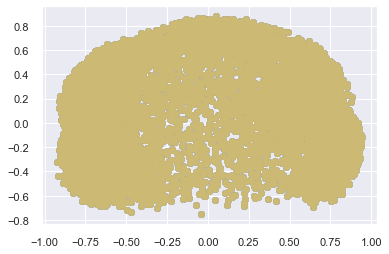

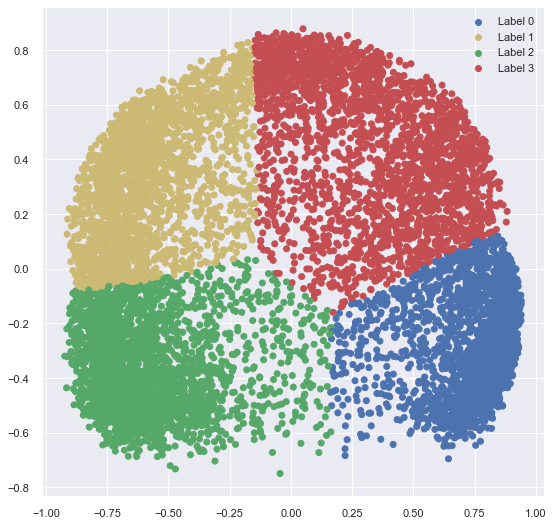

In [ ]:
# Building the label to colour mapping 
colours = {} 
colours[0] = 'b'
colours[1] = 'y'
colours[2] = 'g'
colours[3] = 'r'
  
# Building the colour vector for each data point 
cvec = [colours[label] for label in labels_rbf] 
  
# Plotting the clustered scatter plot 
  
b = plt.scatter(X_principal['P1'], X_principal['P2'], color ='b'); 
y = plt.scatter(X_principal['P1'], X_principal['P2'], color ='y'); 
g = plt.scatter(X_principal['P1'], X_principal['P2'], color ='g');
r = plt.scatter(X_principal['P1'], X_principal['P2'], color ='r');
  
plt.figure(figsize =(9, 9)) 
plt.scatter(X_principal['P1'], X_principal['P2'], c = cvec) 
plt.legend((b, y, g, r), ('Label 0', 'Label 1', 'Label 2', 'Label 3')) 
plt.show() 

#### MiniBatch K-means

In [ ]:
from sklearn.cluster import MiniBatchKMeans

In [ ]:
MiniBatch = MiniBatchKMeans(n_clusters=None,random_state=0)

In [ ]:
minibatch=pd.merge(a,b,left_index=True,right_index=True)
minibatch.reset_index(inplace=True)

In [ ]:
standard_minibatch=pd.DataFrame(StandardScaler().fit(minibatch).transform(minibatch),index=minibatch.index, columns=minibatch.columns)

C:\Users\Madal\anaconda3\lib\site-packages\yellowbrick\utils\kneed.py:182: YellowbrickWarning: No "knee" or "elbow point" detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\Madal\anaconda3\lib\site-packages\yellowbrick\utils\kneed.py:140: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\Madal\anaconda3\lib\site-packages\yellowbrick\cluster\elbow.py:343: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


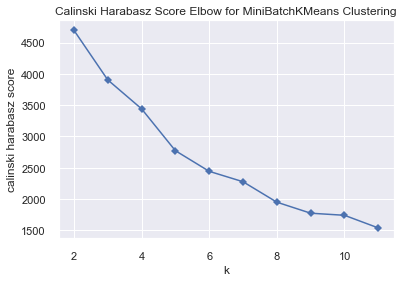

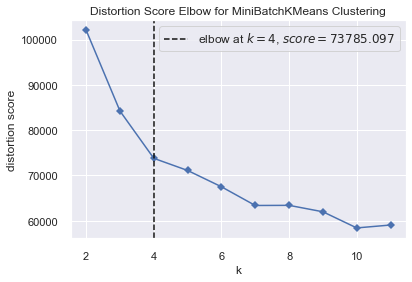

In [ ]:
plotKElbow(MiniBatch,standard_minibatch,'calinski_harabasz')
plotKElbow(MiniBatch,standard_minibatch,'distortion')

In [ ]:
miniBatchCluster = MiniBatchKMeans(n_clusters=4, init='k-means++', n_init=15, random_state=1)
miniBatch_labels = miniBatchCluster.fit_predict(standard_minibatch)

In [ ]:
miniBatch_df=standard_minibatch.copy()
miniBatch_df['miniBatch_labels']=miniBatch_labels

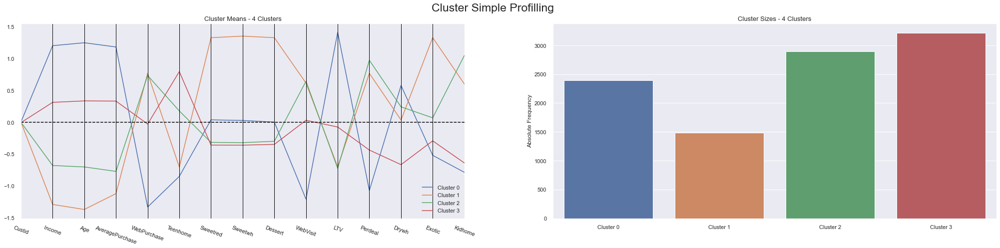

In [ ]:
cluster_profiles(miniBatch_df,["miniBatch_labels"], figsize=(35, 7),compar_titles=["MiniBatchKMeans Clustering"])

In [ ]:
two_dim = TSNE(random_state=42).fit_transform(miniBatch_df)

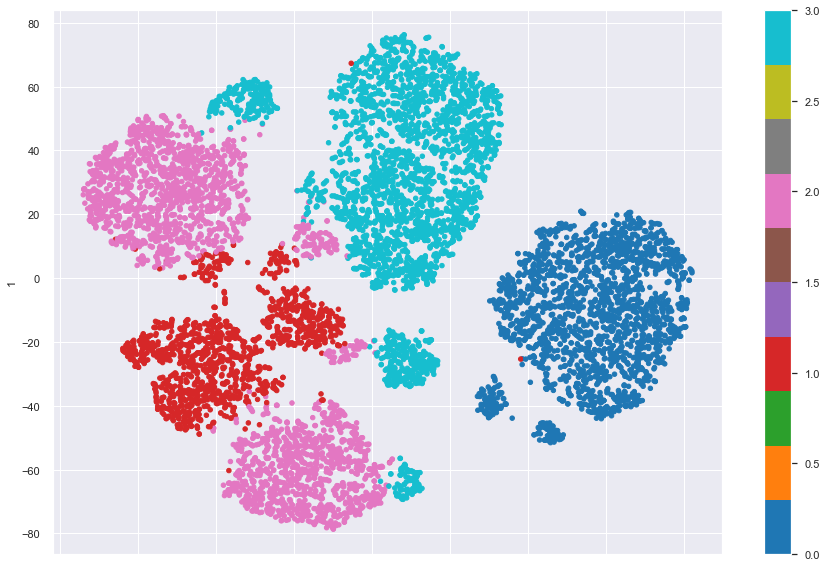

In [ ]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=miniBatch_df['miniBatch_labels'], colormap='tab10', figsize=(15,10))
plt.show()